In [1]:
# pip install git+https://github.com/ourownstory/neural_prophet.git

In [2]:
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

In [3]:
import pandas as pd
import plotly.express as px
import numpy as np
import plotly.graph_objects as go
import matplotlib.pylab as plt
import seaborn as sns
import plotly.io as pio
import itertools

from statsmodels.tsa.stattools import kpss, adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf 
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

from neuralprophet import NeuralProphet, set_random_seed


In [4]:
set_random_seed(0)
np.random.seed(1)
pio.renderers.default='notebook'

In [5]:
def missing_values(df):
    missing_count = df.isnull().sum()
    percent_missing = missing_count * 100 / len(df)
    values_available = len(df) - missing_count

    missing_value_df = pd.DataFrame({
        'column_name': df.columns,
        "non_misisng_count": values_available,
        'missing_count': missing_count,
        
        'percent_missing': percent_missing
    })
    missing_value_df.sort_values('percent_missing', inplace=True)

    return missing_value_df

In [6]:
def handle_outliers(ar):
    upper_limit = ar.quantile(0.95)
    lower_limit = ar.quantile(0.05)
    if lower_limit < 1:
        lower_limit = 1
        
    ar[ar > upper_limit] = upper_limit
    ar[ar < lower_limit] = lower_limit

    
def kpss_test(series, strItem, **kw):    
    try:
        statistic, p_value, n_lags, critical_values = kpss(series, regression='c', **kw)
        return { 'KPSS Statistic' : statistic, 'p_value' : p_value, 'Critical value': critical_values['5%'] }
    except:
        return { 'KPSS Statistic' : 0, 'p_value' : 0, 'Critical value': 0 }
        pass
        

In [7]:
def downcast(df):

    cols = df.dtypes.index.tolist()
    types = df.dtypes.values.tolist()

    for i,t in enumerate(types):

        if 'int' in str(t):
            if df[cols[i]].min() > np.iinfo(np.int8).min and df[cols[i]].max() < np.iinfo(np.int8).max:
                df[cols[i]] = df[cols[i]].astype(np.int8)
            elif df[cols[i]].min() > np.iinfo(np.int16).min and df[cols[i]].max() < np.iinfo(np.int16).max:
                df[cols[i]] = df[cols[i]].astype(np.int16)
            elif df[cols[i]].min() > np.iinfo(np.int32).min and df[cols[i]].max() < np.iinfo(np.int32).max:
                df[cols[i]] = df[cols[i]].astype(np.int32)
            else:
                df[cols[i]] = df[cols[i]].astype(np.int64)

        elif 'float' in str(t):
            if df[cols[i]].min() > np.finfo(np.float16).min and df[cols[i]].max() < np.finfo(np.float16).max:
                df[cols[i]] = df[cols[i]].astype(np.float16)
            elif df[cols[i]].min() > np.finfo(np.float32).min and df[cols[i]].max() < np.finfo(np.float32).max:
                df[cols[i]] = df[cols[i]].astype(np.float32)
            else:
                df[cols[i]] = df[cols[i]].astype(np.float64)

        elif t == np.object:
            if cols[i] == 'date':
                df[cols[i]] = pd.to_datetime(df[cols[i]], format='%Y-%m-%d')
            else:
                df[cols[i]] = df[cols[i]].astype('category')

    return df 

In [8]:
sales = pd.read_csv("D:/Research Proposal Raja Sekhar Somepalli/m5-forecasting-accuracy/sales_train_evaluation.csv")
# prices = pd.read_csv("D:/Research Proposal Raja Sekhar Somepalli/m5-forecasting-accuracy/sell_prices.csv")
calendar = pd.read_csv("D:/Research Proposal Raja Sekhar Somepalli/m5-forecasting-accuracy/calendar.csv")

In [9]:
lst_selItems = ['FOODS_3_252_TX_2_evaluation','FOODS_3_555_CA_1_evaluation','FOODS_3_714_TX_3_evaluation',
 'FOODS_3_586_WI_1_evaluation','FOODS_3_252_TX_1_evaluation','FOODS_3_714_TX_2_evaluation']

In [10]:
sales = sales.loc[sales.id.isin(lst_selItems)]
sales = downcast(sales)
calendar = downcast(calendar)
# prices = downcast(prices)

In [11]:
cols_id = ['id', 'item_id',  'dept_id', 'cat_id', 'store_id', 'state_id']
df_sales=pd.melt(sales, id_vars=cols_id, var_name='d', value_name='sales')
df_sales= pd.merge(df_sales, calendar, on='d', how='left')
df_plot = df_sales
df_sales = df_sales[['id','date','sales']]
df_sales = downcast(df_sales)
df_sales

,id,date,sales
0,FOODS_3_555_CA_1_evaluation,2011-01-29,23
1,FOODS_3_252_TX_1_evaluation,2011-01-29,45
2,FOODS_3_252_TX_2_evaluation,2011-01-29,52
3,FOODS_3_714_TX_2_evaluation,2011-01-29,26
4,FOODS_3_714_TX_3_evaluation,2011-01-29,17
...,...,...,...
11641,FOODS_3_252_TX_1_evaluation,2016-05-22,56
11642,FOODS_3_252_TX_2_evaluation,2016-05-22,72
11643,FOODS_3_714_TX_2_evaluation,2016-05-22,39
11644,FOODS_3_714_TX_3_evaluation,2016-05-22,10


In [12]:
lst_events = calendar.event_name_1.dropna().unique().to_list()
events_df = pd.DataFrame(columns = ['event', 'ds'])
for strEvent in lst_events:
    events_df = events_df.append(pd.DataFrame({
        'event': strEvent,
        'ds': calendar.loc[(calendar[['event_name_1', 'event_name_2']] == strEvent).any(axis=1)].date.unique()
    }))
    
for strEvent in ['snap_CA','snap_TX','snap_WI']:
     events_df = events_df.append(pd.DataFrame({
        'event': strEvent,
        'ds': calendar.loc[(calendar[strEvent] > 0)].date.unique()
    }))

lst_events.extend(['snap_CA','snap_TX','snap_WI'])

events_df

,event,ds
0,SuperBowl,2011-02-06 00:00:00
1,SuperBowl,2012-02-05 00:00:00
2,SuperBowl,2013-02-03 00:00:00
3,SuperBowl,2014-02-02 00:00:00
4,SuperBowl,2015-02-01 00:00:00
...,...,...
645,snap_WI,2016-06-09 00:00:00
646,snap_WI,2016-06-11 00:00:00
647,snap_WI,2016-06-12 00:00:00
648,snap_WI,2016-06-14 00:00:00


In [13]:
events_df.event.value_counts()

snap_WI                650
snap_TX                650
snap_CA                650
Mother's day             6
Easter                   6
ValentinesDay            6
Father's day             6
NBAFinalsEnd             6
NBAFinalsStart           6
MemorialDay              6
SuperBowl                6
Cinco De Mayo            6
Pesach End               6
PresidentsDay            6
LentStart                6
LentWeek2                6
Ramadan starts           6
StPatricksDay            6
Purim End                6
OrthodoxEaster           6
Eid al-Fitr              5
LaborDay                 5
ColumbusDay              5
Halloween                5
EidAlAdha                5
Thanksgiving             5
Christmas                5
Chanukah End             5
NewYear                  5
OrthodoxChristmas        5
MartinLutherKingDay      5
IndependenceDay          5
VeteransDay              5
Name: event, dtype: int64

In [14]:
del sales, calendar

In [15]:
fig = go.Figure()
for item in lst_selItems:
    samp = df_sales.loc[(df_sales.id == item)].sort_values(by=['date'], ascending=True)
    fig.add_trace(go.Scatter(x=samp.date, y=samp.sales, name = item))

fig.update_layout(xaxis_title="Time", yaxis_title="Sales",title="",title_x=0.5)
fig.show()

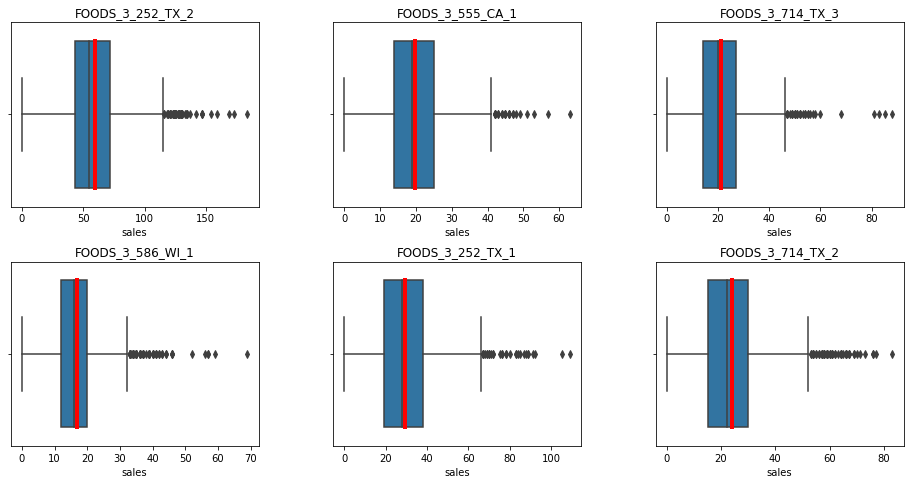

In [16]:
plt.figure(figsize = (16, 6))
meanprops = dict(linestyle='-', linewidth=4, color='red')
int_figno = 1

for strItem in lst_selItems:
    df_filt = df_sales.loc[df_sales.id == strItem].sales
    plt.subplot(2,3,int_figno)
    sns.boxplot(df_filt, meanline=True, showmeans = True, meanprops = meanprops)
    plt.title(strItem.replace("_evaluation",''))
    int_figno += 1
    
    
plt.subplots_adjust(top = 0.99, bottom=0.01, hspace= 0.3, wspace= 0.3)
plt.show()
    


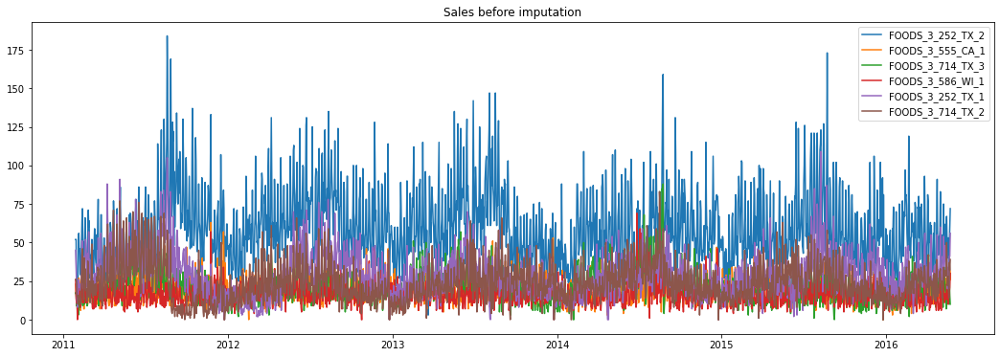

In [17]:
plt.figure(figsize=(18,6))
for strItem in lst_selItems:
    df_items = df_sales.loc[df_sales.id == strItem]
    df_items=df_items[['date','sales']]
    df_items = df_items.set_index('date')
    plt.plot(df_items, label=strItem.replace("_evaluation",''))
    
plt.legend(loc='best')
plt.title('Sales before imputation')
plt.show()

In [18]:
for strItem in lst_selItems:
    df_filt = df_sales.loc[df_sales.id == strItem]
    df_plot_filt = df_plot.loc[df_plot.id == strItem]
    handle_outliers(df_filt.sales)
    handle_outliers(df_plot_filt.sales)
    df_sales = df_sales.loc[df_sales.id != strItem]
    df_sales = df_sales.append(df_filt)
    df_plot = df_plot.loc[df_plot.id != strItem]
    df_plot = df_plot.append(df_plot_filt)

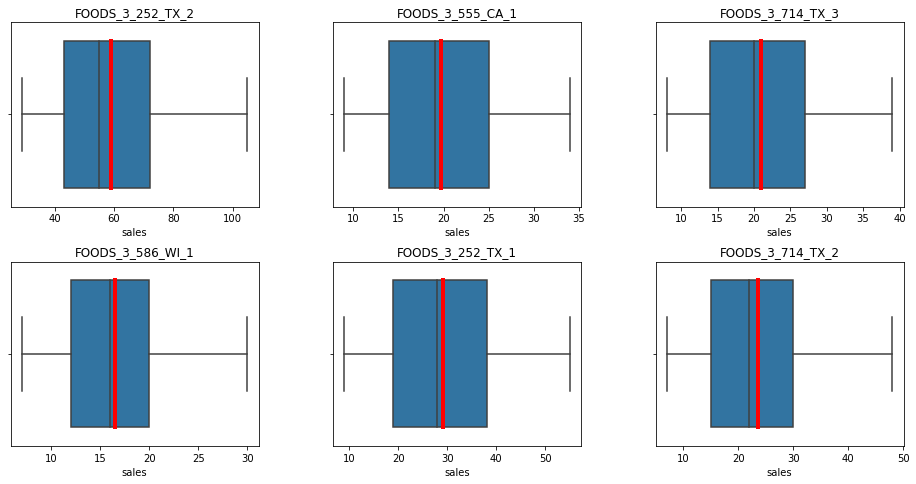

In [19]:
plt.figure(figsize = (16, 6))
meanprops = dict(linestyle='-', linewidth=4, color='red')
int_figno = 1

for strItem in lst_selItems:
    df_filt = df_sales.loc[df_sales.id == strItem].sales
    plt.subplot(2,3,int_figno)
    sns.boxplot(df_filt, meanline=True, showmeans = True, meanprops = meanprops)
    plt.title(strItem.replace("_evaluation",''))
    int_figno += 1
    
    
plt.subplots_adjust(top = 0.99, bottom=0.01, hspace= 0.3, wspace= 0.3)
plt.show()
    

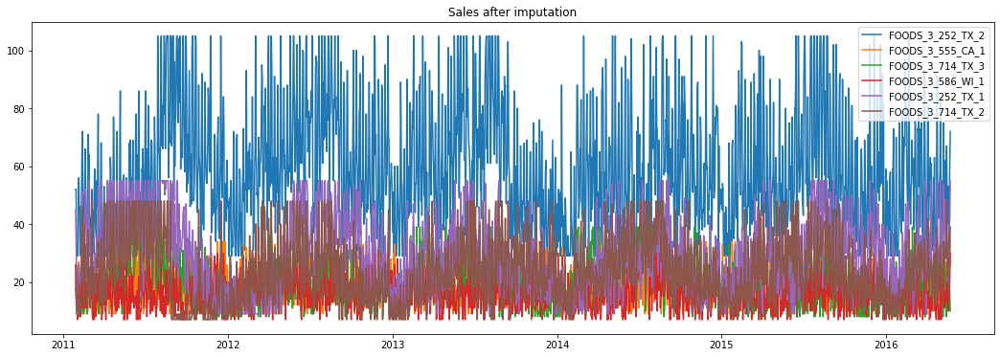

In [20]:
plt.figure(figsize=(18,6))
for strItem in lst_selItems:
    df_items = df_sales.loc[df_sales.id == strItem]
    df_items=df_items[['date','sales']]
    df_items = df_items.set_index('date')
    plt.plot(df_items, label=strItem.replace("_evaluation",''))
    
plt.legend(loc='best')
plt.title('Sales after imputation')
plt.show()

In [21]:
events_df

,event,ds
0,SuperBowl,2011-02-06 00:00:00
1,SuperBowl,2012-02-05 00:00:00
2,SuperBowl,2013-02-03 00:00:00
3,SuperBowl,2014-02-02 00:00:00
4,SuperBowl,2015-02-01 00:00:00
...,...,...
645,snap_WI,2016-06-09 00:00:00
646,snap_WI,2016-06-11 00:00:00
647,snap_WI,2016-06-12 00:00:00
648,snap_WI,2016-06-14 00:00:00


In [22]:
def univariatePlot(data,col,width=20,height=10,rotation=90):
                
        fig, ax = plt.subplots(figsize=(width,height))
        sns.countplot(data = data, y= col,order=data[col].value_counts().index)
        plt.xticks(rotation=rotation,fontsize=12)
        plt.yticks(fontsize=12)
        plt.xlabel(col,fontsize=14)
        plt.ylabel('count',fontsize=12)
        plt.tight_layout()
        for p in ax.patches:
                if float(p.get_height()) > 0:
                    height = p.get_height()
                    ax.annotate('{:1.2f}%'.format((height*100)/float(len(data))), (p.get_x()+0.05, height+50),weight='bold',fontsize=12)  
                else:
                    height = .00000001
                    ax.annotate('{:1.2f}%'.format((height*100)/float(len(data))), (p.get_x()+0.05, height+20),weight='bold',fontsize=12)  
        
plt.show()

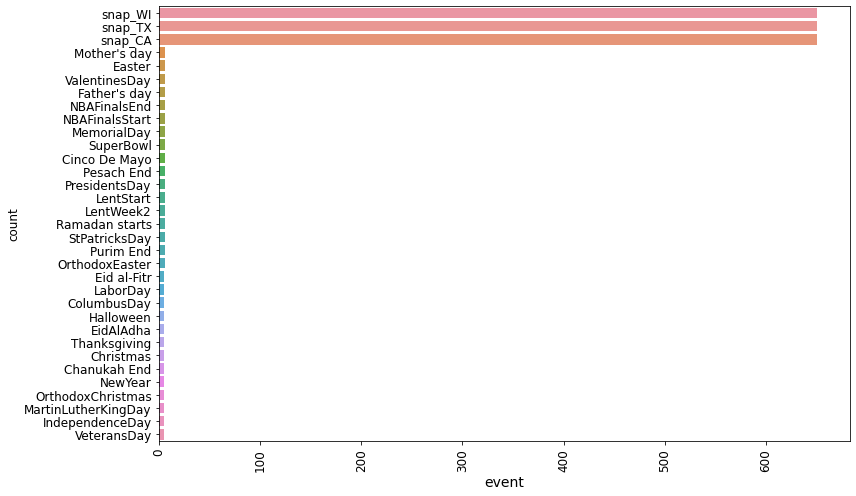

In [23]:
univariatePlot(events_df,'event',12,7)

In [24]:
df_plot

,id,item_id,dept_id,cat_id,store_id,state_id,d,sales,date,wm_yr_wk,...,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
2,FOODS_3_252_TX_2_evaluation,FOODS_3_252,FOODS_3,FOODS,TX_2,TX,d_1,52,2011-01-29,11101,...,1,1,2011,NaN,NaN,NaN,NaN,0,0,0
8,FOODS_3_252_TX_2_evaluation,FOODS_3_252,FOODS_3,FOODS,TX_2,TX,d_2,52,2011-01-30,11101,...,2,1,2011,NaN,NaN,NaN,NaN,0,0,0
14,FOODS_3_252_TX_2_evaluation,FOODS_3_252,FOODS_3,FOODS,TX_2,TX,d_3,29,2011-01-31,11101,...,3,1,2011,NaN,NaN,NaN,NaN,0,0,0
20,FOODS_3_252_TX_2_evaluation,FOODS_3_252,FOODS_3,FOODS,TX_2,TX,d_4,29,2011-02-01,11101,...,4,2,2011,NaN,NaN,NaN,NaN,1,1,0
26,FOODS_3_252_TX_2_evaluation,FOODS_3_252,FOODS_3,FOODS,TX_2,TX,d_5,29,2011-02-02,11101,...,5,2,2011,NaN,NaN,NaN,NaN,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11619,FOODS_3_714_TX_2_evaluation,FOODS_3_714,FOODS_3,FOODS,TX_2,TX,d_1937,25,2016-05-18,11616,...,5,5,2016,NaN,NaN,NaN,NaN,0,0,0
11625,FOODS_3_714_TX_2_evaluation,FOODS_3_714,FOODS_3,FOODS,TX_2,TX,d_1938,14,2016-05-19,11616,...,6,5,2016,NaN,NaN,NaN,NaN,0,0,0
11631,FOODS_3_714_TX_2_evaluation,FOODS_3_714,FOODS_3,FOODS,TX_2,TX,d_1939,37,2016-05-20,11616,...,7,5,2016,NaN,NaN,NaN,NaN,0,0,0
11637,FOODS_3_714_TX_2_evaluation,FOODS_3_714,FOODS_3,FOODS,TX_2,TX,d_1940,32,2016-05-21,11617,...,1,5,2016,NaN,NaN,NaN,NaN,0,0,0


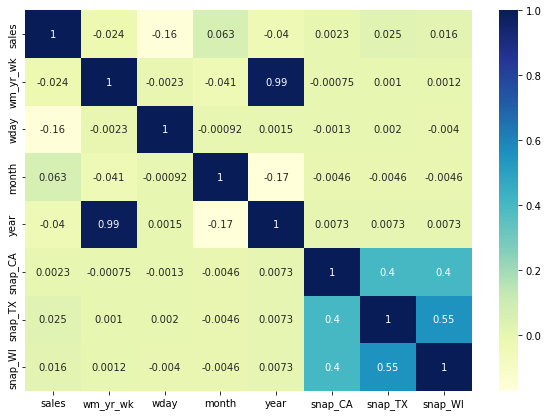

In [25]:

plt.figure(figsize = (10, 7))
sns.heatmap(df_plot.corr(), annot = True, cmap="YlGnBu")
plt.show()

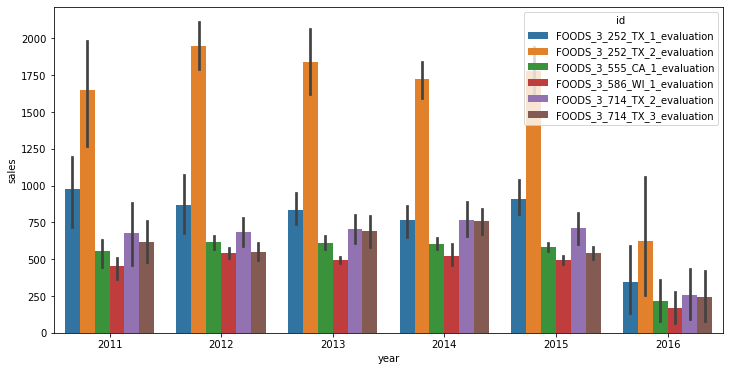

In [26]:
sales = pd.DataFrame(df_plot.groupby(['year', 'month','id'])['sales'].sum())
sales.reset_index(inplace=True)

plt.figure(figsize=(12, 6))
sns.barplot(x = 'year', y = 'sales', hue = 'id', data = sales)
plt.show()

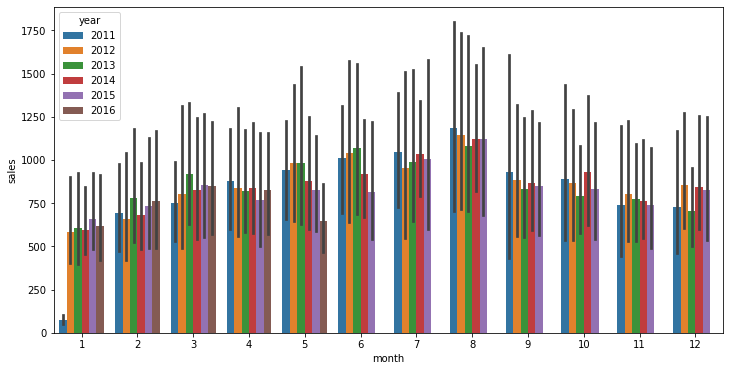

In [27]:
plt.figure(figsize=(12, 6))
sns.barplot(x = 'month', y = 'sales', hue = 'year', data = sales)
plt.show()

<AxesSubplot:xlabel='month'>

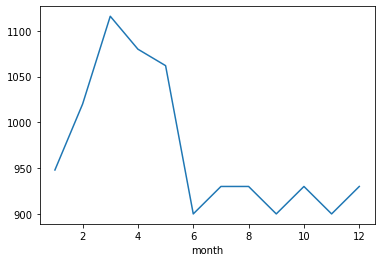

In [28]:
cntmonth = df_plot.groupby('month').count()['sales']
cntmonth.plot(kind='line')

<AxesSubplot:xlabel='wday'>

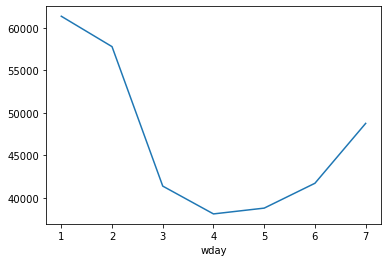

In [29]:
df_plot.groupby('wday').sum()['sales'].plot(kind='line')

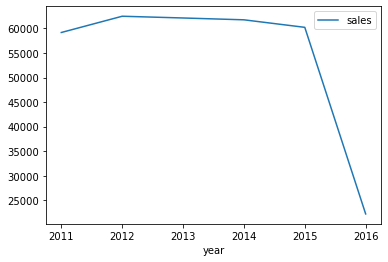

In [30]:
sales=df_plot.groupby(['year'],as_index=False,sort=False).agg(sales=('sales',np.sum))
sales.plot(x='year',y='sales')
plt.show()

In [31]:
kpss_values = pd.DataFrame()
lst_stat_KPSS = []
for strItem in lst_selItems:
    try:
        result = kpss_test(df_sales.loc[df_sales.id == strItem].sales, strItem)
        if result['p_value'] > 0.05:
            kpss_values = kpss_values.append(pd.DataFrame({'Item': [strItem],
                                            'KPSS Statistic': [result['KPSS Statistic']],
                                            'Critical Values @0.05': result['Critical value'],
                                            'P Value' : [result['p_value']],
                                            'total_sales' : [df_sales.loc[df_sales.id == strItem].sales.sum()]
                                           }))
            lst_stat_KPSS.append(strItem)
    except:
        pass
    
kpss_values  

WARNING - (py.warnings._showwarnmsg) - C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.



WARNING - (py.warnings._showwarnmsg) - C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.



WARNING - (py.warnings._showwarnmsg) - C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.



WARNING - (py.warnings._showwarnmsg) - C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning:


,Item,KPSS Statistic,Critical Values @0.05,P Value,total_sales
0,FOODS_3_252_TX_2_evaluation,0.414138,0.463,0.071061,114687
0,FOODS_3_555_CA_1_evaluation,0.318034,0.463,0.100000,38182
0,FOODS_3_714_TX_3_evaluation,0.241689,0.463,0.100000,40779
0,FOODS_3_586_WI_1_evaluation,0.276754,0.463,0.100000,32081
0,FOODS_3_252_TX_1_evaluation,0.354350,0.463,0.096832,56532
0,FOODS_3_714_TX_2_evaluation,0.131309,0.463,0.100000,45690


In [32]:
adf_values = pd.DataFrame()
lst_adf_Stat = []
for strItem in lst_selItems:
    adf_test = adfuller(df_sales.loc[df_sales.id == strItem].sales)
    if adf_test[1] <= 0.5:
        adf_values = adf_values.append(pd.DataFrame({'Item': [strItem],
                                        'ADF Statistic': [adf_test[0]],
                                        'Critical Values @0.05': [adf_test[4]['5%']],
                                        'P Value' : [adf_test[1]],
                                        'total_sales' : [df_sales.loc[df_sales.id == strItem].sales.sum()]

                                       }))
        lst_adf_Stat.append(strItem)
adf_values  

,Item,ADF Statistic,Critical Values @0.05,P Value,total_sales
0,FOODS_3_252_TX_2_evaluation,-4.157369,-2.863051,7.773624e-04,114687
0,FOODS_3_555_CA_1_evaluation,-6.281969,-2.863051,3.777219e-08,38182
0,FOODS_3_714_TX_3_evaluation,-3.184919,-2.863051,2.087437e-02,40779
0,FOODS_3_586_WI_1_evaluation,-5.432891,-2.863049,2.888060e-06,32081
0,FOODS_3_252_TX_1_evaluation,-3.248840,-2.863051,1.732608e-02,56532
0,FOODS_3_714_TX_2_evaluation,-3.885015,-2.863051,2.147940e-03,45690


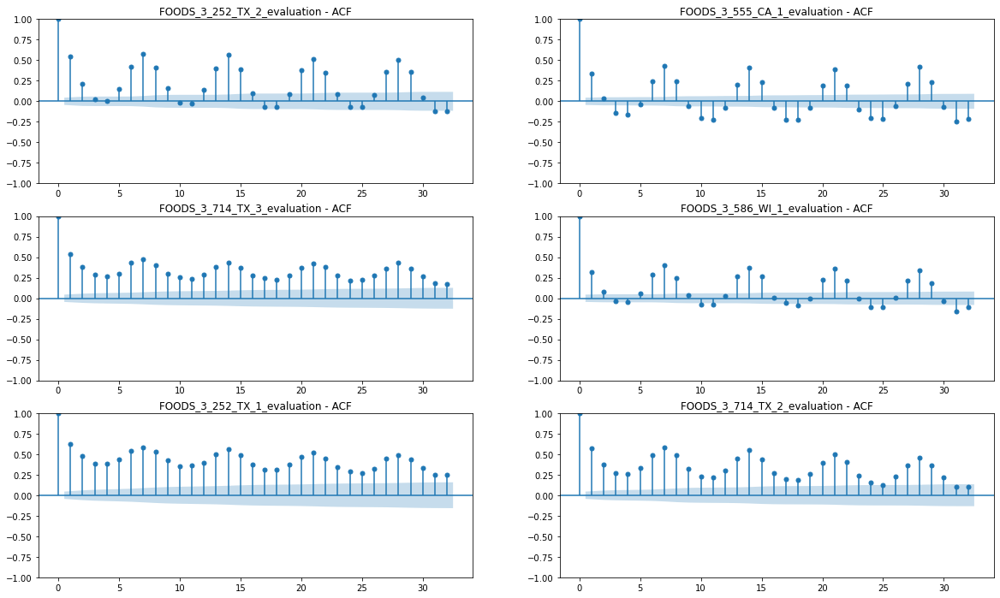

In [33]:
plt.figure(figsize=(20,12))
int_figno = 1
for strItem in lst_selItems:
    df_filt = df_sales.loc[df_sales.id == strItem].sales
    plt.subplot(3,2,int_figno)
    plot_acf(df_filt, ax=plt.gca(), lags = 32)
    plt.title(strItem + ' - ACF')
    int_figno += 1

plt.show()

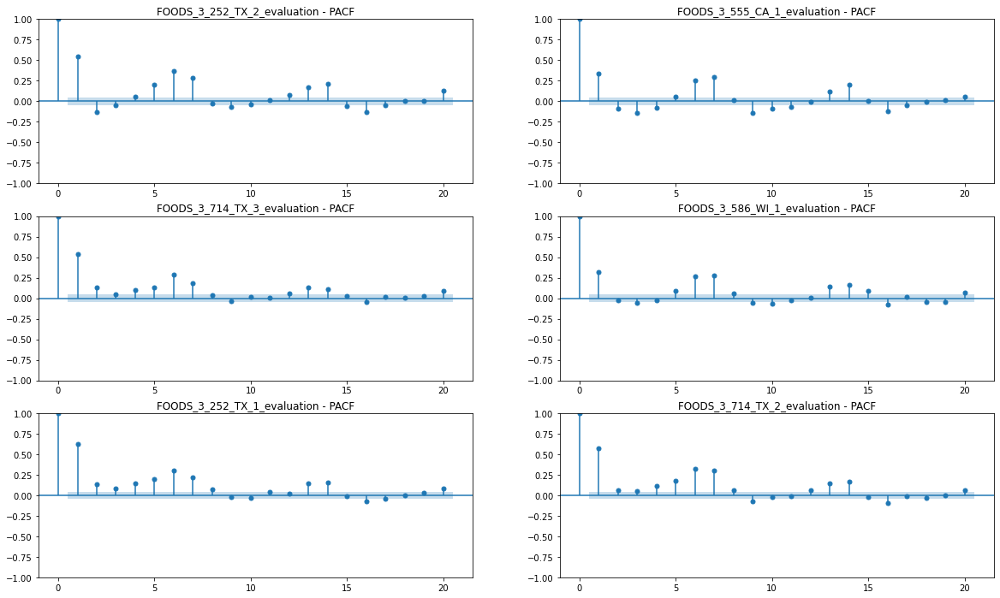

In [34]:
plt.figure(figsize=(20,12))
int_figno = 1
for strItem in lst_selItems:
    df_filt = df_sales.loc[df_sales.id == strItem].sales
    plt.subplot(3,2,int_figno)
    plot_pacf(df_filt, ax=plt.gca(), lags = 20)
    plt.title(strItem + ' - PACF')
    int_figno += 1

plt.show()

In [35]:
fig = go.Figure()
for item in lst_selItems:
    samp = df_sales.loc[(df_sales.id == item)].sort_values(by=['date'], ascending=True)
    fig.add_trace(go.Scatter(x=samp.date, y=samp.sales, name = item))

fig.update_layout(xaxis_title="Time", yaxis_title="Sales",title="",title_x=0.5)
fig.show()

In [36]:
def get_Product_data(strItem, strState):
    df_item = df_sales.loc[df_sales.id == strItem][['date','sales']]
    df_item.rename(columns={'date': 'ds', 'sales': 'y'}, inplace=True)
    
    lst_state_events = lst_events.copy()
    if strState == 'CA':
        lst_state_events.remove('snap_TX')
        lst_state_events.remove('snap_WI')
    elif strState == 'TX':
        lst_state_events.remove('snap_CA')
        lst_state_events.remove('snap_WI')
    else:
        lst_state_events.remove('snap_CA')
        lst_state_events.remove('snap_TX')
        
    df_state_events = events_df.loc[events_df.event.isin(lst_state_events)]
    return df_item, df_state_events, lst_state_events
    

### FOODS_3_252_TX_2_evaluation

In [37]:
# df_item1 = df_sales.loc[df_sales.id == 'FOODS_3_252_TX_2_evaluation'][['date','sales']]
# df_item1.rename(columns={'date': 'ds', 'sales': 'y'}, inplace=True)

df_item1, df_TX_events, lst_TX_events = get_Product_data('FOODS_3_252_TX_2_evaluation','TX')

# lst_TX_events = lst_events.copy()
# lst_TX_events.remove('snap_CA')
# lst_TX_events.remove('snap_WI')
# df_TX_events = events_df.loc[events_df.event.isin(lst_TX_events)]

In [38]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_item1.ds, y=df_item1.y, name = 'FOODS_3_252_TX_2_evaluation'))
fig.update_layout(xaxis_title="Time", yaxis_title="Sales",title="",title_x=0.5)
fig.show()

In [39]:
m = NeuralProphet(yearly_seasonality=False,
    weekly_seasonality= False,
    daily_seasonality=False,)
df = df_item1
df_train, df_test = m.split_df(df=df, freq="D", valid_p=0.3 )
metrics = m.fit(df=df_train, freq="D" , validation_df=df_test)
metrics.tail(1)

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.78E-01, min: 3.72E-03


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.07E-01, min: 5.14E-03
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 2.69E-01
Epoch[176/176]: 100%|█| 176/176 [00:11<00:00, 14.85it/s, SmoothL1Loss=0.0309, MAE=15.4, RMSE=18.8, Loss=0.0235, RegLoss


,SmoothL1Loss,MAE,RMSE,Loss,RegLoss,SmoothL1Loss_val,MAE_val,RMSE_val
175,0.030889,15.42963,18.776718,0.023524,0.0,0.080825,26.64102,30.556301


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


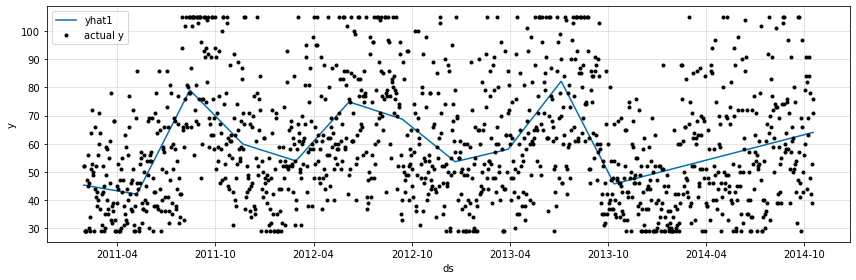

In [40]:
forecast = m.predict(df_train)
fig = m.plot(forecast,figsize=(12, 4))

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


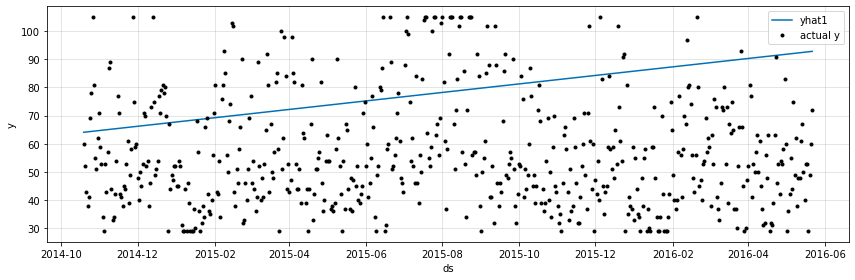

In [41]:
forecast = m.predict(df_test)
# m = m.highlight_nth_step_ahead_of_each_forecast(1)
fig = m.plot(forecast,figsize=(12, 4))

In [42]:
mape = mean_absolute_percentage_error(forecast.y,forecast.yhat1).round(2)
mape

0.61

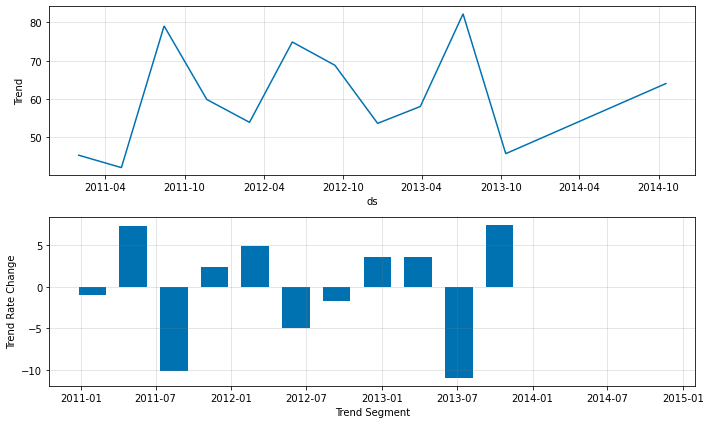

In [43]:
fig_param = m.plot_parameters(weekly_start=4)

In [44]:
m = NeuralProphet(yearly_seasonality=False,
    weekly_seasonality= False,
    daily_seasonality=False,)
m.add_country_holidays(country_name='US')
df = df_item1
df_train, df_test = m.split_df(df=df, freq="D", valid_p=0.3 )
metrics = m.fit(df=df_train, freq="D" , validation_df=df_test)

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 2.41E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 5.42E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.20E-02
Epoch[176/176]: 100%|█| 176/176 [00:14<00:00, 12.31it/s, SmoothL1Loss=0.0303, MAE=15.2, RMSE=18.6, Loss=0.0231, RegLoss


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


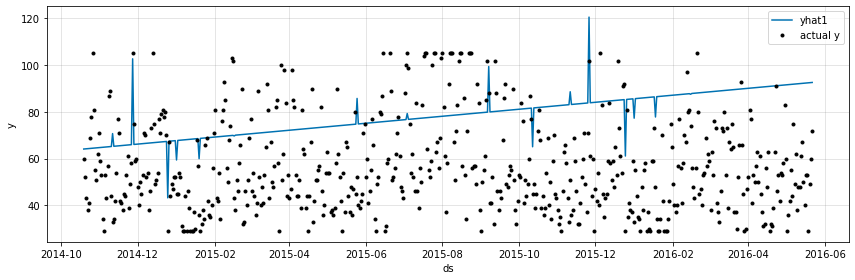

In [45]:
forecast = m.predict(df_test)
# m = m.highlight_nth_step_ahead_of_each_forecast(1)
fig = m.plot(forecast,figsize=(12, 4))

In [46]:
mape = mean_absolute_percentage_error(forecast.y,forecast.yhat1).round(2)
mape

0.6

In [47]:
m = NeuralProphet()
m.add_country_holidays(country_name='US')
df = df_item1
df_train, df_test = m.split_df(df=df, freq="D", valid_p=0.3 )
metrics = m.fit(df=df_train, freq="D" , validation_df=df_test)

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 7.77E-01, min: 1.26E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.50E-01, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 2.69E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.18it/s, SmoothL1Loss=0.0145, MAE=10.2, RMSE=12.8, Loss=0.0113, RegLoss


In [48]:
metrics.tail(1)

,SmoothL1Loss,MAE,RMSE,Loss,RegLoss,SmoothL1Loss_val,MAE_val,RMSE_val
175,0.014517,10.168792,12.802528,0.011265,0.0,0.061716,21.829885,26.700905


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


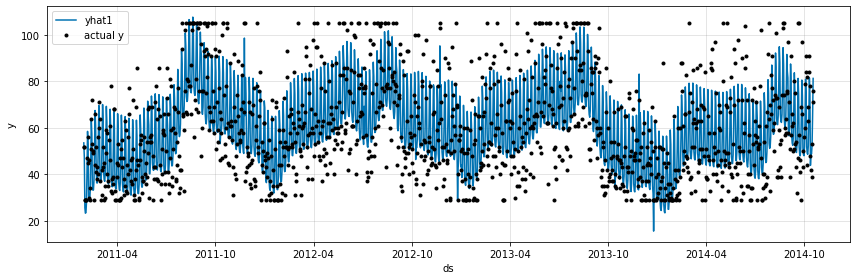

In [49]:
forecast = m.predict(df_train)
fig = m.plot(forecast,figsize=(12, 4))

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


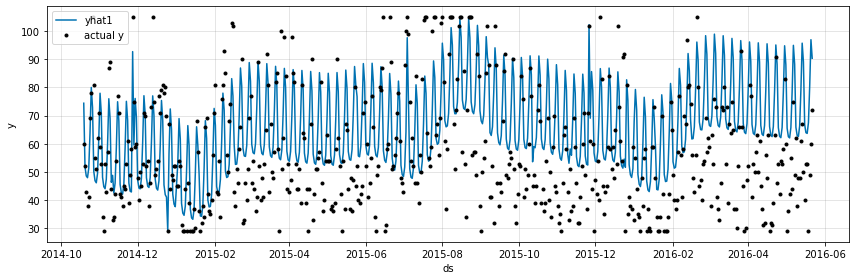

In [50]:
forecast = m.predict(df_test)
# m = m.highlight_nth_step_ahead_of_each_forecast(1)
fig = m.plot(forecast,figsize=(12, 4))

In [51]:
mape = mean_absolute_percentage_error(forecast.y,forecast.yhat1).round(2)
mape

0.31

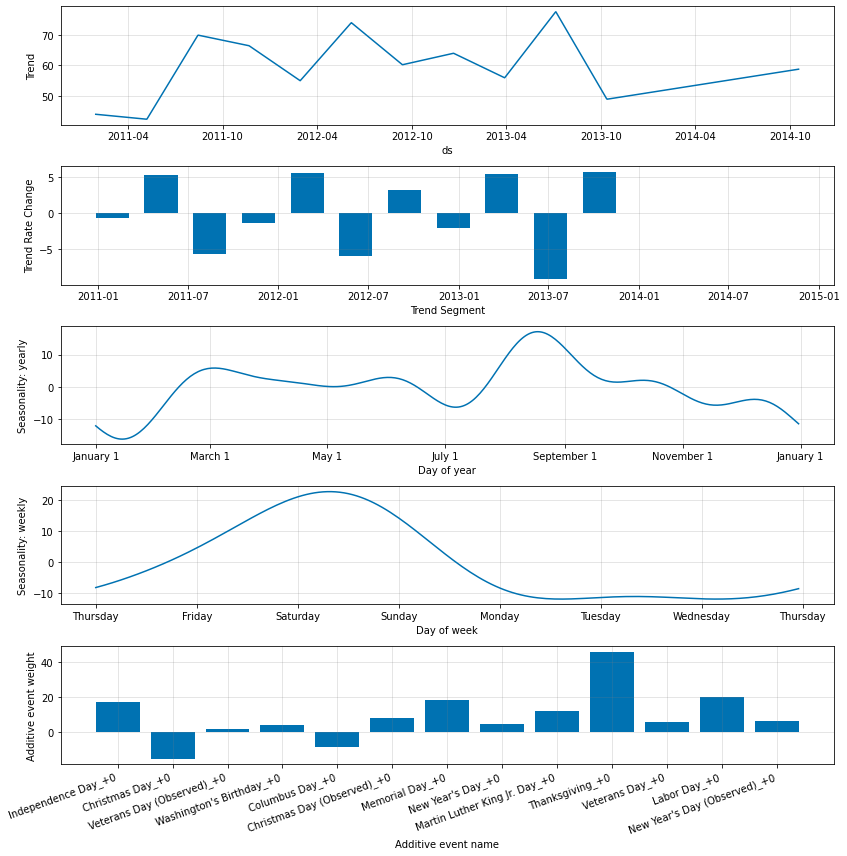

In [52]:
fig_param = m.plot_parameters(figsize=(12, 12),weekly_start=4)

In [53]:
def plot_forecast(forecast):
    samp_for = forecast[['ds','y','yhat1']]
    samp_for = samp_for.set_index('ds')

    plt.figure(figsize=(18,6))
    plt.plot(samp_for['y'], label='Original')
    plt.plot(samp_for['yhat1'], label='Predicted')

    plt.legend(loc='best')
    plt.show()

In [54]:
m = NeuralProphet()
m.add_events(lst_TX_events)
df = m.create_df_with_events(df_item1, df_TX_events)
df_train, df_test = m.split_df(df=df, freq="D", valid_p=0.3 )
metrics = m.fit(df=df_train, freq="D" , validation_df=df_test)

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176

  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.07E+00, min: 9.47E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.61E-01, min: 9.47E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 4.14E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.00it/s, SmoothL1Loss=0.0142, MAE=10.1, RMSE=12.7, Loss=0.011, RegLoss=


In [55]:
metrics.tail(1)

,SmoothL1Loss,MAE,RMSE,Loss,RegLoss,SmoothL1Loss_val,MAE_val,RMSE_val
175,0.014235,10.078795,12.707207,0.011014,0.0,0.060713,21.555054,26.483122


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


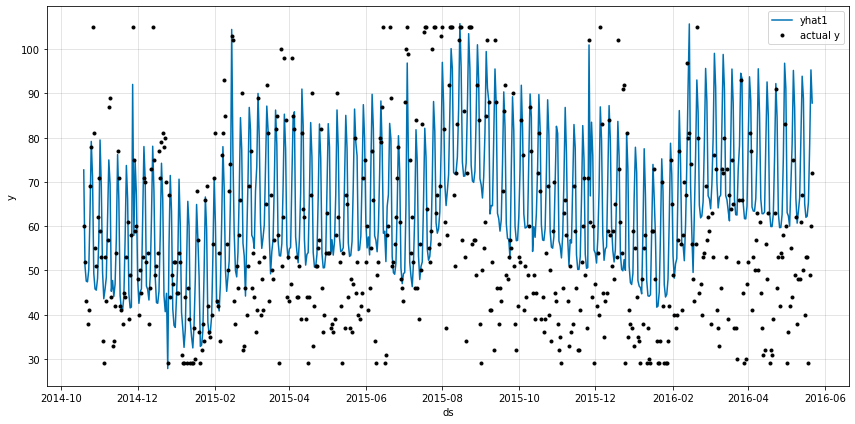

In [56]:
forecast = m.predict(df_test)
# m = m.highlight_nth_step_ahead_of_each_forecast(1)
fig = m.plot(forecast,figsize=(12, 6))

In [57]:
mape = mean_absolute_percentage_error(forecast.y,forecast.yhat1).round(2)
mape

0.3

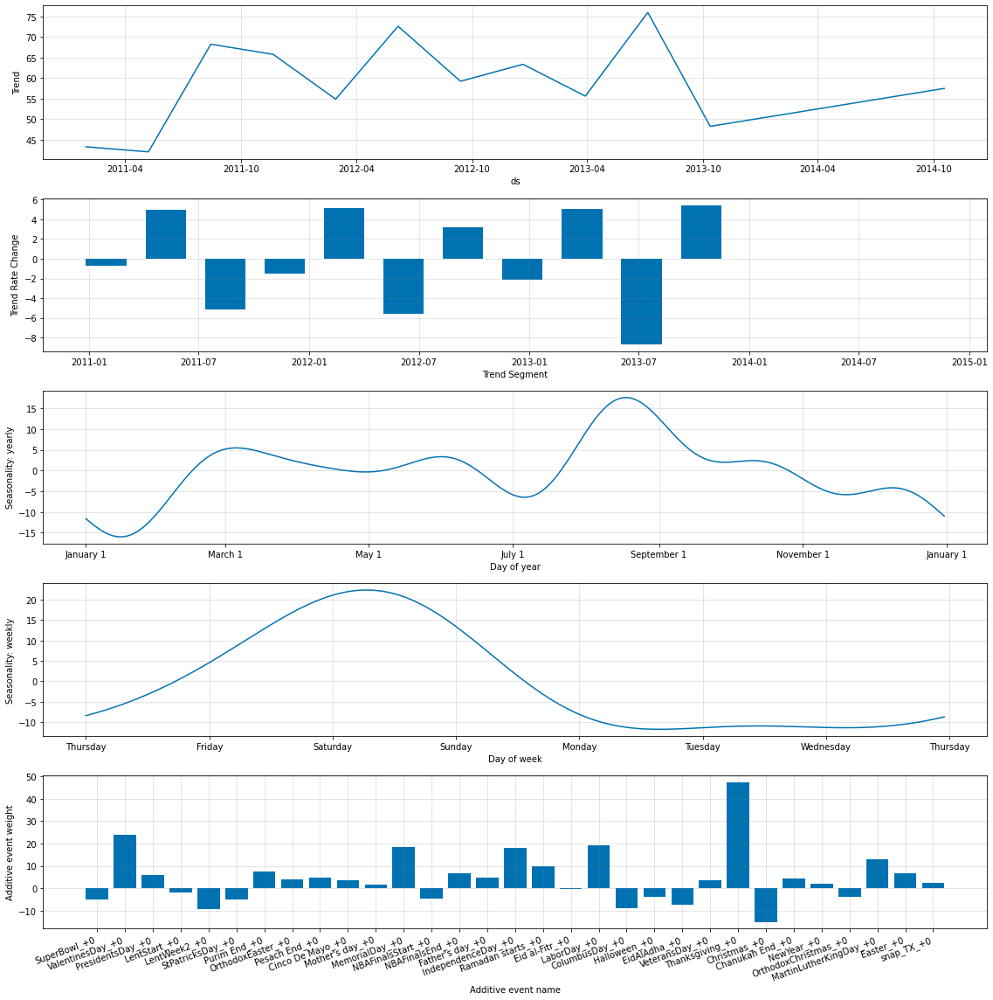

In [58]:
fig_param = m.plot_parameters(figsize=(16, 16),weekly_start=4)

In [59]:
def run_NeuralProphet_with_hyperparams(hyperparams, df_data, df_events, lst_events):
    id_modelno = 1
    df_metrics = pd.DataFrame() # Store the metrics for each params here
    dic_models = {}
    df_forecasted_data = pd.DataFrame()
    
    for c in hyperparams:
        print('Running Model No : ' , id_modelno , ' Out of ', len(hyperparams), c)
        m_np = NeuralProphet(**c)
        m_np.add_events(lst_events)
        df = m_np.create_df_with_events(df_data, df_events)
        df_train, df_test = m_np.split_df(df=df, freq="D", valid_p=0.3 )
        metrics2 = m_np.fit(df=df_train, freq="D" , validation_df=df_test)
        forecast = m_np.predict(df_test)
        forecast['model_No'] = id_modelno
        df_forecasted_data = df_forecasted_data.append(forecast)
        df_metrics = df_metrics.append(pd.DataFrame({
                                                'model_No' : id_modelno,
                                                'params':[c],
                                                'RMSE': metrics2['RMSE_val'].min(),
                                                'MAPE': mean_absolute_percentage_error(forecast.y,forecast.yhat1)
                                               }))
        dic_models[id_modelno] = m_np
        id_modelno += 1
    return df_metrics, df_forecasted_data, dic_models

In [60]:
param_grid_1 = {  
    'ar_reg' : [1],
    'changepoints_range':[0.95],
    'growth' : ['off', 'linear'],
    'seasonality_mode' :['additive','multiplicative'],
    'num_hidden_layers': [0,1,2]
}

# Generate all combinations of parameters
all_params_1 = [dict(zip(param_grid_1.keys(), v)) for v in itertools.product(*param_grid_1.values())]
len(all_params_1)

12

In [61]:
results_1, df_forecasted_data, dic_models = run_NeuralProphet_with_hyperparams(all_params_1,
                                                                               df_item1,
                                                                               df_TX_events,
                                                                               lst_TX_events)

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.


Running Model No :  1  Out of  12 {'ar_reg': 1, 'changepoints_range': 0.95, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 5.62E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.14E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 14.04it/s, SmoothL1Loss=0.019, MAE=11.9, RMSE=14.7, Loss=0.0143, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  2  Out of  12 {'ar_reg': 1, 'changepoints_range': 0.95, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.26E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.07E-01
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.91it/s, SmoothL1Loss=0.019, MAE=11.9, RMSE=14.7, Loss=0.0143, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  3  Out of  12 {'ar_reg': 1, 'changepoints_range': 0.95, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 2.94E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 9.14E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.07E-01
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.76it/s, SmoothL1Loss=0.019, MAE=11.9, RMSE=14.7, Loss=0.0143, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  4  Out of  12 {'ar_reg': 1, 'changepoints_range': 0.95, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.59E-02, min: 5.83E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.59E-02, min: 8.06E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 4.07E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 14.02it/s, SmoothL1Loss=0.019, MAE=11.9, RMSE=14.7, Loss=0.0143, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  5  Out of  12 {'ar_reg': 1, 'changepoints_range': 0.95, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.96E-02, min: 1.54E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 1.54E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 5.94E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 14.25it/s, SmoothL1Loss=0.019, MAE=11.9, RMSE=14.7, Loss=0.0143, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  6  Out of  12 {'ar_reg': 1, 'changepoints_range': 0.95, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 2.94E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 3.46E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.20E-01
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 13.08it/s, SmoothL1Loss=0.019, MAE=11.9, RMSE=14.7, Loss=0.0143, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  7  Out of  12 {'ar_reg': 1, 'changepoints_range': 0.95, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.75E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.65E-02
Epoch[176/176]: 100%|█| 176/176 [00:18<00:00,  9.45it/s, SmoothL1Loss=0.0145, MAE=10.1, RMSE=12.8, Loss=0.0113, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  8  Out of  12 {'ar_reg': 1, 'changepoints_range': 0.95, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.49E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.65E-02
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.26it/s, SmoothL1Loss=0.0146, MAE=10.2, RMSE=12.9, Loss=0.0114, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  9  Out of  12 {'ar_reg': 1, 'changepoints_range': 0.95, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 4.78E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 4.07E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.20E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.25it/s, SmoothL1Loss=0.0145, MAE=10.1, RMSE=12.8, Loss=0.0113, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  10  Out of  12 {'ar_reg': 1, 'changepoints_range': 0.95, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 2.41E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 2.41E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.98E-02
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00,  9.92it/s, SmoothL1Loss=0.0144, MAE=10.1, RMSE=12.8, Loss=0.0113, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  11  Out of  12 {'ar_reg': 1, 'changepoints_range': 0.95, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 2.05E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.75E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.77E-02
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.12it/s, SmoothL1Loss=0.0144, MAE=10.1, RMSE=12.7, Loss=0.0112, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  12  Out of  12 {'ar_reg': 1, 'changepoints_range': 0.95, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 4.78E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 5.62E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.77E-02
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.19it/s, SmoothL1Loss=0.0144, MAE=10, RMSE=12.8, Loss=0.0112, RegLoss=0
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


In [62]:
results_1

,model_No,params,RMSE,MAPE
0,1,"{'ar_reg': 1, 'changepoints_range': 0.95, 'gro...",23.837135,0.208245
0,2,"{'ar_reg': 1, 'changepoints_range': 0.95, 'gro...",23.973694,0.208067
0,3,"{'ar_reg': 1, 'changepoints_range': 0.95, 'gro...",23.930788,0.208480
0,4,"{'ar_reg': 1, 'changepoints_range': 0.95, 'gro...",23.318947,0.207900
0,5,"{'ar_reg': 1, 'changepoints_range': 0.95, 'gro...",23.468271,0.208276
0,6,"{'ar_reg': 1, 'changepoints_range': 0.95, 'gro...",22.442492,0.207713
0,7,"{'ar_reg': 1, 'changepoints_range': 0.95, 'gro...",23.872730,0.292811
0,8,"{'ar_reg': 1, 'changepoints_range': 0.95, 'gro...",23.802563,0.196914
0,9,"{'ar_reg': 1, 'changepoints_range': 0.95, 'gro...",24.556000,0.286126
0,10,"{'ar_reg': 1, 'changepoints_range': 0.95, 'gro...",23.541824,0.195624


In [63]:
int_RMSE_ModelNo = results_1.loc[(results_1.RMSE <= results_1.RMSE.min())].model_No.min()
int_MAPE_ModelNo = results_1.loc[(results_1.MAPE <= results_1.MAPE.min())].model_No.min()
results_1.loc[results_1.model_No.isin([int_RMSE_ModelNo,int_MAPE_ModelNo])]

,model_No,params,RMSE,MAPE
0,6,"{'ar_reg': 1, 'changepoints_range': 0.95, 'gro...",22.442492,0.207713
0,11,"{'ar_reg': 1, 'changepoints_range': 0.95, 'gro...",23.308245,0.191526


In [64]:
print( 'RMSE Best Params : ', results_1.loc[results_1.model_No == int_RMSE_ModelNo].params.to_list())
print( 'MAPE Best Params : ', results_1.loc[results_1.model_No == int_MAPE_ModelNo].params.to_list())

RMSE Best Params :  [{'ar_reg': 1, 'changepoints_range': 0.95, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}]
MAPE Best Params :  [{'ar_reg': 1, 'changepoints_range': 0.95, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}]


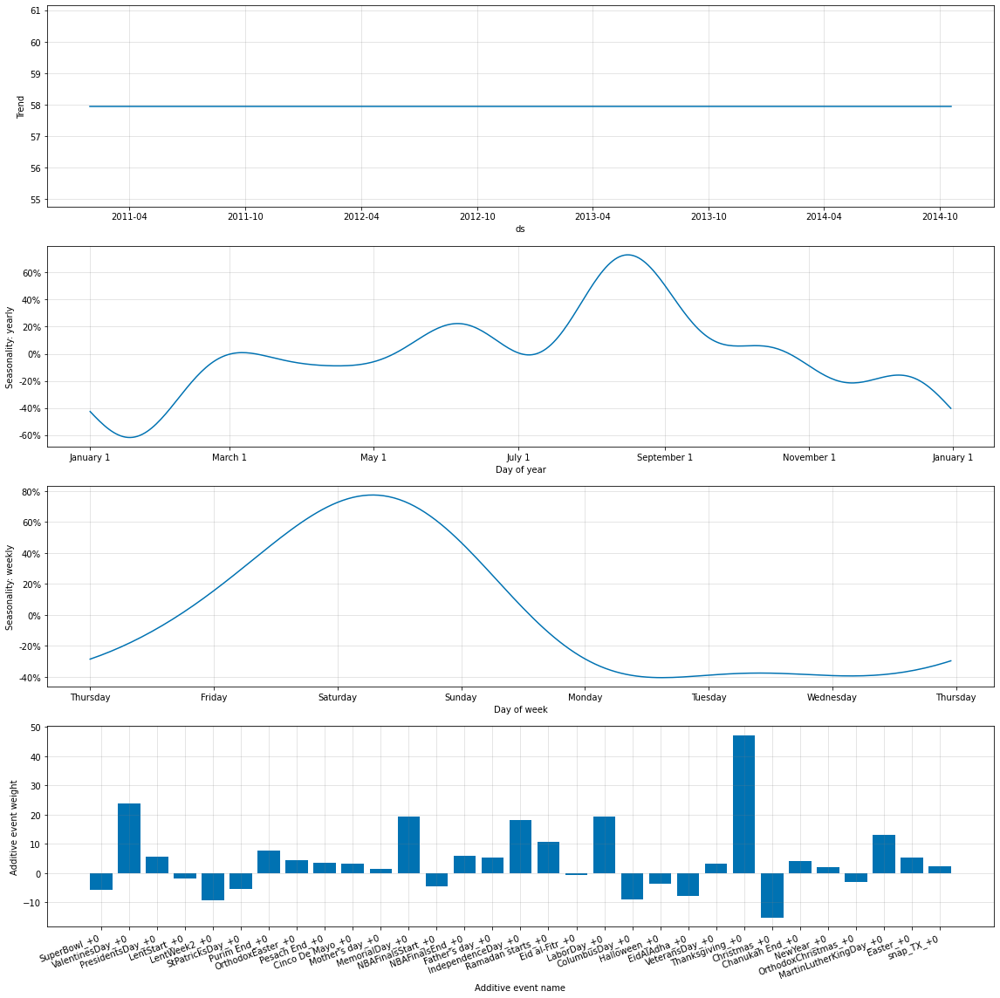

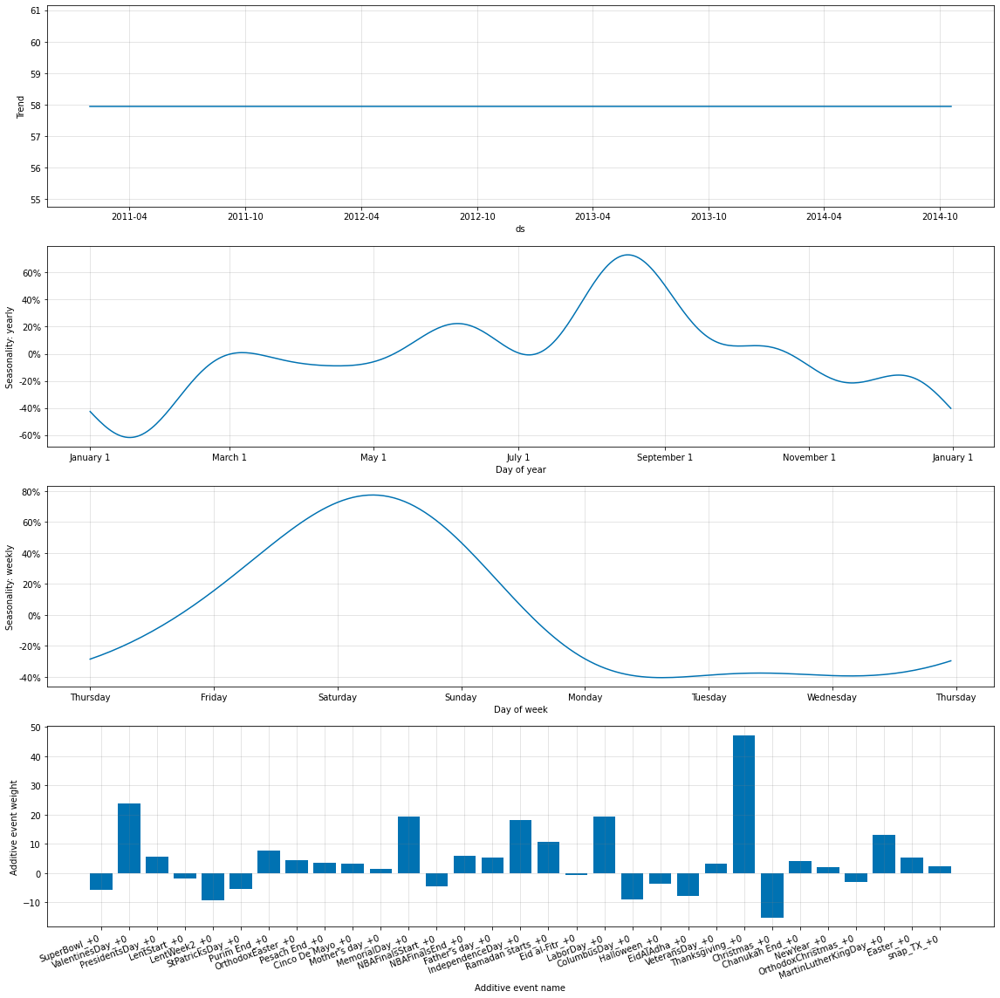

In [65]:
RMSE_Model = dic_models[int_RMSE_ModelNo]
RMSE_Model.plot_parameters(figsize=(16, 16),weekly_start=4)

In [66]:
df_forecasted_data

,ds,y,residual1,yhat1,trend,season_yearly,season_weekly,events_additive,event_Chanukah End,event_Christmas,...,event_PresidentsDay,event_Purim End,event_Ramadan starts,event_StPatricksDay,event_SuperBowl,event_Thanksgiving,event_ValentinesDay,event_VeteransDay,event_snap_TX,model_No
0,2014-10-19,60,12.624161,72.624161,58.056408,0.986212,13.581543,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
1,2014-10-20,52,-1.417114,50.582886,58.056408,0.801497,-8.275021,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
2,2014-10-21,43,4.319843,47.319843,58.056408,0.596402,-11.332965,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
3,2014-10-22,38,9.092018,47.092018,58.056408,0.371586,-11.335973,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
4,2014-10-23,41,8.887856,49.887856,58.056408,0.127990,-8.296544,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
577,2016-05-18,53,-11.824585,41.175415,47.747055,0.036314,-0.386856,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12
578,2016-05-19,29,14.415997,43.415997,47.735645,0.048880,-0.279438,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12
579,2016-05-20,49,2.981102,51.981102,47.724232,0.061424,0.165921,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12
580,2016-05-21,60,2.418007,62.418007,47.712814,0.073863,0.711972,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12


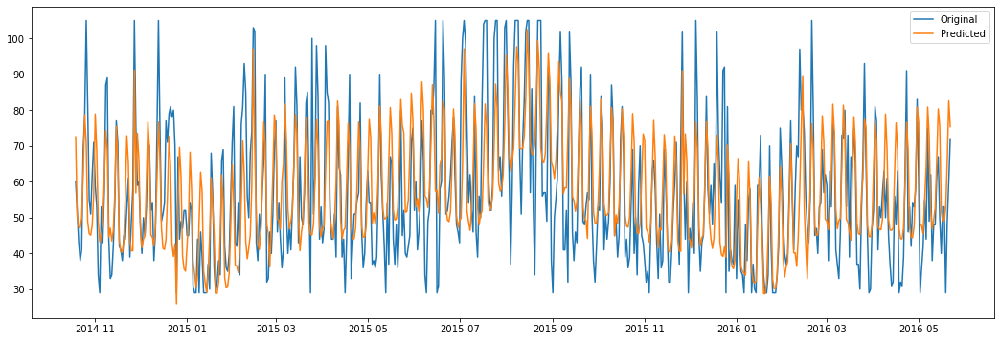

In [67]:
plot_forecast(df_forecasted_data.loc[(df_forecasted_data.model_No==int_RMSE_ModelNo)])

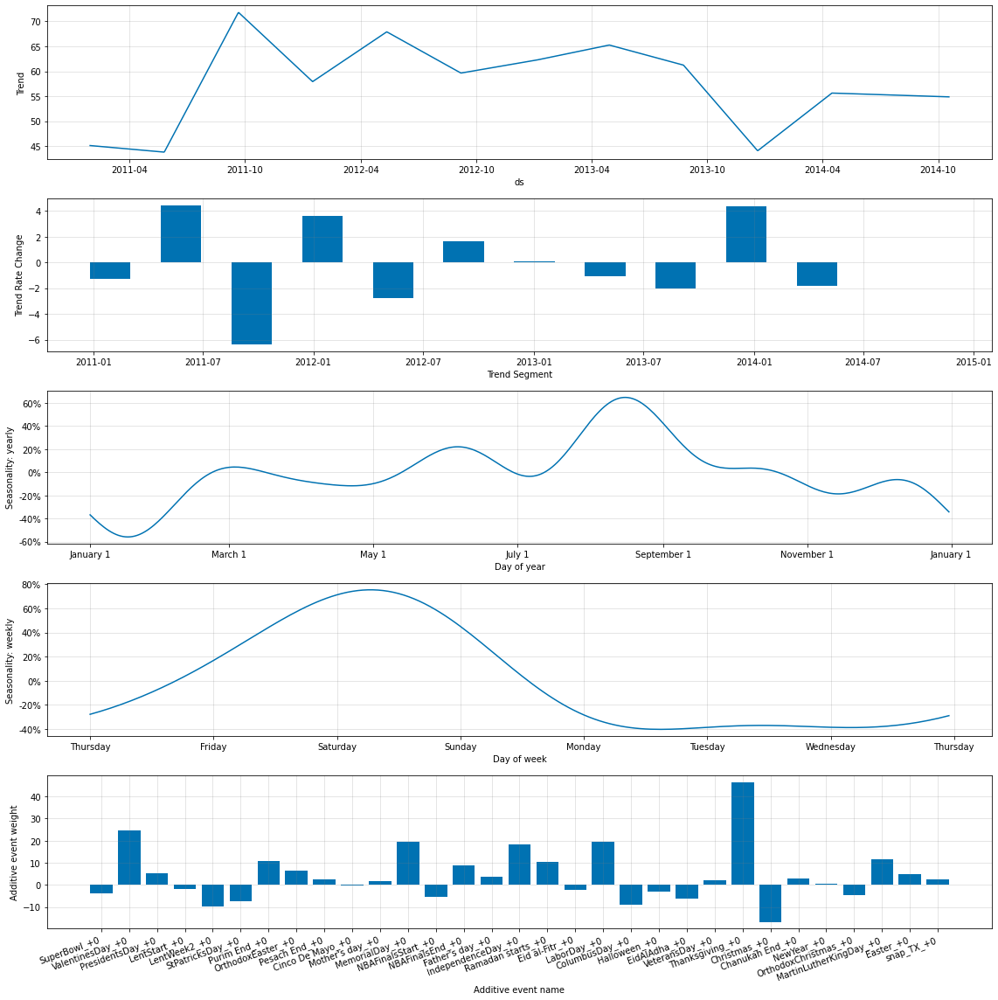

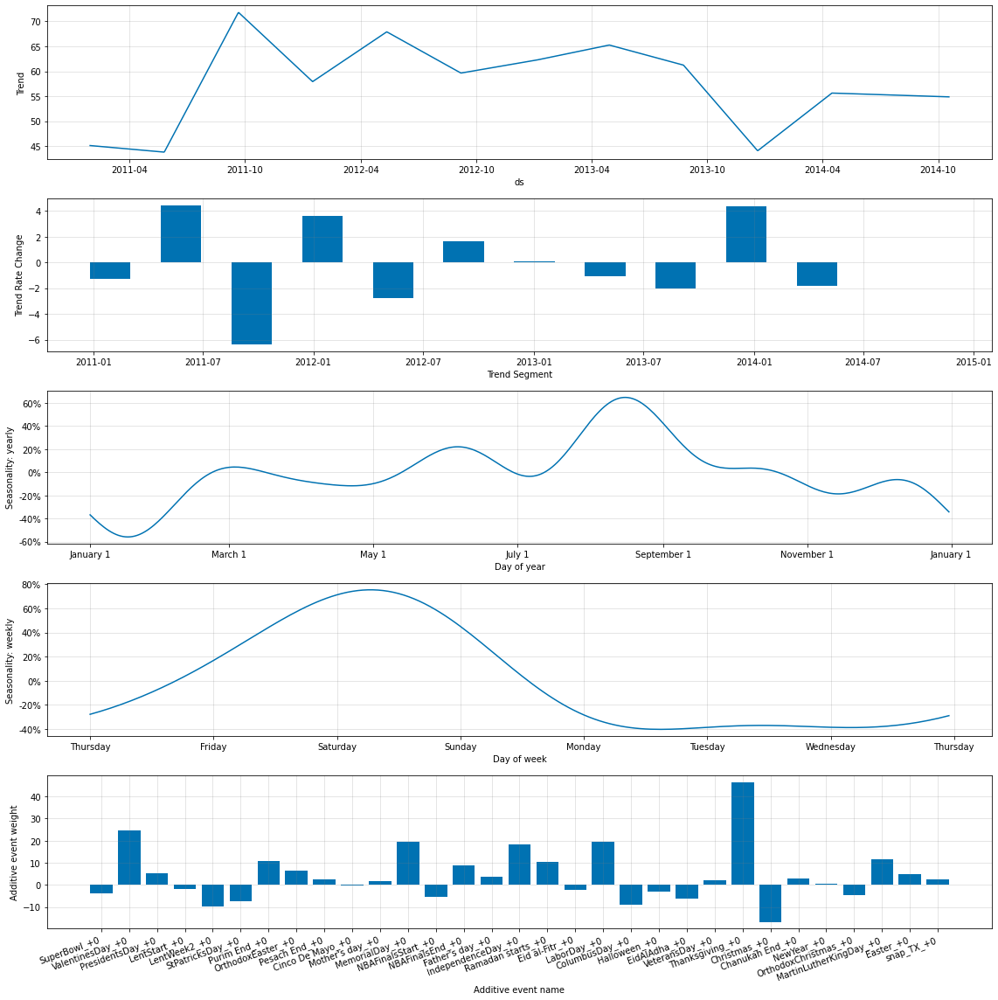

In [68]:
MAPE_Model = dic_models[int_MAPE_ModelNo]
MAPE_Model.plot_parameters(figsize=(16, 16),weekly_start=4)

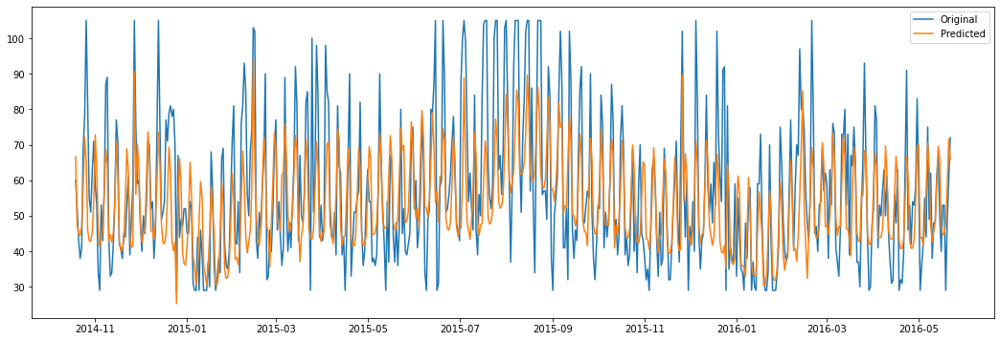

In [69]:
plot_forecast(df_forecasted_data.loc[(df_forecasted_data.model_No==int_MAPE_ModelNo)])

### FOODS_3_555_CA_1_evaluation

In [70]:
df_item2, df_CA_events, lst_CA_events = get_Product_data('FOODS_3_555_CA_1_evaluation','CA')

fig = go.Figure()
fig.add_trace(go.Scatter(x=df_item2.ds, y=df_item2.y, name = 'FOODS_3_555_CA_1_evaluation'))
fig.update_layout(xaxis_title="Time", yaxis_title="Sales",title="",title_x=0.5)
fig.show()

In [71]:
m = NeuralProphet(yearly_seasonality=False,
    weekly_seasonality= False,
    daily_seasonality=False,)
df = df_item2
df_train, df_test = m.split_df(df=df, freq="D", valid_p=0.3 )
metrics = m.fit(df=df_train, freq="D" , validation_df=df_test)
metrics.tail(1)

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.59E-02, min: 2.41E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 3.05E-02, min: 2.05E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 4.29E-02
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 13.34it/s, SmoothL1Loss=0.0394, MAE=5.91, RMSE=6.99, Loss=0.0297, RegLoss


,SmoothL1Loss,MAE,RMSE,Loss,RegLoss,SmoothL1Loss_val,MAE_val,RMSE_val
175,0.039388,5.908093,6.987962,0.029728,0.0,0.035262,5.514231,6.639119


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


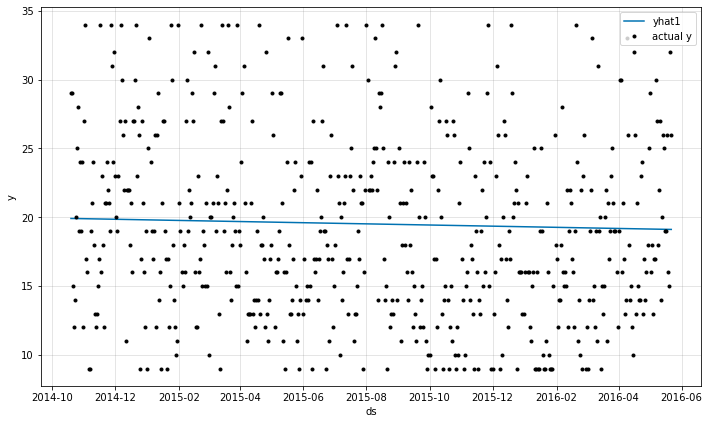

In [72]:
forecast = m.predict(df_test)
# m = m.highlight_nth_step_ahead_of_each_forecast(1)
fig = m.plot(forecast)

In [73]:
mape = mean_absolute_percentage_error(forecast.y,forecast.yhat1).round(2)
mape

0.34

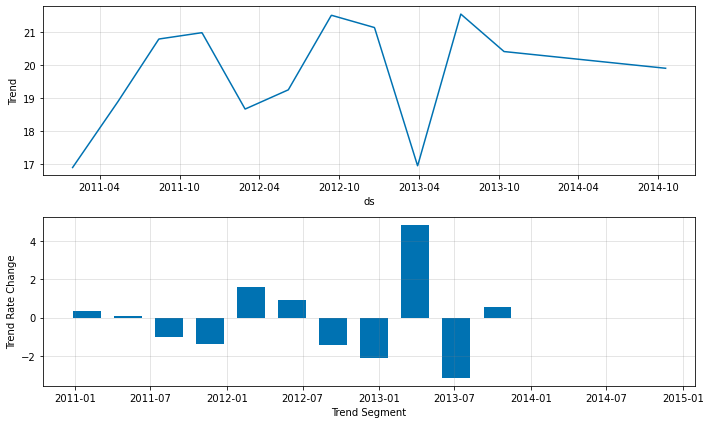

In [74]:
fig_param = m.plot_parameters()

In [75]:
m = NeuralProphet()
# df = df_item1
m.add_events(lst_CA_events)
df = m.create_df_with_events(df_item2, df_CA_events)
df_train, df_test = m.split_df(df=df, freq="D", valid_p=0.3 )
metrics = m.fit(df=df_train, freq="D" , validation_df=df_test)
metrics.tail(1)

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176

  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.96E-02, min: 1.26E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.61E-01, min: 1.11E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.49E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00,  9.98it/s, SmoothL1Loss=0.0209, MAE=4.1, RMSE=5.07, Loss=0.0155, RegLoss=


,SmoothL1Loss,MAE,RMSE,Loss,RegLoss,SmoothL1Loss_val,MAE_val,RMSE_val
175,0.020903,4.095586,5.069215,0.015536,0.0,0.055609,6.726181,8.337386


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


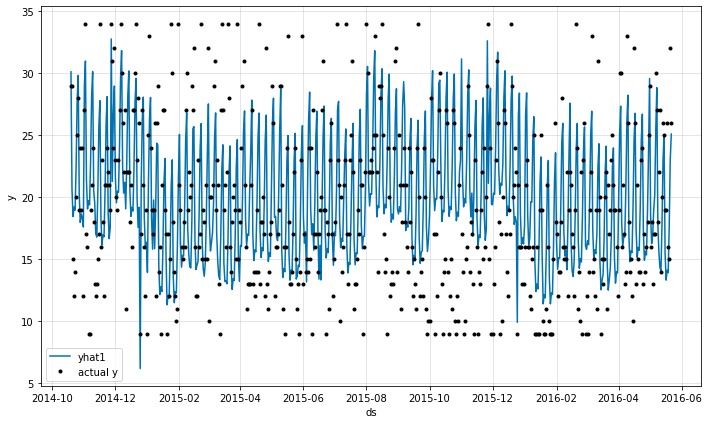

In [76]:
forecast = m.predict(df_test)
# m = m.highlight_nth_step_ahead_of_each_forecast(1)
fig = m.plot(forecast)

In [77]:
mape = mean_absolute_percentage_error(forecast.y,forecast.yhat1).round(2)
mape

0.26

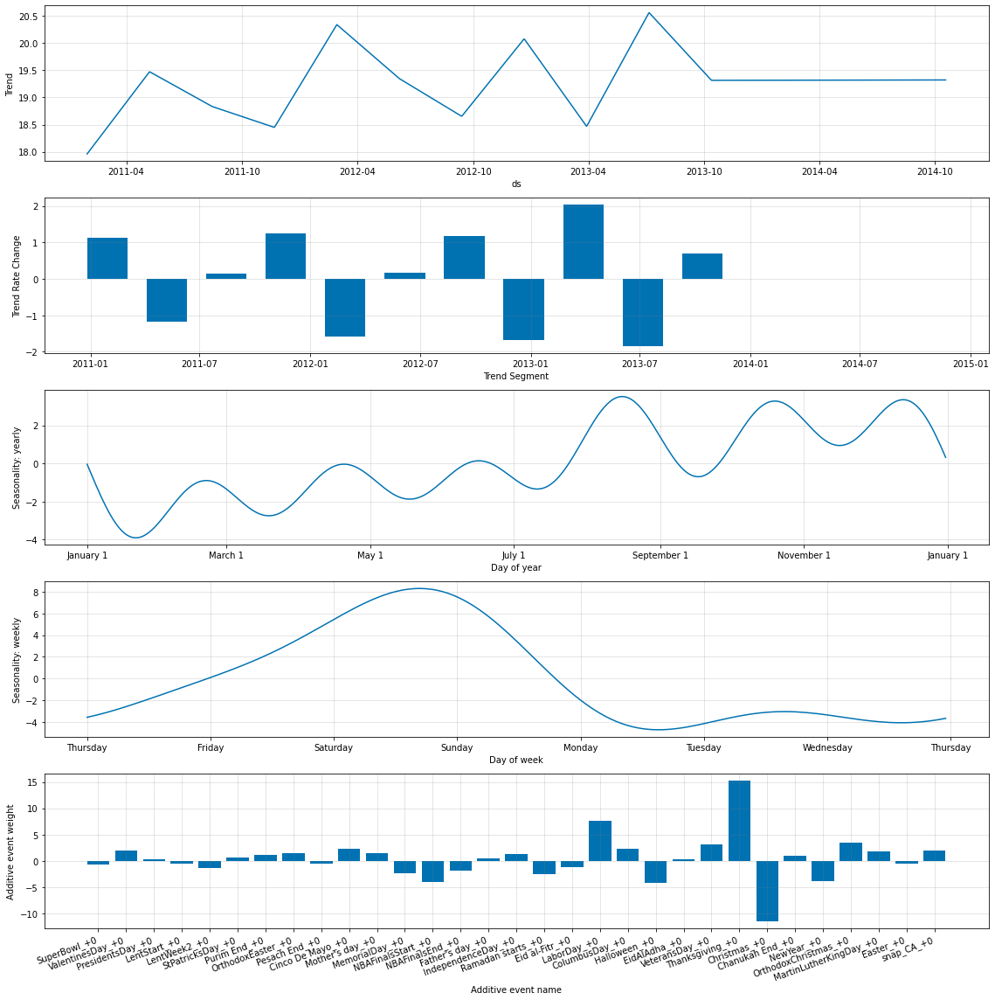

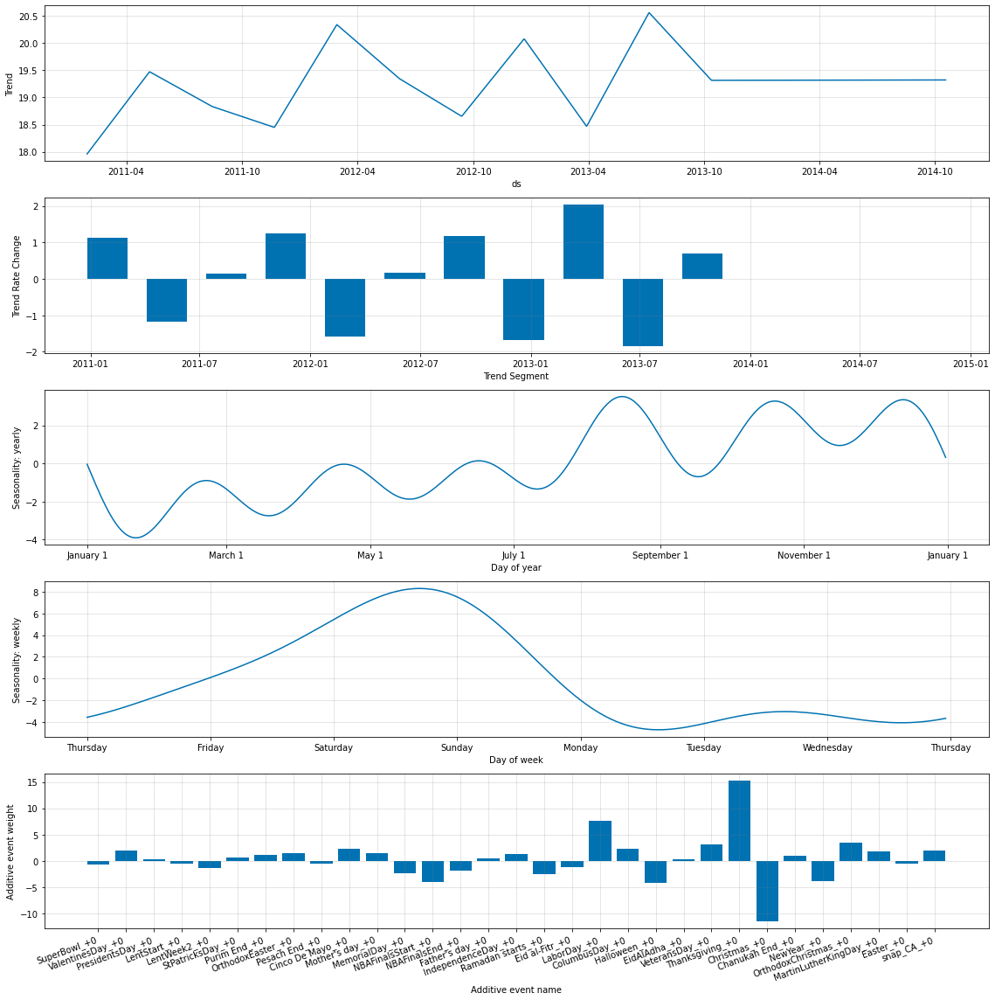

In [78]:
m.plot_parameters(figsize=(16, 16),weekly_start=4)

In [79]:
m.config_normalization

Normalization(normalize='auto', global_normalization=True, global_time_normalization=True, unknown_data_normalization=False, local_data_params=OrderedDict([('__df__', OrderedDict([('ds', ShiftScale(shift=Timestamp('2011-01-29 00:00:00'), scale=Timedelta('1358 days 00:00:00'))), ('y', ShiftScale(shift=9, scale=25.0)), ('SuperBowl', ShiftScale(shift=0.0, scale=1.0)), ('ValentinesDay', ShiftScale(shift=0.0, scale=1.0)), ('PresidentsDay', ShiftScale(shift=0.0, scale=1.0)), ('LentStart', ShiftScale(shift=0.0, scale=1.0)), ('LentWeek2', ShiftScale(shift=0.0, scale=1.0)), ('StPatricksDay', ShiftScale(shift=0.0, scale=1.0)), ('Purim End', ShiftScale(shift=0.0, scale=1.0)), ('OrthodoxEaster', ShiftScale(shift=0.0, scale=1.0)), ('Pesach End', ShiftScale(shift=0.0, scale=1.0)), ('Cinco De Mayo', ShiftScale(shift=0.0, scale=1.0)), ("Mother's day", ShiftScale(shift=0.0, scale=1.0)), ('MemorialDay', ShiftScale(shift=0.0, scale=1.0)), ('NBAFinalsStart', ShiftScale(shift=0.0, scale=1.0)), ('NBAFinalsE

In [80]:
m.config_trend

Trend(growth='linear', changepoints=array([0.        , 0.07272727, 0.14545455, 0.21818182, 0.29090909,
       0.36363636, 0.43636364, 0.50909091, 0.58181818, 0.65454545,
       0.72727273]), n_changepoints=10, changepoints_range=0.8, trend_reg=0, trend_reg_threshold=None)

In [81]:
m.config_season

AllSeason(mode='additive', computation='fourier', reg_lambda=0, yearly_arg='auto', weekly_arg='auto', daily_arg='auto', periods=OrderedDict([('yearly', Season(resolution=6, period=365.25, arg='auto')), ('weekly', Season(resolution=3, period=7, arg='auto'))]))

In [82]:
param_grid_1 = {  
#     'ar_reg' : [1],
    'changepoints_range':[0.6,0.65,0.7,0.75,0.9,0.95,0.99],
    'trend_reg' : [1],
#     'growth' : ['off', 'linear'],
    'seasonality_mode' :['additive','multiplicative'],
#     'num_hidden_layers': [0,1,2]
}

# Generate all combinations of parameters
all_params_1 = [dict(zip(param_grid_1.keys(), v)) for v in itertools.product(*param_grid_1.values())]
len(all_params_1)

14

In [83]:
results_2, df_forecasted_data_2, dic_models = run_NeuralProphet_with_hyperparams(all_params_1,
                                                                               df_item2,
                                                                               df_CA_events,
                                                                               lst_CA_events)

INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.


Running Model No :  1  Out of  14 {'changepoints_range': 0.6, 'trend_reg': 1, 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.75E+00, min: 9.47E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 3.59E-02, min: 8.06E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.84E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.15it/s, SmoothL1Loss=0.0211, MAE=4.1, RMSE=5.09, Loss=0.0199, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds 

Running Model No :  2  Out of  14 {'changepoints_range': 0.6, 'trend_reg': 1, 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.05E+00, min: 4.22E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 3.92E+00, min: 2.50E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.31E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00,  9.93it/s, SmoothL1Loss=0.0211, MAE=4.11, RMSE=5.09, Loss=0.0183, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds 

Running Model No :  3  Out of  14 {'changepoints_range': 0.65, 'trend_reg': 1, 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 6.61E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 3.46E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.07E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.18it/s, SmoothL1Loss=0.021, MAE=4.1, RMSE=5.09, Loss=0.0238, RegLoss=0
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds 

Running Model No :  4  Out of  14 {'changepoints_range': 0.65, 'trend_reg': 1, 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 3.59E-02, min: 1.26E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 3.59E-02, min: 7.77E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 5.05E-02
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.13it/s, SmoothL1Loss=0.0211, MAE=4.11, RMSE=5.1, Loss=0.0224, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds 

Running Model No :  5  Out of  14 {'changepoints_range': 0.7, 'trend_reg': 1, 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 3.46E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.54E-01, min: 7.77E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.20E-01
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.57it/s, SmoothL1Loss=0.0214, MAE=4.12, RMSE=5.11, Loss=0.023, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds 

Running Model No :  6  Out of  14 {'changepoints_range': 0.7, 'trend_reg': 1, 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.61E-01, min: 4.96E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.62E-01, min: 4.22E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 3.34E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.03it/s, SmoothL1Loss=0.0212, MAE=4.11, RMSE=5.07, Loss=0.0176, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds 

Running Model No :  7  Out of  14 {'changepoints_range': 0.75, 'trend_reg': 1, 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 6.61E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 3.34E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.98E-02
Epoch[176/176]: 100%|█| 176/176 [00:18<00:00,  9.74it/s, SmoothL1Loss=0.021, MAE=4.09, RMSE=5.08, Loss=0.0217, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds 

Running Model No :  8  Out of  14 {'changepoints_range': 0.75, 'trend_reg': 1, 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 5.62E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 9.14E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 5.62E-02
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.04it/s, SmoothL1Loss=0.021, MAE=4.09, RMSE=5.09, Loss=0.0209, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds 

Running Model No :  9  Out of  14 {'changepoints_range': 0.9, 'trend_reg': 1, 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.84E+00, min: 1.60E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.94E-01, min: 1.88E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 4.37E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.01it/s, SmoothL1Loss=0.021, MAE=4.1, RMSE=5.09, Loss=0.0214, RegLoss=0
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds 

Running Model No :  10  Out of  14 {'changepoints_range': 0.9, 'trend_reg': 1, 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 3.46E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 7.77E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 5.62E-02
Epoch[176/176]: 100%|█| 176/176 [00:22<00:00,  7.93it/s, SmoothL1Loss=0.0211, MAE=4.11, RMSE=5.1, Loss=0.0214, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds 

Running Model No :  11  Out of  14 {'changepoints_range': 0.95, 'trend_reg': 1, 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 4.78E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.81E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.65E-02
Epoch[176/176]: 100%|█| 176/176 [00:20<00:00,  8.70it/s, SmoothL1Loss=0.021, MAE=4.11, RMSE=5.08, Loss=0.0273, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds 

Running Model No :  12  Out of  14 {'changepoints_range': 0.95, 'trend_reg': 1, 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.49E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.49E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.13E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00,  9.78it/s, SmoothL1Loss=0.0209, MAE=4.1, RMSE=5.07, Loss=0.0239, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds 

Running Model No :  13  Out of  14 {'changepoints_range': 0.99, 'trend_reg': 1, 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 8.06E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 8.06E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 5.62E-02
Epoch[176/176]: 100%|█| 176/176 [00:18<00:00,  9.35it/s, SmoothL1Loss=0.0211, MAE=4.1, RMSE=5.09, Loss=0.0245, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds 

Running Model No :  14  Out of  14 {'changepoints_range': 0.99, 'trend_reg': 1, 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 3.46E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 5.62E-02
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.17it/s, SmoothL1Loss=0.0211, MAE=4.1, RMSE=5.09, Loss=0.0296, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


In [84]:
results_2

,model_No,params,RMSE,MAPE
0,1,"{'changepoints_range': 0.6, 'trend_reg': 1, 's...",8.262210,0.277454
0,2,"{'changepoints_range': 0.6, 'trend_reg': 1, 's...",7.822079,0.268006
0,3,"{'changepoints_range': 0.65, 'trend_reg': 1, '...",8.257413,0.246699
0,4,"{'changepoints_range': 0.65, 'trend_reg': 1, '...",7.764292,0.266265
0,5,"{'changepoints_range': 0.7, 'trend_reg': 1, 's...",8.207485,0.345395
0,6,"{'changepoints_range': 0.7, 'trend_reg': 1, 's...",7.825077,0.296192
0,7,"{'changepoints_range': 0.75, 'trend_reg': 1, '...",8.067055,0.249242
0,8,"{'changepoints_range': 0.75, 'trend_reg': 1, '...",7.743852,0.242848
0,9,"{'changepoints_range': 0.9, 'trend_reg': 1, 's...",8.315521,0.233347
0,10,"{'changepoints_range': 0.9, 'trend_reg': 1, 's...",7.709069,0.234715


In [85]:
int_RMSE_ModelNo = results_2.loc[(results_2.RMSE <= results_2.RMSE.min())].model_No.min()
int_MAPE_ModelNo = results_2.loc[(results_2.MAPE <= results_2.MAPE.min())].model_No.min()
results_2.loc[results_2.model_No.isin([int_RMSE_ModelNo,int_MAPE_ModelNo])]

,model_No,params,RMSE,MAPE
0,9,"{'changepoints_range': 0.9, 'trend_reg': 1, 's...",8.315521,0.233347
0,14,"{'changepoints_range': 0.99, 'trend_reg': 1, '...",7.595154,0.434509


In [86]:
print( 'RMSE Best Params : ', results_2.loc[results_2.model_No == int_RMSE_ModelNo].params.to_list())
print( 'MAPE Best Params : ', results_2.loc[results_2.model_No == int_MAPE_ModelNo].params.to_list())

RMSE Best Params :  [{'changepoints_range': 0.99, 'trend_reg': 1, 'seasonality_mode': 'multiplicative'}]
MAPE Best Params :  [{'changepoints_range': 0.9, 'trend_reg': 1, 'seasonality_mode': 'additive'}]


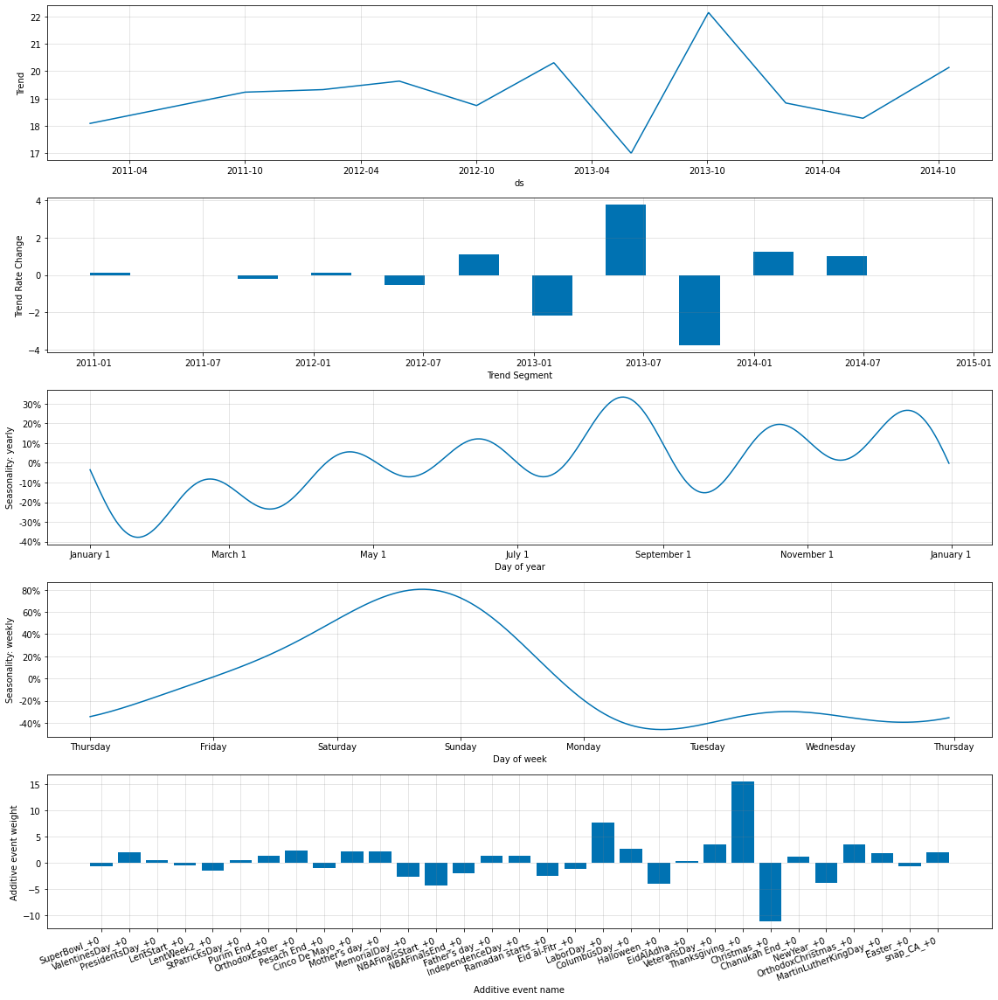

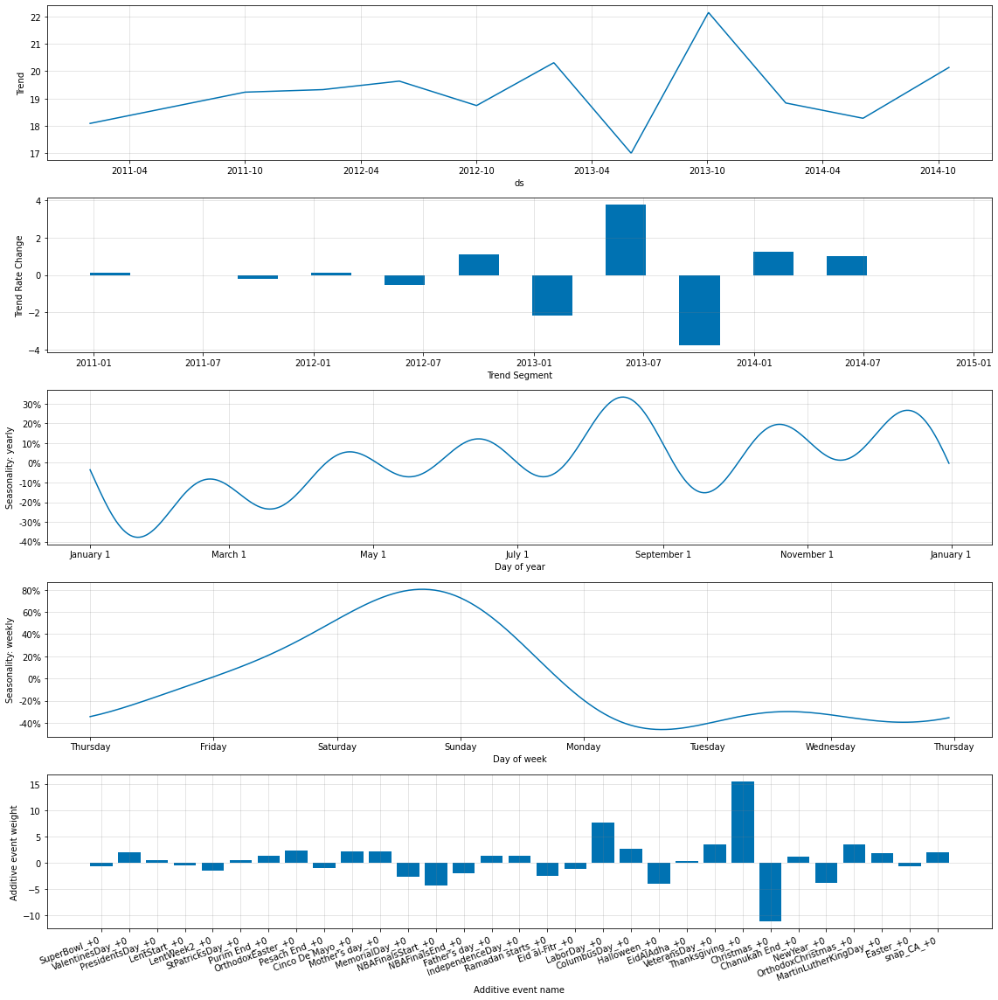

In [87]:
RMSE_Model = dic_models[int_RMSE_ModelNo]
RMSE_Model.plot_parameters(figsize=(16, 16),weekly_start=4)

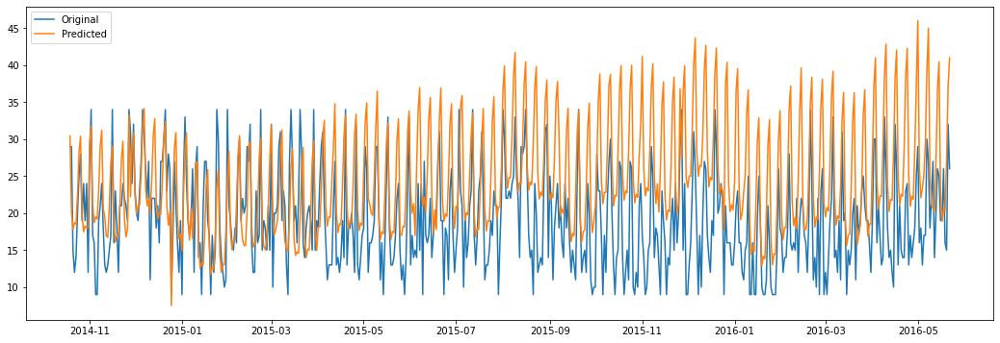

In [88]:
plot_forecast(df_forecasted_data_2.loc[(df_forecasted_data_2.model_No==int_RMSE_ModelNo)])

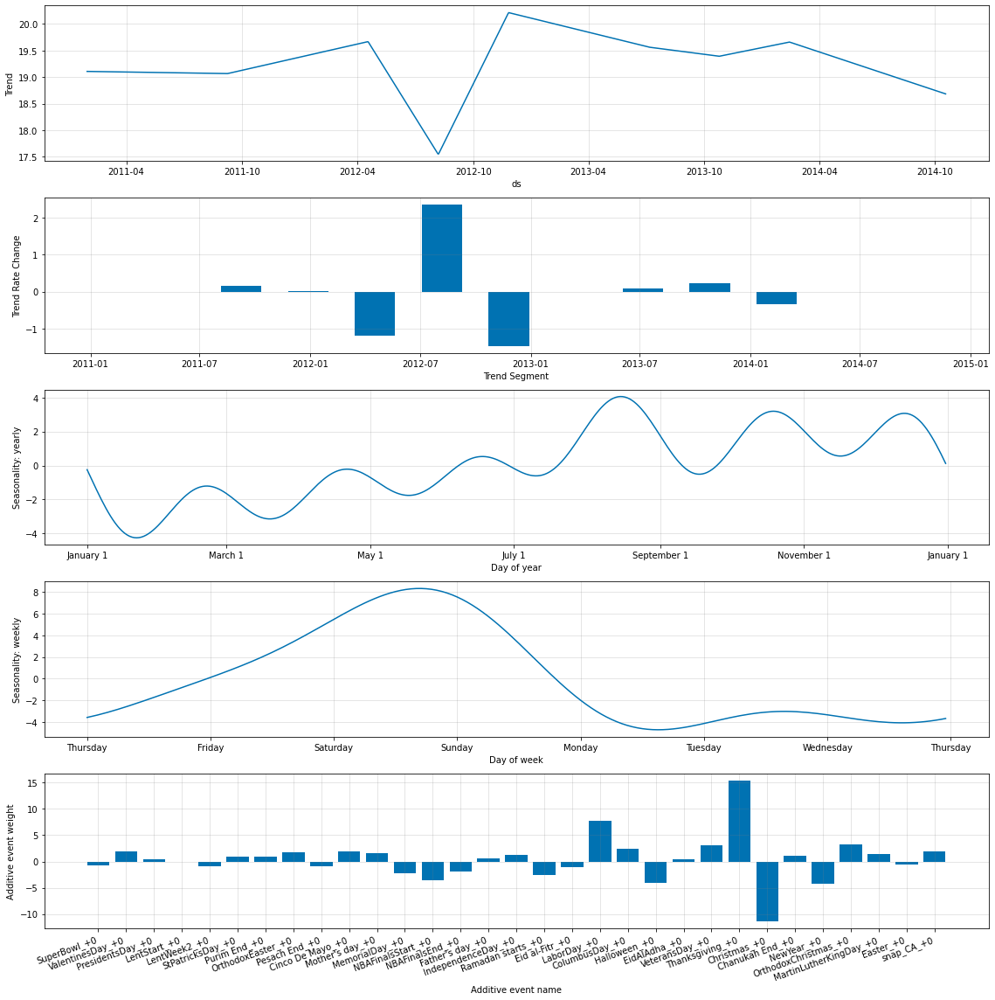

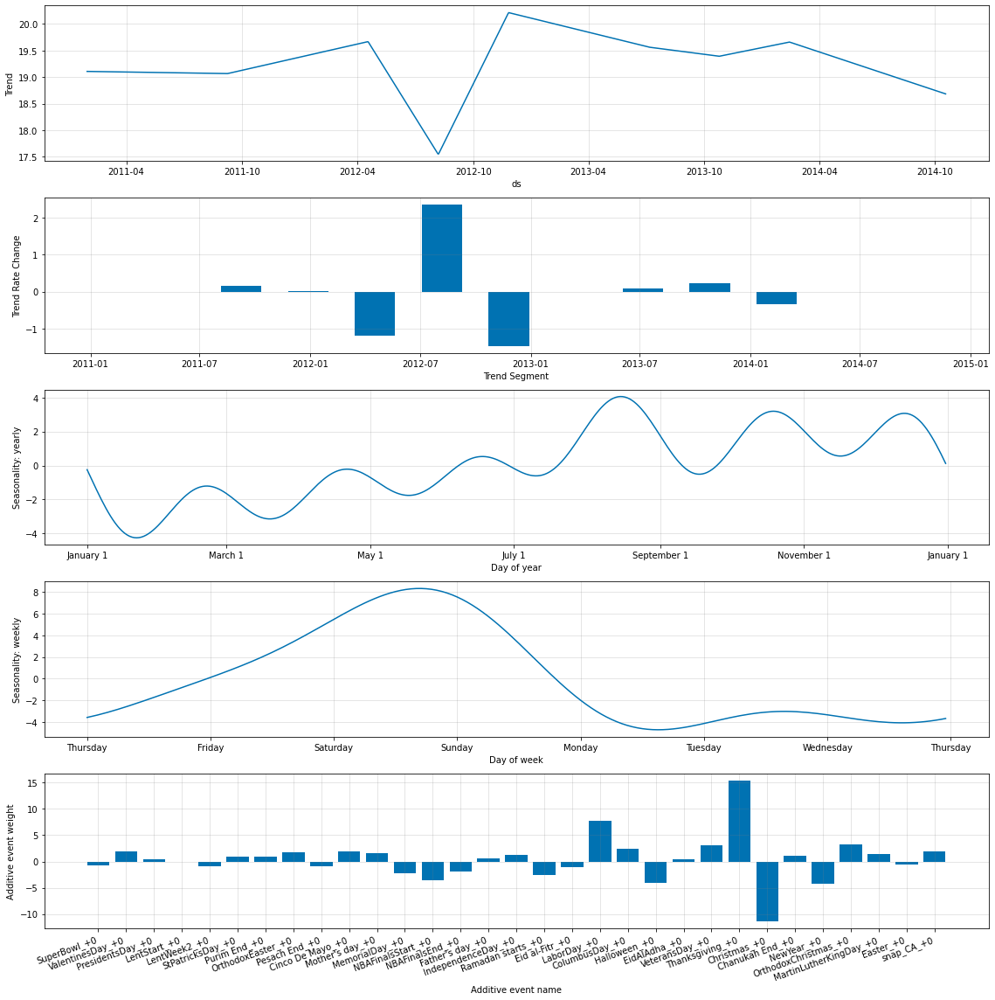

In [89]:
MAPE_Model = dic_models[int_MAPE_ModelNo]
MAPE_Model.plot_parameters(figsize=(16, 16),weekly_start=4)

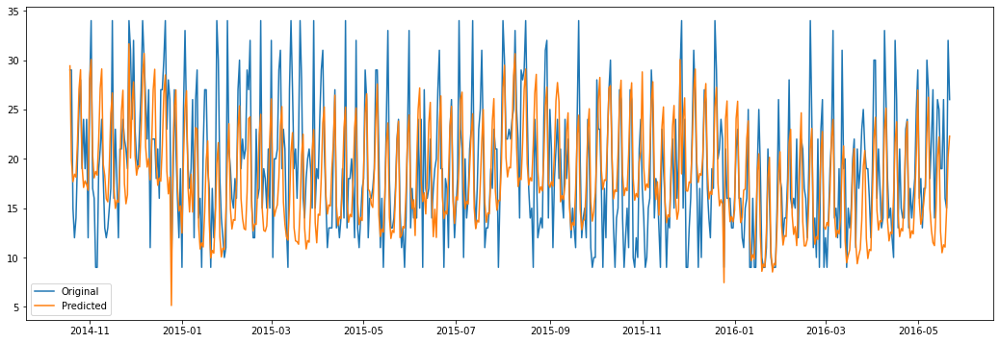

In [90]:
plot_forecast(df_forecasted_data_2.loc[(df_forecasted_data_2.model_No==int_MAPE_ModelNo)])

### FOODS_3_714_TX_3_evaluation

In [91]:
# df_item3 = df_sales.loc[(df_sales.id == 'FOODS_3_714_TX_3_evaluation')].sort_values(by=['date'], ascending=True)
# df_item3.drop(['id'], axis=1, inplace = True)
# df_item3.rename(columns = {'date':'ds', "sales":"y"}, inplace = True)

df_item3, df_TX_events, lst_TX_events = get_Product_data('FOODS_3_714_TX_3_evaluation','TX')

fig = go.Figure()
fig.add_trace(go.Scatter(x=df_item3.ds, y=df_item3.y, name = 'FOODS_3_714_TX_3_evaluation'))
fig.update_layout(xaxis_title="Time", yaxis_title="Sales",title="",title_x=0.5)
fig.show()

In [92]:
m = NeuralProphet(yearly_seasonality=False,
    weekly_seasonality= False,
    daily_seasonality=False,)
df = df_item3
df_train, df_test = m.split_df(df=df, freq="D", valid_p=0.3 )
metrics = m.fit(df=df_train, freq="D" , validation_df=df_test)
metrics.tail(1)

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.33E+01, min: 5.05E-07


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 5.05E-07
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.73E-01
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.74it/s, SmoothL1Loss=0.0301, MAE=6.24, RMSE=7.57, Loss=0.0235, RegLoss


,SmoothL1Loss,MAE,RMSE,Loss,RegLoss,SmoothL1Loss_val,MAE_val,RMSE_val
175,0.030119,6.237517,7.567516,0.023548,0.0,0.356872,24.385273,26.455889


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


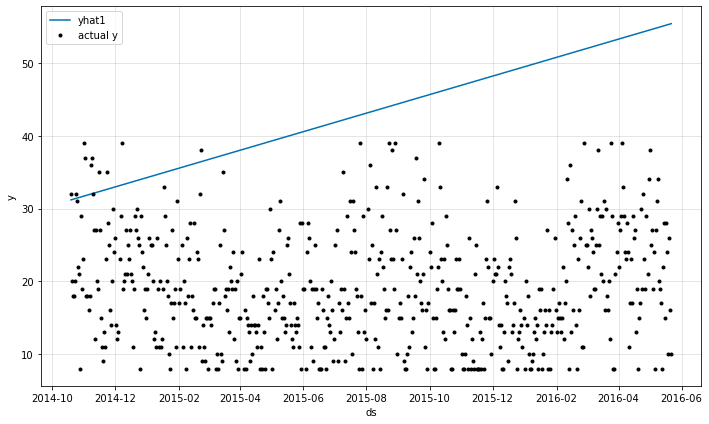

In [93]:
forecast = m.predict(df_test)
# m = m.highlight_nth_step_ahead_of_each_forecast(1)
fig = m.plot(forecast)

In [94]:
mape = mean_absolute_percentage_error(forecast.y,forecast.yhat1).round(2)
mape

1.74

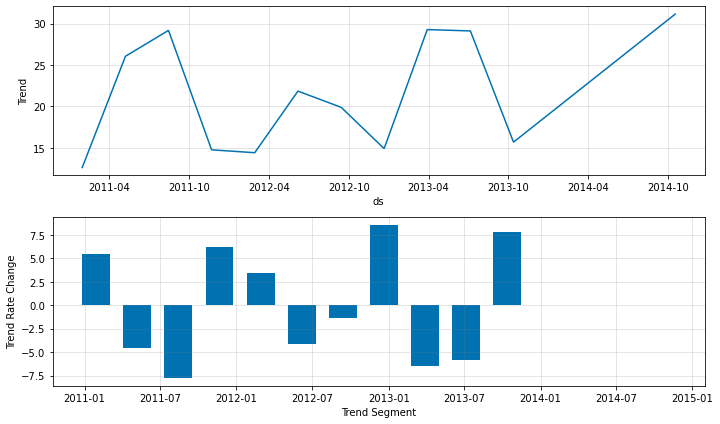

In [95]:
fig_param = m.plot_parameters(weekly_start=4)

In [96]:
m = NeuralProphet()
m.add_events(lst_TX_events)
df = m.create_df_with_events(df_item3, df_TX_events)
df_train, df_test = m.split_df(df=df, freq="D", valid_p=0.3 )
metrics = m.fit(df=df_train, freq="D" , validation_df=df_test)
metrics.tail(1)

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176

  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.54E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.49E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.77E-02
Epoch[176/176]: 100%|█| 176/176 [00:19<00:00,  9.25it/s, SmoothL1Loss=0.0208, MAE=5.08, RMSE=6.28, Loss=0.016, RegLoss=


,SmoothL1Loss,MAE,RMSE,Loss,RegLoss,SmoothL1Loss_val,MAE_val,RMSE_val
175,0.020818,5.077585,6.280444,0.015999,0.0,0.110727,12.236493,14.591239


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


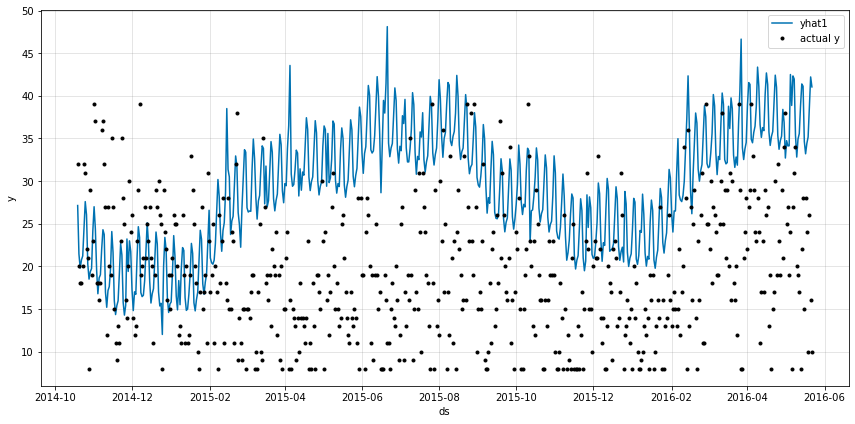

In [97]:
forecast = m.predict(df_test)
# m = m.highlight_nth_step_ahead_of_each_forecast(1)
fig = m.plot(forecast,figsize=(12, 6))

In [98]:
mape = mean_absolute_percentage_error(forecast.y,forecast.yhat1).round(2)
mape

0.87

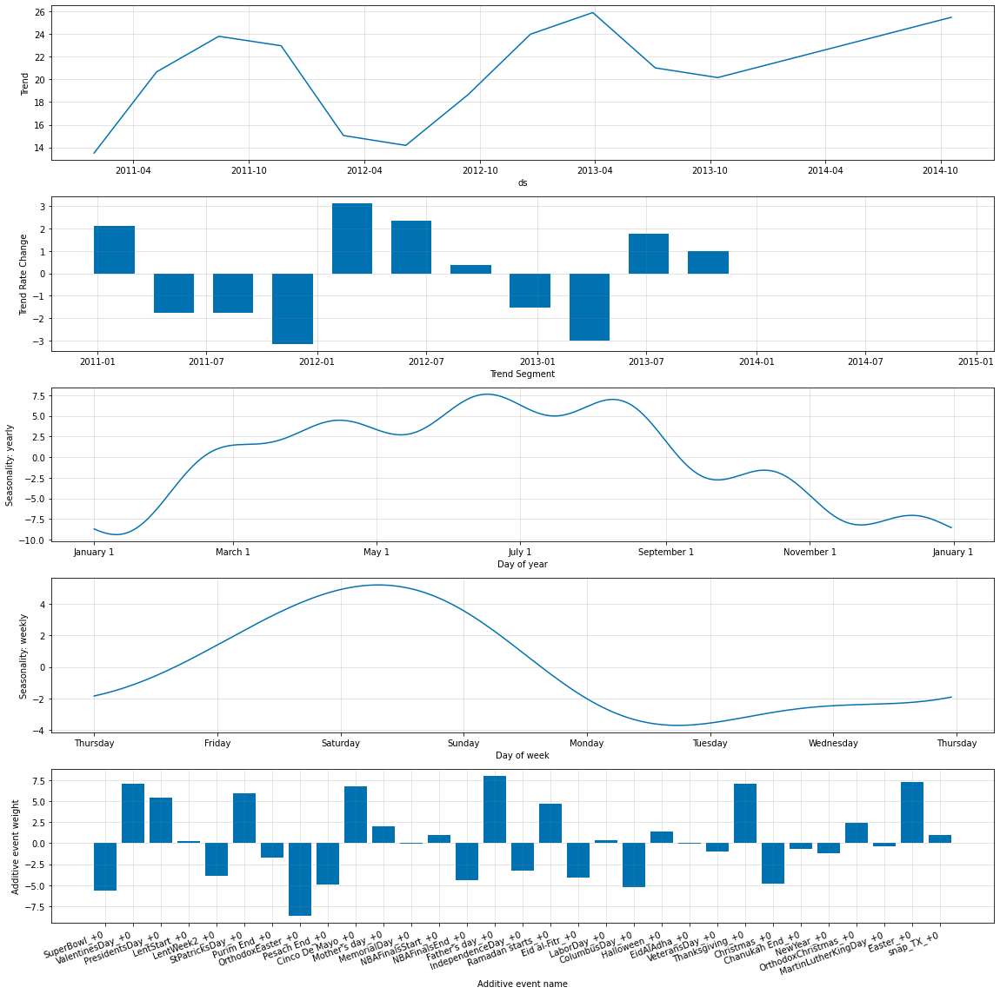

In [99]:
fig_param = m.plot_parameters(figsize=(16, 16),weekly_start=4)

In [100]:
param_grid_1 = {  
#     'ar_reg' : [1],
    'changepoints_range':[0.6,0.65,0.7,0.75,0.9,0.95,0.99],
#     'trend_reg' : [1],
#     'growth' : ['off', 'linear'],
    'seasonality_mode' :['additive','multiplicative'],
#     'num_hidden_layers': [0,1,2]
}

# Generate all combinations of parameters
all_params_1 = [dict(zip(param_grid_1.keys(), v)) for v in itertools.product(*param_grid_1.values())]
len(all_params_1)

14

In [101]:
results_3, df_forecasted_data_3, dic_models = run_NeuralProphet_with_hyperparams(all_params_1,
                                                                               df_item3,
                                                                               df_TX_events,
                                                                               lst_TX_events)

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.


Running Model No :  1  Out of  14 {'changepoints_range': 0.6, 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 2.13E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.81E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:19<00:00,  8.97it/s, SmoothL1Loss=0.0211, MAE=5.09, RMSE=6.32, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  2  Out of  14 {'changepoints_range': 0.6, 'seasonality_mode': 'multiplicative'}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 2.50E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 2.50E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.07E-01
Epoch[176/176]: 100%|█| 176/176 [00:20<00:00,  8.55it/s, SmoothL1Loss=0.021, MAE=5.07, RMSE=6.31, Loss=0.0163, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  3  Out of  14 {'changepoints_range': 0.65, 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 9.14E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.49E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.77E-02
Epoch[176/176]: 100%|█| 176/176 [00:19<00:00,  9.05it/s, SmoothL1Loss=0.0211, MAE=5.1, RMSE=6.29, Loss=0.0163, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  4  Out of  14 {'changepoints_range': 0.65, 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.96E-02, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 2.94E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 5.94E-02
Epoch[176/176]: 100%|█| 176/176 [00:19<00:00,  9.06it/s, SmoothL1Loss=0.021, MAE=5.07, RMSE=6.3, Loss=0.0162, RegLoss=0
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  5  Out of  14 {'changepoints_range': 0.7, 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 2.94E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.54E-01, min: 5.62E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.20E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00,  9.93it/s, SmoothL1Loss=0.0207, MAE=5.05, RMSE=6.25, Loss=0.016, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  6  Out of  14 {'changepoints_range': 0.7, 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 2.50E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 2.13E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.77E-02
Epoch[176/176]: 100%|█| 176/176 [00:19<00:00,  8.93it/s, SmoothL1Loss=0.0207, MAE=5.03, RMSE=6.24, Loss=0.016, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  7  Out of  14 {'changepoints_range': 0.75, 'seasonality_mode': 'additive'}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 2.94E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 3.46E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.14E-02
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.02it/s, SmoothL1Loss=0.0209, MAE=5.08, RMSE=6.25, Loss=0.016, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  8  Out of  14 {'changepoints_range': 0.75, 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 4.07E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 4.07E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.20E-02
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.27it/s, SmoothL1Loss=0.0206, MAE=5.02, RMSE=6.22, Loss=0.0158, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  9  Out of  14 {'changepoints_range': 0.9, 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 2.13E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 7.77E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.77E-02
Epoch[176/176]: 100%|█| 176/176 [00:18<00:00,  9.63it/s, SmoothL1Loss=0.0207, MAE=5.06, RMSE=6.26, Loss=0.0159, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  10  Out of  14 {'changepoints_range': 0.9, 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.78E-01, min: 5.05E-07


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.26E+00, min: 5.05E-07
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 3.92E-01
Epoch[176/176]: 100%|█| 176/176 [00:22<00:00,  7.98it/s, SmoothL1Loss=0.0206, MAE=5.03, RMSE=6.25, Loss=0.0158, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  11  Out of  14 {'changepoints_range': 0.95, 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.75E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.75E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.65E-02
Epoch[176/176]: 100%|█| 176/176 [00:19<00:00,  9.05it/s, SmoothL1Loss=0.0209, MAE=5.09, RMSE=6.29, Loss=0.0161, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  12  Out of  14 {'changepoints_range': 0.95, 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.41E+00, min: 3.59E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.78E-01, min: 3.59E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 4.87E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00,  9.90it/s, SmoothL1Loss=0.0204, MAE=5.01, RMSE=6.22, Loss=0.0157, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  13  Out of  14 {'changepoints_range': 0.99, 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.02E-01
Epoch[176/176]: 100%|█| 176/176 [00:18<00:00,  9.64it/s, SmoothL1Loss=0.0209, MAE=5.1, RMSE=6.28, Loss=0.0161, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  14  Out of  14 {'changepoints_range': 0.99, 'seasonality_mode': 'multiplicative'}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.61E+00, min: 1.60E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.94E-01, min: 1.60E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 5.14E-01
Epoch[176/176]: 100%|█| 176/176 [00:18<00:00,  9.60it/s, SmoothL1Loss=0.0206, MAE=5.02, RMSE=6.24, Loss=0.0158, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


In [102]:
results_3

,model_No,params,RMSE,MAPE
0,1,"{'changepoints_range': 0.6, 'seasonality_mode'...",9.685726,0.607674
0,2,"{'changepoints_range': 0.6, 'seasonality_mode'...",9.148982,0.611325
0,3,"{'changepoints_range': 0.65, 'seasonality_mode...",10.025866,0.662140
0,4,"{'changepoints_range': 0.65, 'seasonality_mode...",9.228806,0.662025
0,5,"{'changepoints_range': 0.7, 'seasonality_mode'...",9.988330,0.753675
0,6,"{'changepoints_range': 0.7, 'seasonality_mode'...",9.785772,0.716588
0,7,"{'changepoints_range': 0.75, 'seasonality_mode...",10.889870,0.852334
0,8,"{'changepoints_range': 0.75, 'seasonality_mode...",10.252033,0.813535
0,9,"{'changepoints_range': 0.9, 'seasonality_mode'...",9.649893,0.536739
0,10,"{'changepoints_range': 0.9, 'seasonality_mode'...",9.901630,0.823598


In [103]:
int_RMSE_ModelNo = results_3.loc[(results_3.RMSE <= results_3.RMSE.min())].model_No.min()
int_MAPE_ModelNo = results_3.loc[(results_3.MAPE <= results_3.MAPE.min())].model_No.min()
results_3.loc[results_3.model_No.isin([int_RMSE_ModelNo,int_MAPE_ModelNo])]

,model_No,params,RMSE,MAPE
0,9,"{'changepoints_range': 0.9, 'seasonality_mode'...",9.649893,0.536739
0,14,"{'changepoints_range': 0.99, 'seasonality_mode...",8.807615,0.553241


In [104]:
print( 'RMSE Best Params : ', results_3.loc[results_3.model_No == int_RMSE_ModelNo].params.to_list())
print( 'MAPE Best Params : ', results_3.loc[results_3.model_No == int_MAPE_ModelNo].params.to_list())

RMSE Best Params :  [{'changepoints_range': 0.99, 'seasonality_mode': 'multiplicative'}]
MAPE Best Params :  [{'changepoints_range': 0.9, 'seasonality_mode': 'additive'}]


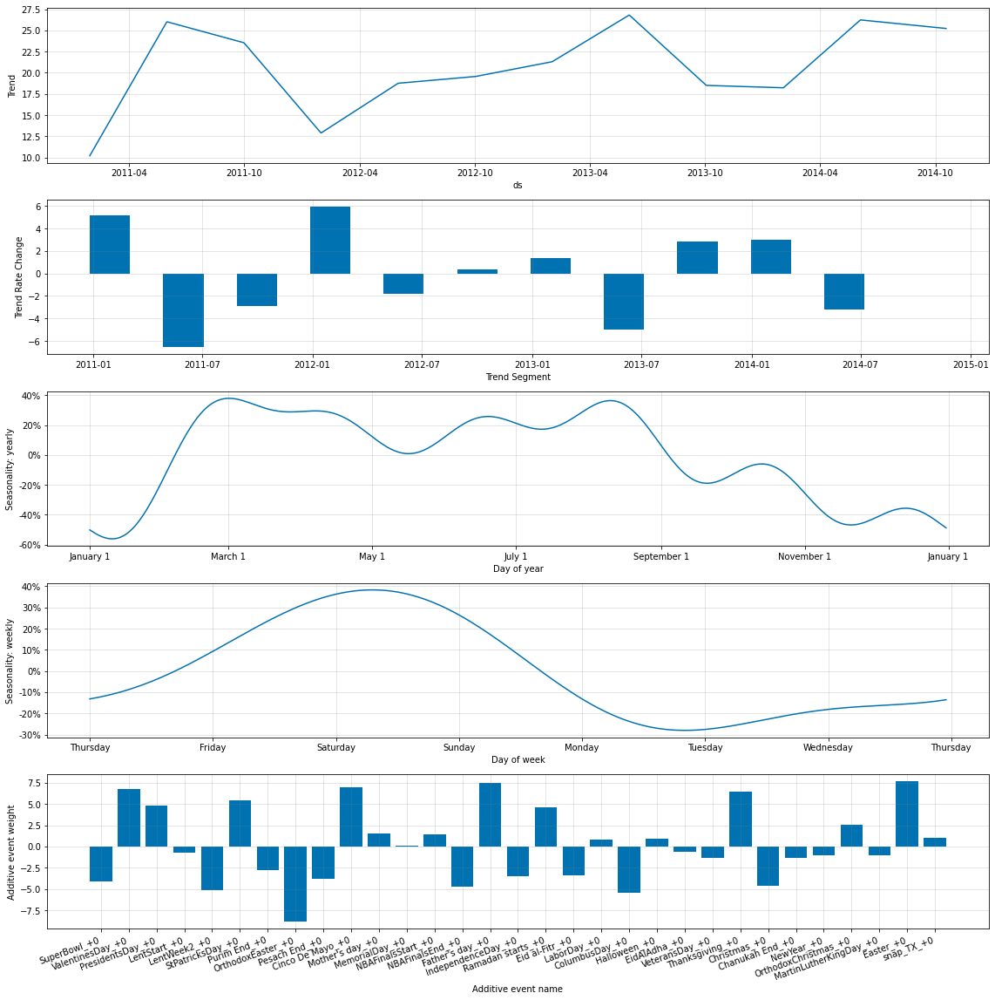

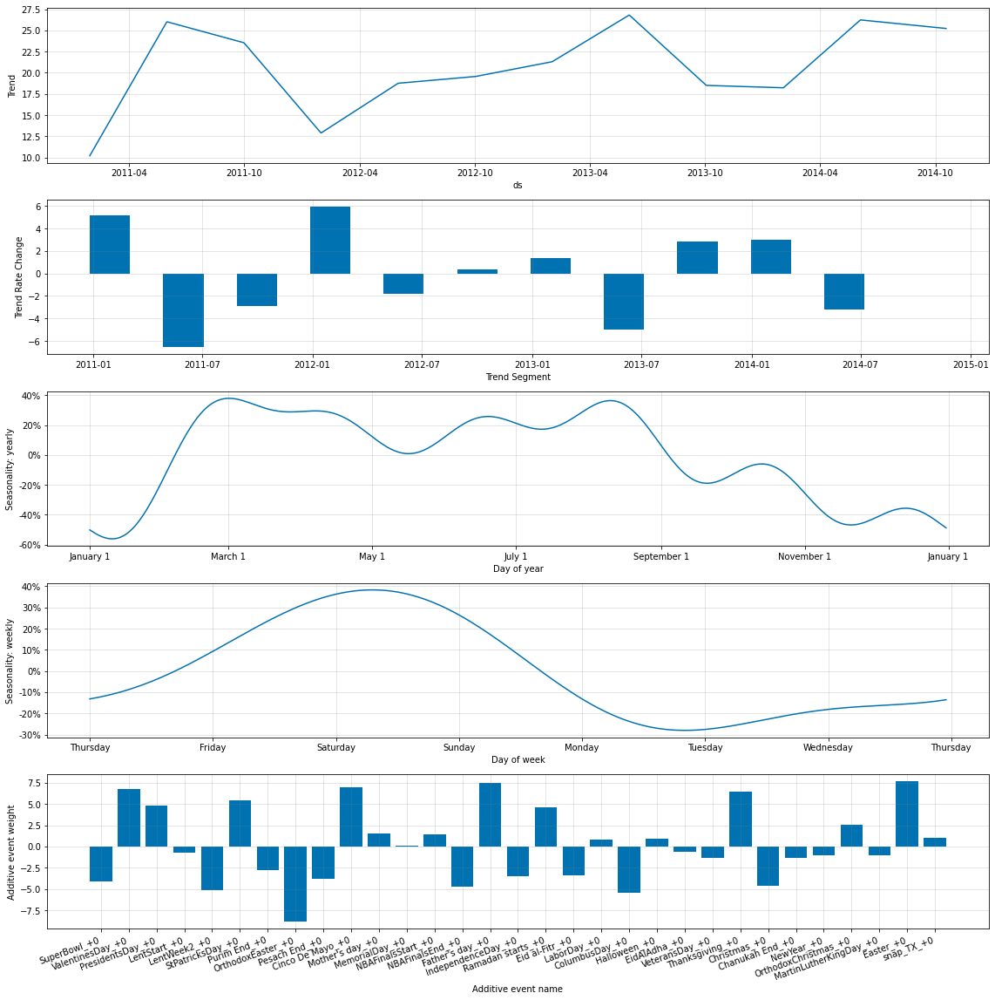

In [105]:
RMSE_Model = dic_models[int_RMSE_ModelNo]
RMSE_Model.plot_parameters(figsize=(16, 16),weekly_start=4)

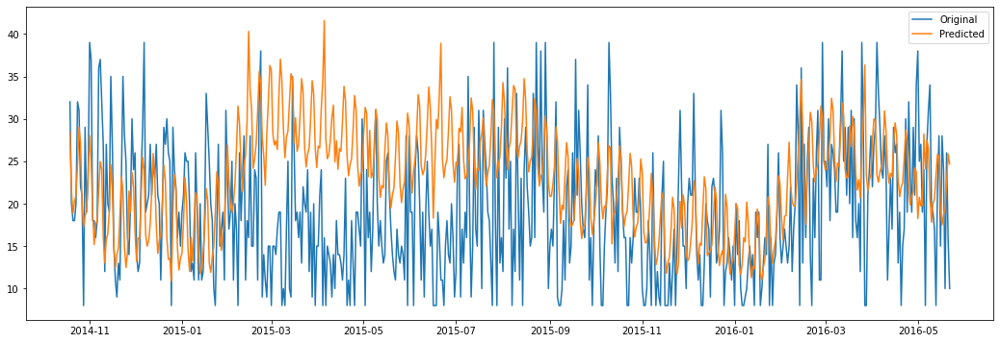

In [106]:
plot_forecast(df_forecasted_data_3.loc[(df_forecasted_data_3.model_No==int_RMSE_ModelNo)])

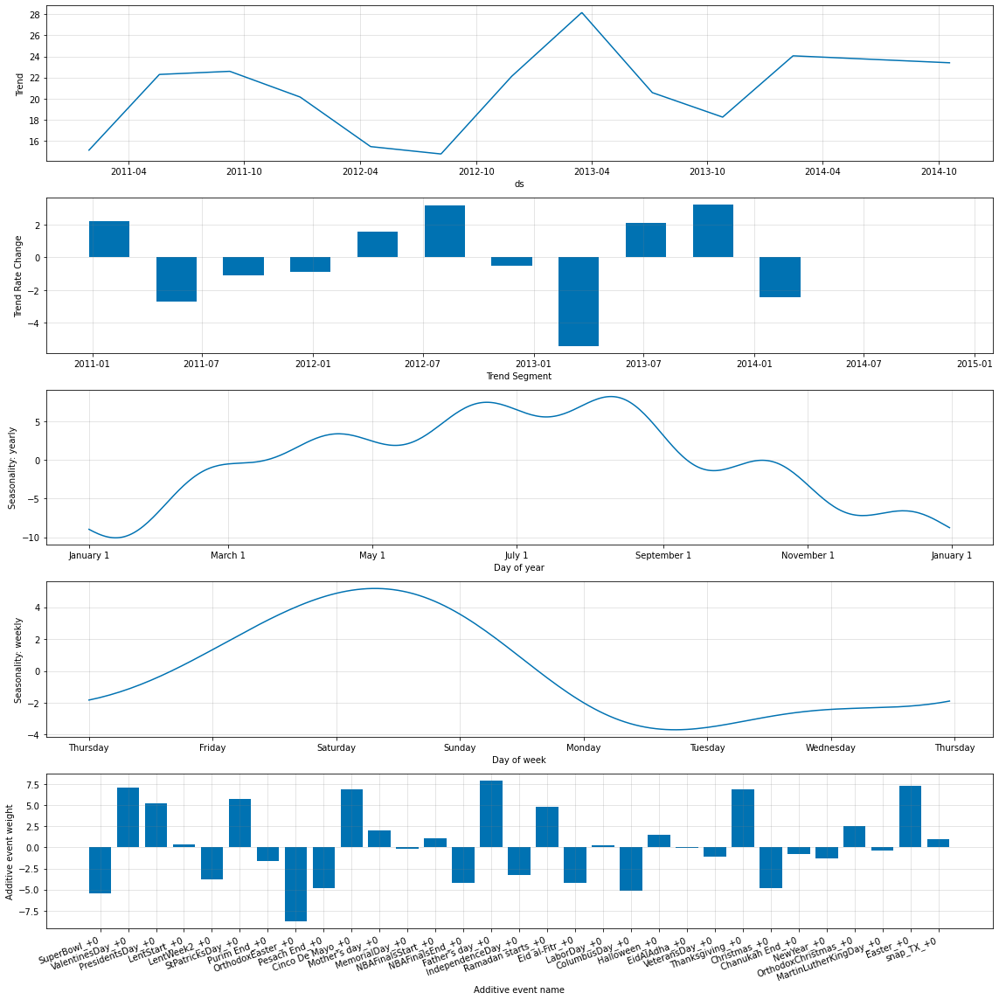

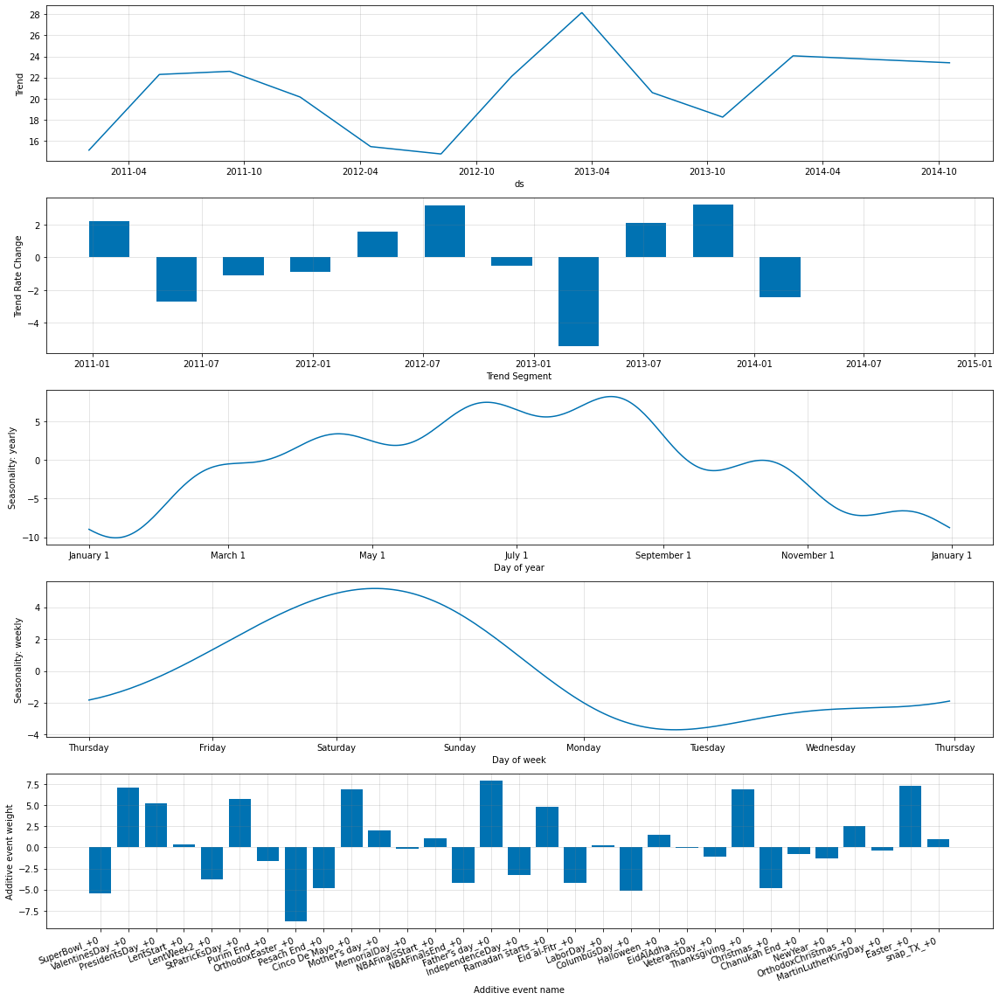

In [107]:
MAPE_Model = dic_models[int_MAPE_ModelNo]
MAPE_Model.plot_parameters(figsize=(16, 16),weekly_start=4)

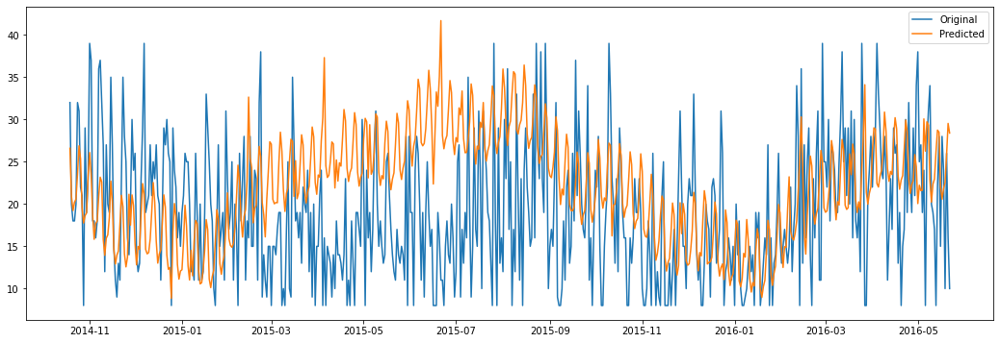

In [108]:
plot_forecast(df_forecasted_data_3.loc[(df_forecasted_data_3.model_No==int_MAPE_ModelNo)])

### FOODS_3_586_WI_1_evaluation

In [109]:
df_item4, df_WI_events, lst_WI_events = get_Product_data('FOODS_3_586_WI_1_evaluation','WI')

fig = go.Figure()
fig.add_trace(go.Scatter(x=df_item4.ds, y=df_item4.y, name = 'FOODS_3_586_WI_1_evaluation'))
fig.update_layout(xaxis_title="Time", yaxis_title="Sales",title="",title_x=0.5)
fig.show()

In [110]:
m = NeuralProphet(yearly_seasonality=False,
    weekly_seasonality= False,
    daily_seasonality=False,)
df = df_item4
df_train, df_test = m.split_df(df=df, freq="D", valid_p=0.3 )
metrics = m.fit(df=df_train, freq="D" , validation_df=df_test)
metrics.tail(1)

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.96E-02, min: 1.68E+01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.96E-02, min: 1.68E+01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.26E-02
Epoch[176/176]: 100%|█| 176/176 [00:14<00:00, 12.48it/s, SmoothL1Loss=0.0347, MAE=4.97, RMSE=6.04, Loss=0.0267, RegLoss


,SmoothL1Loss,MAE,RMSE,Loss,RegLoss,SmoothL1Loss_val,MAE_val,RMSE_val
175,0.03467,4.966584,6.037096,0.026685,0.0,0.095772,8.744373,10.066126


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


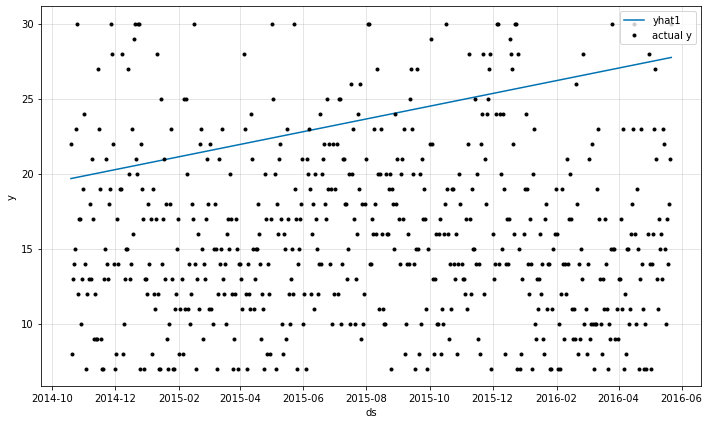

In [111]:
forecast = m.predict(df_test)
# m = m.highlight_nth_step_ahead_of_each_forecast(1)
fig = m.plot(forecast)

In [112]:
mape = mean_absolute_percentage_error(forecast.y,forecast.yhat1).round(2)
mape

0.76

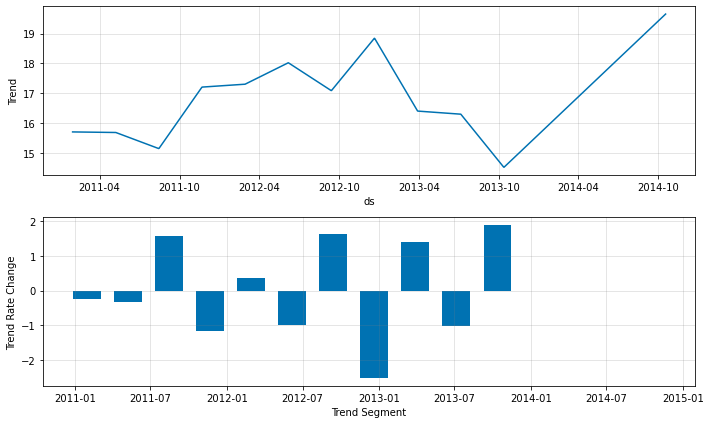

In [113]:
fig_param = m.plot_parameters(weekly_start=4)

In [114]:
m = NeuralProphet()
m.add_events(lst_WI_events)
df = m.create_df_with_events(df_item4, df_WI_events)
df_train, df_test = m.split_df(df=df, freq="D", valid_p=0.3 )
metrics = m.fit(df=df_train, freq="D" , validation_df=df_test)
metrics.tail(1)

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176

  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.75E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.49E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.20E-01
Epoch[176/176]: 100%|█| 176/176 [00:20<00:00,  8.78it/s, SmoothL1Loss=0.0216, MAE=3.84, RMSE=4.74, Loss=0.0163, RegLoss


,SmoothL1Loss,MAE,RMSE,Loss,RegLoss,SmoothL1Loss_val,MAE_val,RMSE_val
175,0.021611,3.84401,4.740565,0.016256,0.0,0.073375,7.296869,8.811197


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


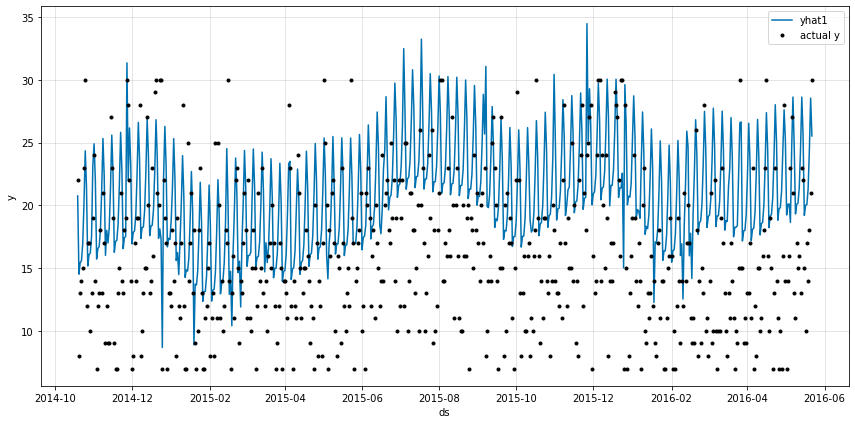

In [115]:
forecast = m.predict(df_test)
# m = m.highlight_nth_step_ahead_of_each_forecast(1)
fig = m.plot(forecast,figsize=(12, 6))

In [116]:
mape = mean_absolute_percentage_error(forecast.y,forecast.yhat1).round(2)
mape

0.5

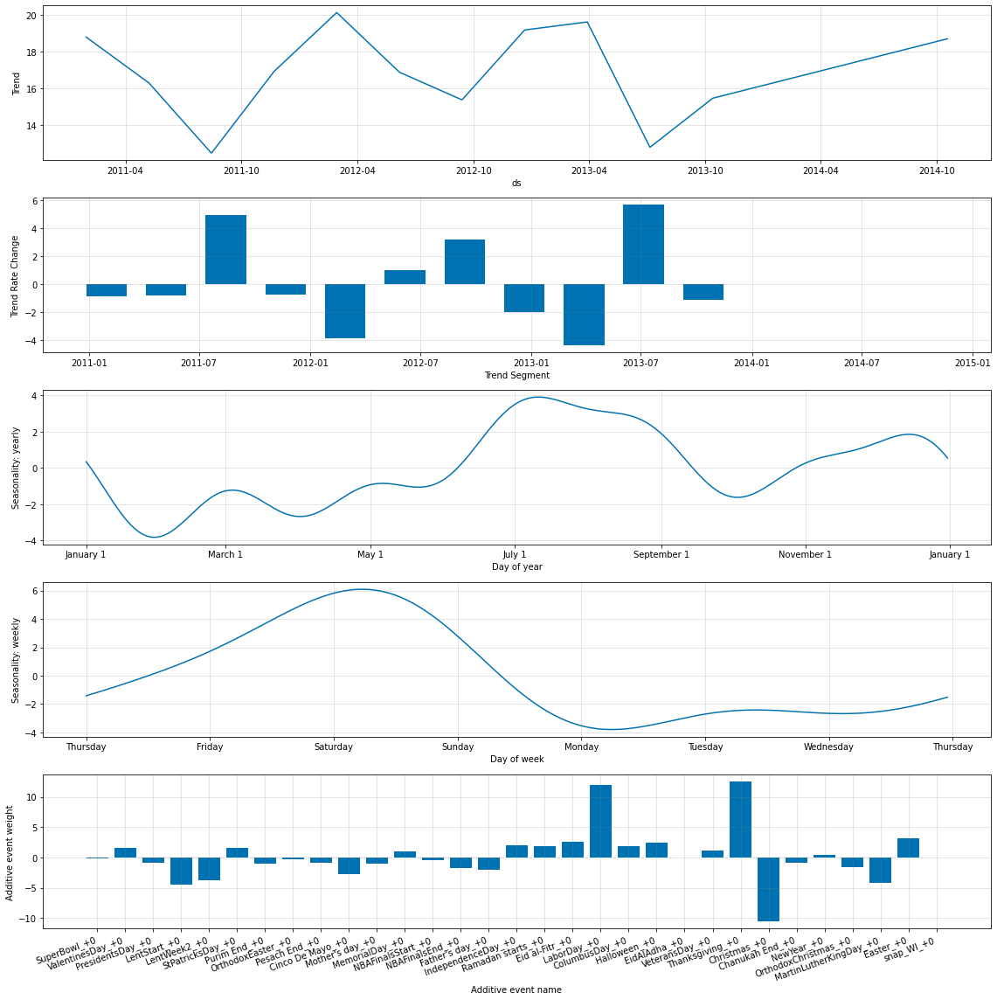

In [117]:
fig_param = m.plot_parameters(figsize=(16, 16),weekly_start=4)

In [118]:
param_grid_1 = {  
#     'ar_reg' : [1],
    'changepoints_range':[0.6,0.65,0.7,0.75,0.9,0.95,0.99],
#     'trend_reg' : [1],
    'growth' : ['off', 'linear'],
    'seasonality_mode' :['additive','multiplicative'],
#     'num_hidden_layers': [0,1,2]
}

# Generate all combinations of parameters
all_params_1 = [dict(zip(param_grid_1.keys(), v)) for v in itertools.product(*param_grid_1.values())]
len(all_params_1)

28

In [119]:
results_4, df_forecasted_data_4, dic_models = run_NeuralProphet_with_hyperparams(all_params_1,
                                                                               df_item4,
                                                                               df_WI_events,
                                                                               lst_WI_events)

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.


Running Model No :  1  Out of  28 {'changepoints_range': 0.6, 'growth': 'off', 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 5.62E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 5.62E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.07E-01
Epoch[176/176]: 100%|█| 176/176 [00:14<00:00, 12.15it/s, SmoothL1Loss=0.0237, MAE=3.99, RMSE=4.97, Loss=0.018, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  2  Out of  28 {'changepoints_range': 0.6, 'growth': 'off', 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.37E-02
Epoch[176/176]: 100%|█| 176/176 [00:15<00:00, 11.45it/s, SmoothL1Loss=0.0237, MAE=4, RMSE=4.98, Loss=0.018, RegLoss=0, 
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  3  Out of  28 {'changepoints_range': 0.6, 'growth': 'linear', 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 4.07E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 1.75E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.98E-02
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.95it/s, SmoothL1Loss=0.0221, MAE=3.86, RMSE=4.8, Loss=0.0168, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  4  Out of  28 {'changepoints_range': 0.6, 'growth': 'linear', 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 7.77E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.94E-01, min: 9.14E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.33E-01
Epoch[176/176]: 100%|█| 176/176 [00:19<00:00,  9.14it/s, SmoothL1Loss=0.0215, MAE=3.8, RMSE=4.73, Loss=0.0163, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  5  Out of  28 {'changepoints_range': 0.65, 'growth': 'off', 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 3.46E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.07E-01
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.86it/s, SmoothL1Loss=0.0237, MAE=4, RMSE=4.98, Loss=0.018, RegLoss=0, 
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  6  Out of  28 {'changepoints_range': 0.65, 'growth': 'off', 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 3.92E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 6.38E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.02E-01
Epoch[176/176]: 100%|█| 176/176 [00:14<00:00, 12.20it/s, SmoothL1Loss=0.0237, MAE=4, RMSE=4.96, Loss=0.018, RegLoss=0, 
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  7  Out of  28 {'changepoints_range': 0.65, 'growth': 'linear', 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.26E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.75E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.65E-02
Epoch[176/176]: 100%|█| 176/176 [00:18<00:00,  9.63it/s, SmoothL1Loss=0.0218, MAE=3.84, RMSE=4.77, Loss=0.0166, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  8  Out of  28 {'changepoints_range': 0.65, 'growth': 'linear', 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 4.07E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.61E-01, min: 2.50E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.65E-01
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.40it/s, SmoothL1Loss=0.0214, MAE=3.8, RMSE=4.74, Loss=0.0162, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  9  Out of  28 {'changepoints_range': 0.7, 'growth': 'off', 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.26E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.79it/s, SmoothL1Loss=0.0237, MAE=3.99, RMSE=4.96, Loss=0.018, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  10  Out of  28 {'changepoints_range': 0.7, 'growth': 'off', 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.59E-02, min: 9.47E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.59E-02, min: 1.31E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 4.07E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.95it/s, SmoothL1Loss=0.0237, MAE=3.99, RMSE=4.95, Loss=0.018, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  11  Out of  28 {'changepoints_range': 0.7, 'growth': 'linear', 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.78E-01, min: 5.83E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.62E-01, min: 5.83E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 3.00E-01
Epoch[176/176]: 100%|█| 176/176 [00:18<00:00,  9.77it/s, SmoothL1Loss=0.0208, MAE=3.77, RMSE=4.66, Loss=0.0157, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  12  Out of  28 {'changepoints_range': 0.7, 'growth': 'linear', 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 2.84E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 1.49E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 5.62E-02
Epoch[176/176]: 100%|█| 176/176 [00:20<00:00,  8.67it/s, SmoothL1Loss=0.0205, MAE=3.72, RMSE=4.61, Loss=0.0154, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  13  Out of  28 {'changepoints_range': 0.75, 'growth': 'off', 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.81E-01, min: 1.26E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.50E-01, min: 6.61E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.65E-01
Epoch[176/176]: 100%|█| 176/176 [00:14<00:00, 11.79it/s, SmoothL1Loss=0.0237, MAE=4, RMSE=4.97, Loss=0.018, RegLoss=0, 
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  14  Out of  28 {'changepoints_range': 0.75, 'growth': 'off', 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 3.59E-02, min: 1.11E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 3.05E-02, min: 9.47E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 4.78E-02
Epoch[176/176]: 100%|█| 176/176 [00:14<00:00, 12.10it/s, SmoothL1Loss=0.0237, MAE=4, RMSE=4.97, Loss=0.018, RegLoss=0, 
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  15  Out of  28 {'changepoints_range': 0.75, 'growth': 'linear', 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 3.46E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.14E-02
Epoch[176/176]: 100%|█| 176/176 [00:18<00:00,  9.54it/s, SmoothL1Loss=0.0211, MAE=3.79, RMSE=4.7, Loss=0.016, RegLoss=0
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  16  Out of  28 {'changepoints_range': 0.75, 'growth': 'linear', 'seasonality_mode': 'multiplicative'}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 1.49E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.54E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.37E-02
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.18it/s, SmoothL1Loss=0.0208, MAE=3.75, RMSE=4.67, Loss=0.0157, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  17  Out of  28 {'changepoints_range': 0.9, 'growth': 'off', 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 4.07E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 4.07E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.85it/s, SmoothL1Loss=0.0237, MAE=3.99, RMSE=4.97, Loss=0.018, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  18  Out of  28 {'changepoints_range': 0.9, 'growth': 'off', 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 2.50E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 13.16it/s, SmoothL1Loss=0.0237, MAE=4, RMSE=4.97, Loss=0.018, RegLoss=0, 
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  19  Out of  28 {'changepoints_range': 0.9, 'growth': 'linear', 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.26E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.75E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.65E-02
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00,  9.91it/s, SmoothL1Loss=0.0215, MAE=3.83, RMSE=4.72, Loss=0.0161, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  20  Out of  28 {'changepoints_range': 0.9, 'growth': 'linear', 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 7.77E-01, min: 6.85E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.14E-01, min: 6.85E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 4.14E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00,  9.81it/s, SmoothL1Loss=0.021, MAE=3.78, RMSE=4.69, Loss=0.0157, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  21  Out of  28 {'changepoints_range': 0.95, 'growth': 'off', 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 9.14E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.65E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.97it/s, SmoothL1Loss=0.0237, MAE=4, RMSE=4.97, Loss=0.018, RegLoss=0, 
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  22  Out of  28 {'changepoints_range': 0.95, 'growth': 'off', 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 9.14E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 2.13E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.98E-02
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 13.42it/s, SmoothL1Loss=0.0237, MAE=4, RMSE=4.94, Loss=0.018, RegLoss=0, 
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  23  Out of  28 {'changepoints_range': 0.95, 'growth': 'linear', 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 4.78E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.20E-01
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.60it/s, SmoothL1Loss=0.0218, MAE=3.85, RMSE=4.77, Loss=0.0165, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  24  Out of  28 {'changepoints_range': 0.95, 'growth': 'linear', 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.61E-01, min: 1.60E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.62E-01, min: 1.60E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 3.34E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.25it/s, SmoothL1Loss=0.0215, MAE=3.81, RMSE=4.73, Loss=0.0162, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  25  Out of  28 {'changepoints_range': 0.99, 'growth': 'off', 'seasonality_mode': 'additive'}


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 2.94E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.65E-02
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 13.18it/s, SmoothL1Loss=0.0237, MAE=3.99, RMSE=4.97, Loss=0.018, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  26  Out of  28 {'changepoints_range': 0.99, 'growth': 'off', 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.21E-02, min: 1.11E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.88E-02, min: 1.31E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 3.46E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 14.06it/s, SmoothL1Loss=0.0237, MAE=4, RMSE=4.96, Loss=0.018, RegLoss=0, 
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  27  Out of  28 {'changepoints_range': 0.99, 'growth': 'linear', 'seasonality_mode': 'additive'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 3.46E-01, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.14E-01, min: 1.75E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 3.16E-01
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.61it/s, SmoothL1Loss=0.0219, MAE=3.88, RMSE=4.8, Loss=0.0166, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  28  Out of  28 {'changepoints_range': 0.99, 'growth': 'linear', 'seasonality_mode': 'multiplicative'}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 2.05E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.07E-01
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.40it/s, SmoothL1Loss=0.0217, MAE=3.85, RMSE=4.74, Loss=0.0164, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


In [120]:
results_4

,model_No,params,RMSE,MAPE
0,1,"{'changepoints_range': 0.6, 'growth': 'off', '...",6.573595,0.299035
0,2,"{'changepoints_range': 0.6, 'growth': 'off', '...",6.606081,0.300210
0,3,"{'changepoints_range': 0.6, 'growth': 'linear'...",6.763885,0.369814
0,4,"{'changepoints_range': 0.6, 'growth': 'linear'...",6.824386,0.350913
0,5,"{'changepoints_range': 0.65, 'growth': 'off', ...",6.779382,0.299784
0,6,"{'changepoints_range': 0.65, 'growth': 'off', ...",6.713293,0.299593
0,7,"{'changepoints_range': 0.65, 'growth': 'linear...",6.942638,0.426805
0,8,"{'changepoints_range': 0.65, 'growth': 'linear...",6.750064,0.391863
0,9,"{'changepoints_range': 0.7, 'growth': 'off', '...",6.774700,0.299269
0,10,"{'changepoints_range': 0.7, 'growth': 'off', '...",6.771029,0.299147


In [121]:
int_RMSE_ModelNo = results_4.loc[(results_4.RMSE <= results_4.RMSE.min())].model_No.min()
int_MAPE_ModelNo = results_4.loc[(results_4.MAPE <= results_4.MAPE.min())].model_No.min()
results_4.loc[results_4.model_No.isin([int_RMSE_ModelNo,int_MAPE_ModelNo])]

,model_No,params,RMSE,MAPE
0,1,"{'changepoints_range': 0.6, 'growth': 'off', '...",6.573595,0.299035


In [122]:
print( 'RMSE Best Params : ', results_4.loc[results_4.model_No == int_RMSE_ModelNo].params.to_list())
print( 'MAPE Best Params : ', results_4.loc[results_4.model_No == int_MAPE_ModelNo].params.to_list())

RMSE Best Params :  [{'changepoints_range': 0.6, 'growth': 'off', 'seasonality_mode': 'additive'}]
MAPE Best Params :  [{'changepoints_range': 0.6, 'growth': 'off', 'seasonality_mode': 'additive'}]


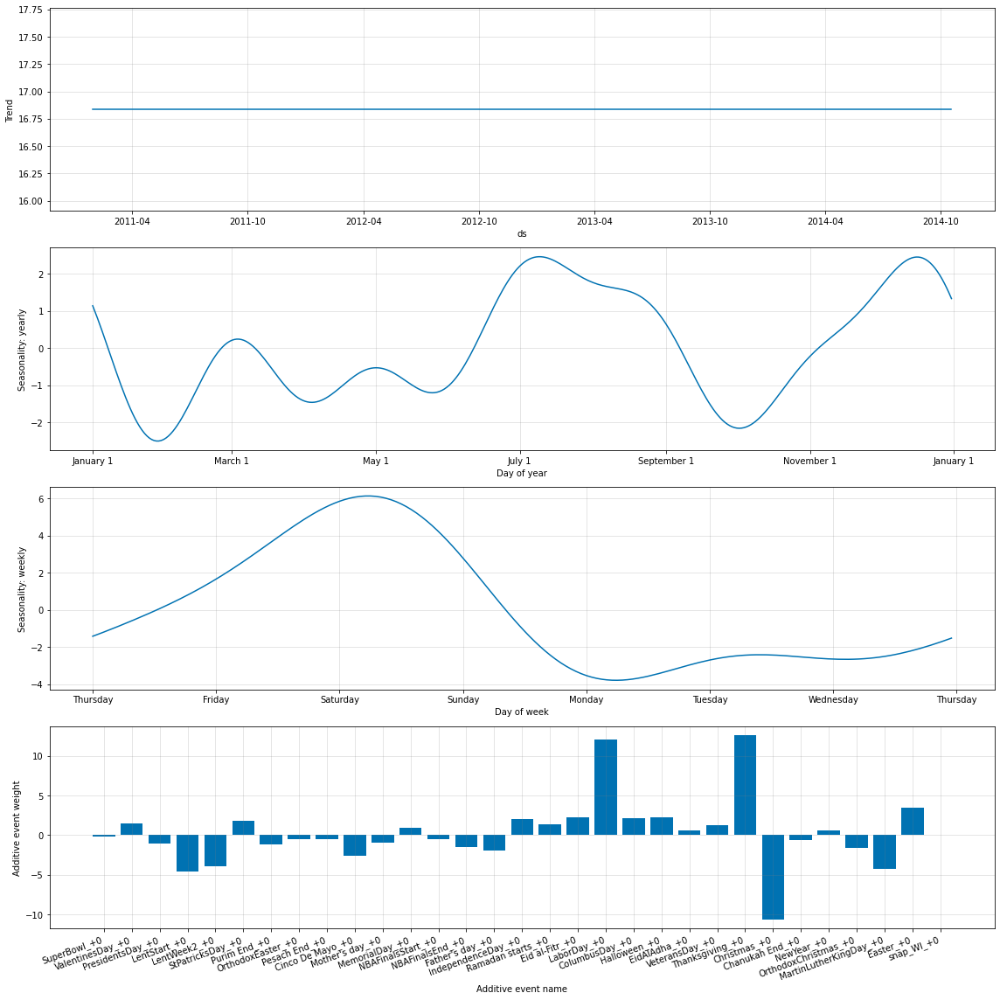

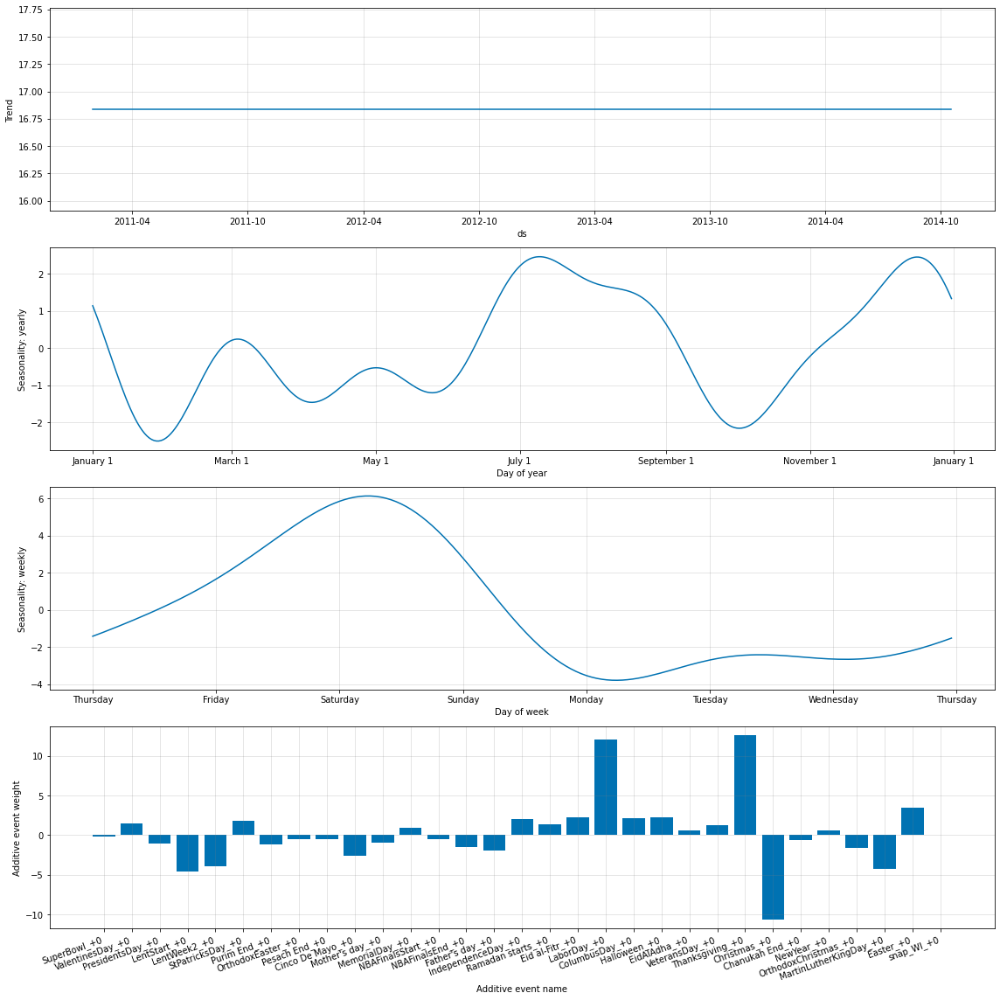

In [123]:
RMSE_Model = dic_models[int_RMSE_ModelNo]
RMSE_Model.plot_parameters(figsize=(16, 16),weekly_start=4)

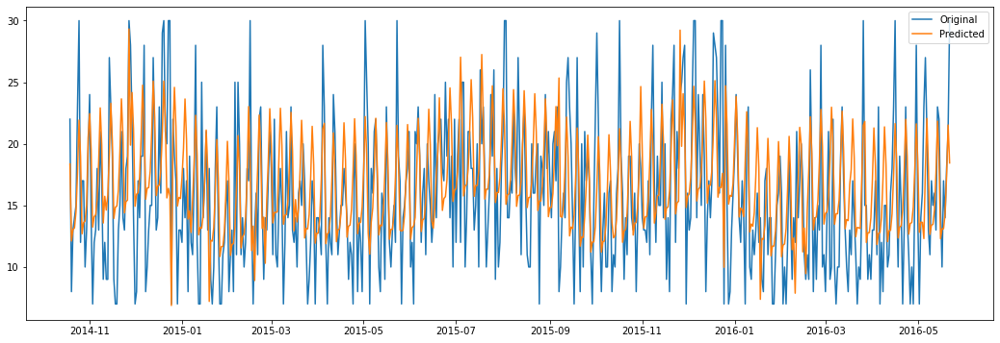

In [124]:
plot_forecast(df_forecasted_data_4.loc[(df_forecasted_data_4.model_No==int_RMSE_ModelNo)])

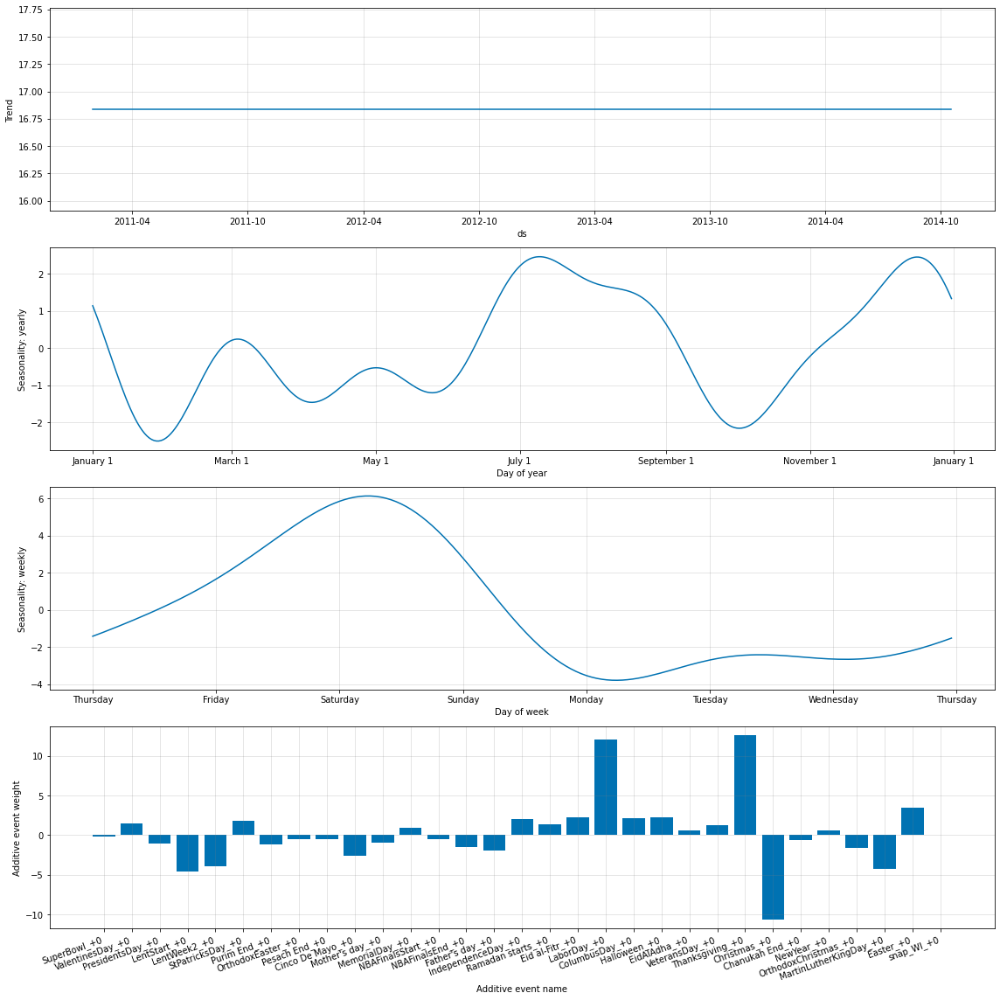

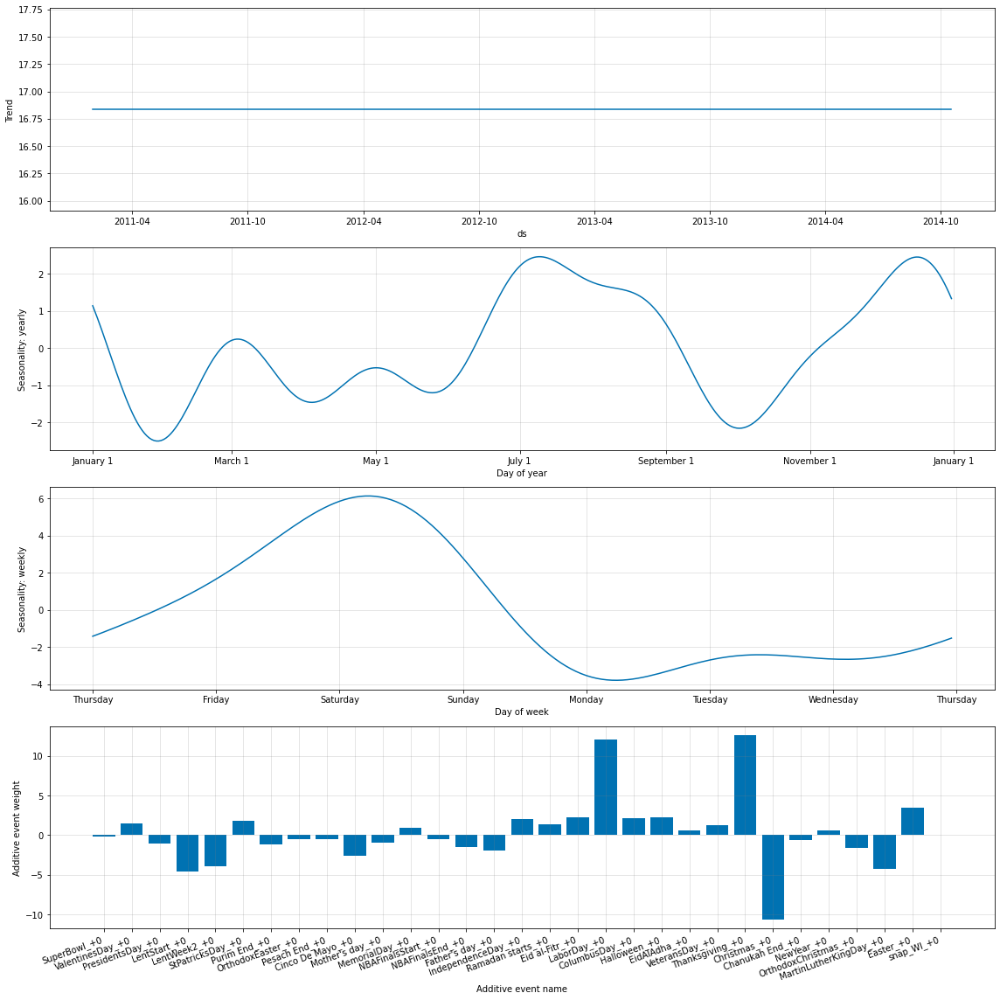

In [125]:
MAPE_Model = dic_models[int_MAPE_ModelNo]
MAPE_Model.plot_parameters(figsize=(16, 16),weekly_start=4)

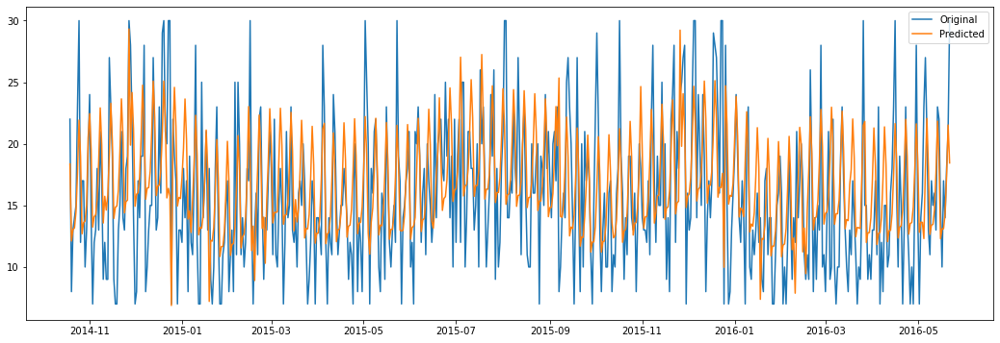

In [126]:
plot_forecast(df_forecasted_data_4.loc[(df_forecasted_data_4.model_No==int_MAPE_ModelNo)])

### FOODS_3_252_TX_1_evaluation

In [127]:
df_item5, df_TX_events, lst_TX_events = get_Product_data('FOODS_3_252_TX_1_evaluation','TX')

fig = go.Figure()
fig.add_trace(go.Scatter(x=df_item5.ds, y=df_item5.y, name = 'FOODS_3_252_TX_1_evaluation'))
fig.update_layout(xaxis_title="Time", yaxis_title="Sales",title="",title_x=0.5)
fig.show()

In [128]:
m = NeuralProphet(yearly_seasonality=False,
    weekly_seasonality= False,
    daily_seasonality=False,)
df = df_item5
df_train, df_test = m.split_df(df=df, freq="D", valid_p=0.3 )
metrics = m.fit(df=df_train, freq="D" , validation_df=df_test)
metrics.tail(1)

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.59E-02, min: 6.85E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.84E+00, min: 6.85E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.95E-01
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.81it/s, SmoothL1Loss=0.0218, MAE=7.78, RMSE=9.54, Loss=0.0165, RegLoss


,SmoothL1Loss,MAE,RMSE,Loss,RegLoss,SmoothL1Loss_val,MAE_val,RMSE_val
175,0.02175,7.782632,9.539213,0.016549,0.0,0.095301,17.152508,20.082687


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


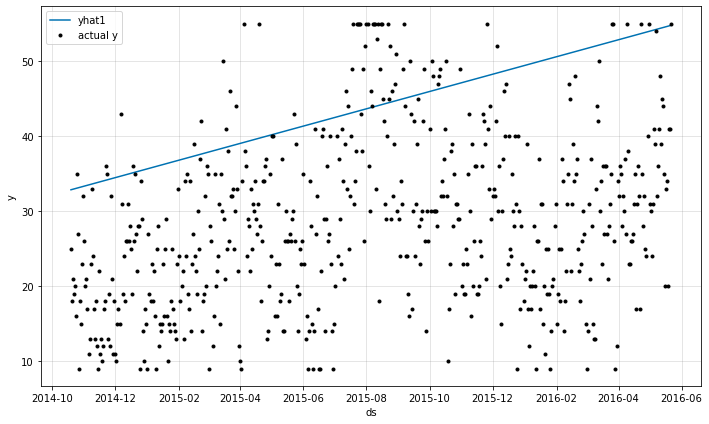

In [129]:
forecast = m.predict(df_test)
# m = m.highlight_nth_step_ahead_of_each_forecast(1)
fig = m.plot(forecast)

In [130]:
mape = mean_absolute_percentage_error(forecast.y,forecast.yhat1).round(2)
mape

0.84

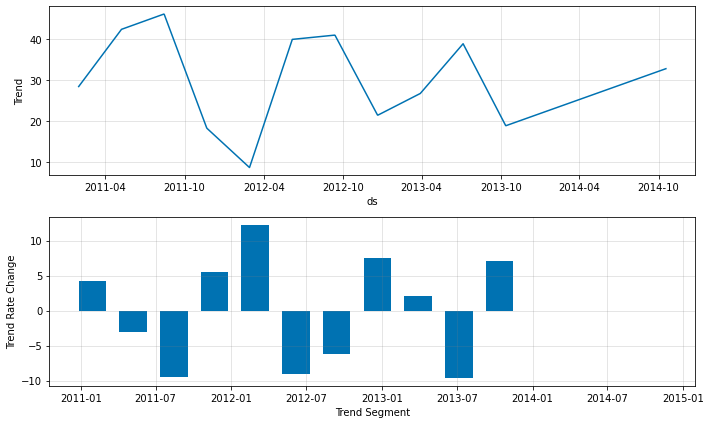

In [131]:
fig_param = m.plot_parameters(weekly_start=4)

In [132]:
m = NeuralProphet()
m.add_events(lst_TX_events)
df = m.create_df_with_events(df_item5, df_TX_events)
df_train, df_test = m.split_df(df=df, freq="D", valid_p=0.3 )
metrics = m.fit(df=df_train, freq="D" , validation_df=df_test)
metrics.tail(1)

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176

  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.49E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 9.14E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.43it/s, SmoothL1Loss=0.0153, MAE=6.39, RMSE=7.96, Loss=0.0115, RegLoss


,SmoothL1Loss,MAE,RMSE,Loss,RegLoss,SmoothL1Loss_val,MAE_val,RMSE_val
175,0.015328,6.388726,7.96393,0.01153,0.0,0.044675,11.166186,13.750036


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


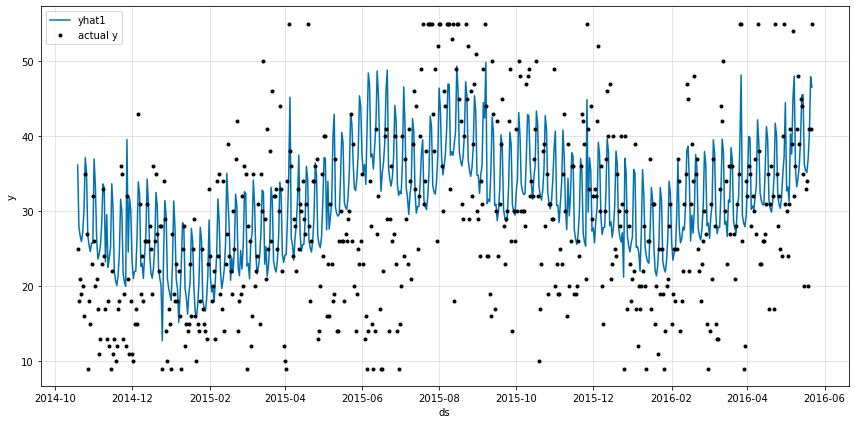

In [133]:
forecast = m.predict(df_test)
# m = m.highlight_nth_step_ahead_of_each_forecast(1)
fig = m.plot(forecast,figsize=(12, 6))

In [134]:
mape = mean_absolute_percentage_error(forecast.y,forecast.yhat1).round(2)
mape

0.37

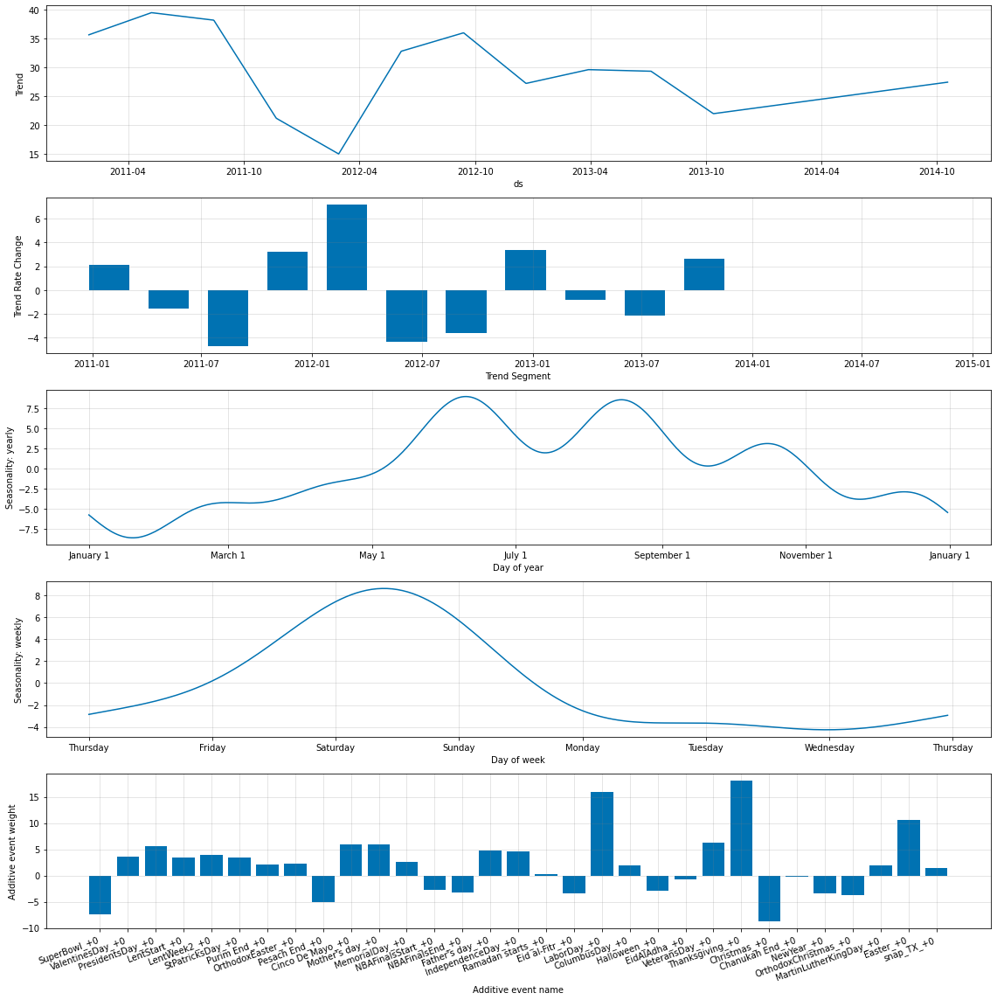

In [135]:
fig_param = m.plot_parameters(figsize=(16, 16),weekly_start=4)

In [136]:
param_grid_1 = {  
#     'ar_reg' : [1],
    'changepoints_range':[0.6,0.65,0.7,0.75,0.9,0.95,0.99],
#     'trend_reg' : [1],
    'growth' : ['off', 'linear'],
    'seasonality_mode' :['additive','multiplicative'],
    'num_hidden_layers': [0,1,2]
}

# Generate all combinations of parameters
all_params_1 = [dict(zip(param_grid_1.keys(), v)) for v in itertools.product(*param_grid_1.values())]
len(all_params_1)

84

In [137]:
results_5, df_forecasted_data_5, dic_models = run_NeuralProphet_with_hyperparams(all_params_1,
                                                                               df_item5,
                                                                               df_TX_events,
                                                                               lst_TX_events)

Running Model No :  1  Out of  84 {'changepoints_range': 0.6, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176

  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 2.94E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.37E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.99it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.76, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  2  Out of  84 {'changepoints_range': 0.6, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.65E-02
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 13.27it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.76, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  3  Out of  84 {'changepoints_range': 0.6, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.49E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.49E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.20E-01
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 12.82it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.76, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  4  Out of  84 {'changepoints_range': 0.6, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.59E-02, min: 5.83E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.21E-02, min: 5.83E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 3.85E-02
Epoch[176/176]: 100%|█| 176/176 [00:14<00:00, 11.93it/s, SmoothL1Loss=0.0229, MAE=7.93, RMSE=9.77, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  5  Out of  84 {'changepoints_range': 0.6, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 4.78E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 3.46E-01, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.49E-01
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 12.78it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.75, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  6  Out of  84 {'changepoints_range': 0.6, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 7.77E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 5.62E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.77E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.61it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.78, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  7  Out of  84 {'changepoints_range': 0.6, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 6.61E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 6.61E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.77E-02
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.44it/s, SmoothL1Loss=0.0157, MAE=6.47, RMSE=8.07, Loss=0.0119, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  8  Out of  84 {'changepoints_range': 0.6, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.62E-01, min: 9.14E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 3.59E-02, min: 8.06E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.26E-01
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.57it/s, SmoothL1Loss=0.0156, MAE=6.46, RMSE=8.09, Loss=0.0119, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  9  Out of  84 {'changepoints_range': 0.6, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 2.13E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 2.13E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.07E-01
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.64it/s, SmoothL1Loss=0.0157, MAE=6.47, RMSE=8.05, Loss=0.0119, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  10  Out of  84 {'changepoints_range': 0.6, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.26E+00, min: 4.07E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.54E-01, min: 5.62E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 2.69E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00,  9.79it/s, SmoothL1Loss=0.0154, MAE=6.38, RMSE=8, Loss=0.0117, RegLoss=0,
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  11  Out of  84 {'changepoints_range': 0.6, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.07E-01, min: 4.96E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.07E-01, min: 4.96E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 2.55E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.31it/s, SmoothL1Loss=0.0153, MAE=6.38, RMSE=7.99, Loss=0.0117, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  12  Out of  84 {'changepoints_range': 0.6, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 2.41E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 2.84E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.37E-02
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.49it/s, SmoothL1Loss=0.0154, MAE=6.38, RMSE=8, Loss=0.0117, RegLoss=0,
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  13  Out of  84 {'changepoints_range': 0.65, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.26E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 4.78E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.57it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.77, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  14  Out of  84 {'changepoints_range': 0.65, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.13E-01, min: 2.05E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.13E-01, min: 7.77E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.65E-01
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 12.92it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.77, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  15  Out of  84 {'changepoints_range': 0.65, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 9.14E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.49E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.20E-01
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.70it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.77, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  16  Out of  84 {'changepoints_range': 0.65, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.96E-02, min: 1.54E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.96E-02, min: 1.81E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.26E-02
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 13.19it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.77, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  17  Out of  84 {'changepoints_range': 0.65, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.81E-01, min: 5.42E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.81E-01, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.49E-01
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 13.04it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.75, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  18  Out of  84 {'changepoints_range': 0.65, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 2.94E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 2.41E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.07E-01
Epoch[176/176]: 100%|█| 176/176 [00:14<00:00, 12.55it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.77, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  19  Out of  84 {'changepoints_range': 0.65, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.81E-01, min: 5.62E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.13E-01, min: 5.62E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.57E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00,  9.87it/s, SmoothL1Loss=0.0157, MAE=6.47, RMSE=8.1, Loss=0.0119, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  20  Out of  84 {'changepoints_range': 0.65, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.13E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00,  9.94it/s, SmoothL1Loss=0.0157, MAE=6.47, RMSE=8.12, Loss=0.0119, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  21  Out of  84 {'changepoints_range': 0.65, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 1.11E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 1.31E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.98E-02
Epoch[176/176]: 100%|█| 176/176 [00:19<00:00,  9.10it/s, SmoothL1Loss=0.0158, MAE=6.47, RMSE=8.1, Loss=0.0119, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  22  Out of  84 {'changepoints_range': 0.65, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 9.14E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.20E-01
Epoch[176/176]: 100%|█| 176/176 [00:19<00:00,  9.25it/s, SmoothL1Loss=0.0152, MAE=6.3, RMSE=7.94, Loss=0.0116, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  23  Out of  84 {'changepoints_range': 0.65, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.59E-02, min: 6.85E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 3.05E-02, min: 8.06E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 4.29E-02
Epoch[176/176]: 100%|█| 176/176 [00:18<00:00,  9.38it/s, SmoothL1Loss=0.0153, MAE=6.35, RMSE=8.01, Loss=0.0117, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  24  Out of  84 {'changepoints_range': 0.65, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.49E+00, min: 2.21E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.26E+00, min: 2.21E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 5.73E-01
Epoch[176/176]: 100%|█| 176/176 [00:18<00:00,  9.40it/s, SmoothL1Loss=0.0152, MAE=6.32, RMSE=7.95, Loss=0.0116, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  25  Out of  84 {'changepoints_range': 0.7, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 6.61E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 9.14E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:14<00:00, 12.06it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.78, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  26  Out of  84 {'changepoints_range': 0.7, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 9.14E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 2.50E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:14<00:00, 12.06it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.78, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  27  Out of  84 {'changepoints_range': 0.7, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 6.61E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.07E-01
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.99it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.79, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  28  Out of  84 {'changepoints_range': 0.7, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 1.75E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 9.14E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.77E-02
Epoch[176/176]: 100%|█| 176/176 [00:15<00:00, 11.13it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.79, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  29  Out of  84 {'changepoints_range': 0.7, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.14E-02
Epoch[176/176]: 100%|█| 176/176 [00:14<00:00, 12.25it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.75, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  30  Out of  84 {'changepoints_range': 0.7, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.54E-01, min: 3.34E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.81E-01, min: 4.78E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.41E-01
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.72it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.76, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  31  Out of  84 {'changepoints_range': 0.7, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.96E-02, min: 2.94E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 4.07E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.61E-02
Epoch[176/176]: 100%|█| 176/176 [00:18<00:00,  9.57it/s, SmoothL1Loss=0.0158, MAE=6.47, RMSE=8.11, Loss=0.0119, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  32  Out of  84 {'changepoints_range': 0.7, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 2.05E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.49E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.07E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00,  9.79it/s, SmoothL1Loss=0.0158, MAE=6.47, RMSE=8.1, Loss=0.0119, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  33  Out of  84 {'changepoints_range': 0.7, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.54E-01, min: 4.78E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.81E-01, min: 2.94E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.41E-01
Epoch[176/176]: 100%|█| 176/176 [00:19<00:00,  9.22it/s, SmoothL1Loss=0.0158, MAE=6.46, RMSE=8.12, Loss=0.0119, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  34  Out of  84 {'changepoints_range': 0.7, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.60E-02, min: 2.13E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 3.92E+00, min: 2.13E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.84E-01
Epoch[176/176]: 100%|█| 176/176 [00:19<00:00,  8.89it/s, SmoothL1Loss=0.0157, MAE=6.42, RMSE=8.07, Loss=0.0119, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  35  Out of  84 {'changepoints_range': 0.7, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.07E+00, min: 4.22E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.26E+00, min: 4.96E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 5.14E-01
Epoch[176/176]: 100%|█| 176/176 [00:21<00:00,  8.29it/s, SmoothL1Loss=0.0157, MAE=6.43, RMSE=8.08, Loss=0.0119, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  36  Out of  84 {'changepoints_range': 0.7, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.61E-01, min: 4.22E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.62E-01, min: 4.22E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 3.34E-01
Epoch[176/176]: 100%|█| 176/176 [00:19<00:00,  8.81it/s, SmoothL1Loss=0.0157, MAE=6.42, RMSE=8.08, Loss=0.0119, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  37  Out of  84 {'changepoints_range': 0.75, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.26E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.49E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.13E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.13it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.78, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  38  Out of  84 {'changepoints_range': 0.75, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 2.94E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.07E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.17it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.78, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  39  Out of  84 {'changepoints_range': 0.75, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.49E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.13E-01
Epoch[176/176]: 100%|█| 176/176 [00:15<00:00, 11.09it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.76, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  40  Out of  84 {'changepoints_range': 0.75, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.81E-01, min: 4.07E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.81E-01, min: 4.07E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.49E-01
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.38it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.78, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  41  Out of  84 {'changepoints_range': 0.75, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.04E-03, min: 4.22E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.37E-03, min: 1.15E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.38E-02
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.50it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.78, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  42  Out of  84 {'changepoints_range': 0.75, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.81E-01, min: 4.78E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.13E-01, min: 4.78E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.57E-01
Epoch[176/176]: 100%|█| 176/176 [00:14<00:00, 11.91it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.75, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  43  Out of  84 {'changepoints_range': 0.75, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 9.14E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 5.62E-02
Epoch[176/176]: 100%|█| 176/176 [00:18<00:00,  9.66it/s, SmoothL1Loss=0.0157, MAE=6.46, RMSE=8.09, Loss=0.0118, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  44  Out of  84 {'changepoints_range': 0.75, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 2.94E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 2.50E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:19<00:00,  8.96it/s, SmoothL1Loss=0.0157, MAE=6.45, RMSE=8.06, Loss=0.0118, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  45  Out of  84 {'changepoints_range': 0.75, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.07E-01
Epoch[176/176]: 100%|█| 176/176 [00:20<00:00,  8.73it/s, SmoothL1Loss=0.0157, MAE=6.45, RMSE=8.09, Loss=0.0118, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  46  Out of  84 {'changepoints_range': 0.75, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.62E-01, min: 1.60E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.61E-01, min: 2.21E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 3.34E-01
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.55it/s, SmoothL1Loss=0.0154, MAE=6.37, RMSE=8.01, Loss=0.0116, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  47  Out of  84 {'changepoints_range': 0.75, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.75E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.75E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.14E-02
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.34it/s, SmoothL1Loss=0.0154, MAE=6.37, RMSE=7.99, Loss=0.0116, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  48  Out of  84 {'changepoints_range': 0.75, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.96E-02, min: 1.26E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.04E+01, min: 9.14E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 3.72E-01
Epoch[176/176]: 100%|█| 176/176 [00:18<00:00,  9.75it/s, SmoothL1Loss=0.0154, MAE=6.37, RMSE=8.01, Loss=0.0116, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  49  Out of  84 {'changepoints_range': 0.9, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 4.07E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.07E-01
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.64it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.75, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  50  Out of  84 {'changepoints_range': 0.9, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.26E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.02E-01
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 13.11it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.79, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  51  Out of  84 {'changepoints_range': 0.9, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.49E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.77E-02
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 13.07it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.77, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  52  Out of  84 {'changepoints_range': 0.9, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.26E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 12.66it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.77, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  53  Out of  84 {'changepoints_range': 0.9, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 1.31E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 1.54E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 5.62E-02
Epoch[176/176]: 100%|█| 176/176 [00:14<00:00, 12.35it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.77, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  54  Out of  84 {'changepoints_range': 0.9, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 4.07E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 4.78E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.65E-02
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 13.23it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.79, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  55  Out of  84 {'changepoints_range': 0.9, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.49E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.65E-02
Epoch[176/176]: 100%|█| 176/176 [00:18<00:00,  9.60it/s, SmoothL1Loss=0.0157, MAE=6.48, RMSE=8.09, Loss=0.0118, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  56  Out of  84 {'changepoints_range': 0.9, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 4.07E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 5.62E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.20E-02
Epoch[176/176]: 100%|█| 176/176 [00:18<00:00,  9.72it/s, SmoothL1Loss=0.0157, MAE=6.48, RMSE=8.1, Loss=0.0118, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  57  Out of  84 {'changepoints_range': 0.9, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 9.14E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.96E-02, min: 9.14E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 5.94E-02
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.22it/s, SmoothL1Loss=0.0157, MAE=6.48, RMSE=8.09, Loss=0.0118, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  58  Out of  84 {'changepoints_range': 0.9, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 2.05E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 2.05E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.18it/s, SmoothL1Loss=0.0154, MAE=6.39, RMSE=8.02, Loss=0.0116, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  59  Out of  84 {'changepoints_range': 0.9, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.21E-02, min: 2.50E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.54E-01, min: 6.61E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.98E-02
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00,  9.86it/s, SmoothL1Loss=0.0154, MAE=6.37, RMSE=7.97, Loss=0.0116, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  60  Out of  84 {'changepoints_range': 0.9, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.38E+00, min: 1.75E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.94E-01, min: 1.75E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 5.73E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.07it/s, SmoothL1Loss=0.0153, MAE=6.37, RMSE=8, Loss=0.0115, RegLoss=0,
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  61  Out of  84 {'changepoints_range': 0.95, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 5.62E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 7.77E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.14E-02
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 13.09it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.77, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  62  Out of  84 {'changepoints_range': 0.95, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 9.14E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 7.77E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.14E-02
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 13.42it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.77, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  63  Out of  84 {'changepoints_range': 0.95, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.26E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 3.46E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.20E-01
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 13.07it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.76, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  64  Out of  84 {'changepoints_range': 0.95, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.96E-02, min: 5.62E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.96E-02, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.26E-02
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 12.95it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.78, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  65  Out of  84 {'changepoints_range': 0.95, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.81E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.81E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.77E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.55it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.79, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  66  Out of  84 {'changepoints_range': 0.95, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 2.05E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 2.05E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.02E-01
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 13.17it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.79, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  67  Out of  84 {'changepoints_range': 0.95, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 1.54E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 1.31E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.98E-02
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.22it/s, SmoothL1Loss=0.016, MAE=6.54, RMSE=8.15, Loss=0.012, RegLoss=0
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  68  Out of  84 {'changepoints_range': 0.95, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.49E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.49E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.07E-01
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.55it/s, SmoothL1Loss=0.016, MAE=6.54, RMSE=8.16, Loss=0.012, RegLoss=0
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  69  Out of  84 {'changepoints_range': 0.95, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 2.05E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.75E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.13E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.34it/s, SmoothL1Loss=0.016, MAE=6.54, RMSE=8.17, Loss=0.012, RegLoss=0
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  70  Out of  84 {'changepoints_range': 0.95, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.14E-01, min: 8.06E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.22E+01, min: 8.06E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.04E+00
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.36it/s, SmoothL1Loss=0.0156, MAE=6.4, RMSE=8.03, Loss=0.0117, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  71  Out of  84 {'changepoints_range': 0.95, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 7.77E-01, min: 3.59E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.94E-01, min: 4.22E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 2.84E-01
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.70it/s, SmoothL1Loss=0.0154, MAE=6.37, RMSE=8.04, Loss=0.0116, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  72  Out of  84 {'changepoints_range': 0.95, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.78E-01, min: 4.22E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.62E-01, min: 3.59E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 3.00E-01
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.63it/s, SmoothL1Loss=0.0154, MAE=6.37, RMSE=8.01, Loss=0.0116, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  73  Out of  84 {'changepoints_range': 0.99, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 4.07E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 12.79it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.77, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  74  Out of  84 {'changepoints_range': 0.99, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 7.77E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 5.62E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.77E-02
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 12.64it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.74, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  75  Out of  84 {'changepoints_range': 0.99, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 2.05E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.20E-01
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.72it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.75, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  76  Out of  84 {'changepoints_range': 0.99, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 6.61E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 2.13E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:15<00:00, 11.17it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.78, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  77  Out of  84 {'changepoints_range': 0.99, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.81E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.81E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.77E-02
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 12.76it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.75, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  78  Out of  84 {'changepoints_range': 0.99, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.26E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.75E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:15<00:00, 11.41it/s, SmoothL1Loss=0.0229, MAE=7.94, RMSE=9.75, Loss=0.0163, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  79  Out of  84 {'changepoints_range': 0.99, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.49E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.50E-01, min: 4.07E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.26E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00,  9.84it/s, SmoothL1Loss=0.0159, MAE=6.54, RMSE=8.13, Loss=0.0119, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  80  Out of  84 {'changepoints_range': 0.99, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.14E-02
Epoch[176/176]: 100%|█| 176/176 [00:18<00:00,  9.63it/s, SmoothL1Loss=0.0159, MAE=6.54, RMSE=8.14, Loss=0.0119, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  81  Out of  84 {'changepoints_range': 0.99, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 2.50E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 2.50E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.13E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.20it/s, SmoothL1Loss=0.0159, MAE=6.54, RMSE=8.13, Loss=0.0119, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  82  Out of  84 {'changepoints_range': 0.99, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.94E-01, min: 5.05E-07


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 3.46E-01, min: 5.05E-07
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 2.17E-01
Epoch[176/176]: 100%|█| 176/176 [00:18<00:00,  9.35it/s, SmoothL1Loss=0.0151, MAE=6.29, RMSE=7.95, Loss=0.0114, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  83  Out of  84 {'changepoints_range': 0.99, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.75E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.14E-02
Epoch[176/176]: 100%|█| 176/176 [00:18<00:00,  9.77it/s, SmoothL1Loss=0.015, MAE=6.28, RMSE=7.92, Loss=0.0114, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  84  Out of  84 {'changepoints_range': 0.99, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.49E+00, min: 1.60E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.84E+00, min: 1.88E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.50E-01
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.47it/s, SmoothL1Loss=0.0152, MAE=6.31, RMSE=7.94, Loss=0.0115, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


In [138]:
results_5

,model_No,params,RMSE,MAPE
0,1,"{'changepoints_range': 0.6, 'growth': 'off', '...",13.283445,0.338240
0,2,"{'changepoints_range': 0.6, 'growth': 'off', '...",13.964301,0.338196
0,3,"{'changepoints_range': 0.6, 'growth': 'off', '...",13.784084,0.338750
0,4,"{'changepoints_range': 0.6, 'growth': 'off', '...",13.713670,0.338893
0,5,"{'changepoints_range': 0.6, 'growth': 'off', '...",13.737648,0.338567
...,...,...,...,...
0,80,"{'changepoints_range': 0.99, 'growth': 'linear...",13.959528,0.758277
0,81,"{'changepoints_range': 0.99, 'growth': 'linear...",14.785257,0.780985
0,82,"{'changepoints_range': 0.99, 'growth': 'linear...",15.164642,0.497590
0,83,"{'changepoints_range': 0.99, 'growth': 'linear...",14.139252,0.467900


In [139]:
int_RMSE_ModelNo = results_5.loc[(results_5.RMSE <= results_5.RMSE.min())].model_No.min()
int_MAPE_ModelNo = results_5.loc[(results_5.MAPE <= results_5.MAPE.min())].model_No.min()
results_5.loc[results_5.model_No.isin([int_RMSE_ModelNo,int_MAPE_ModelNo])]

,model_No,params,RMSE,MAPE
0,40,"{'changepoints_range': 0.75, 'growth': 'off', ...",12.940328,0.338531
0,44,"{'changepoints_range': 0.75, 'growth': 'linear...",13.140519,0.322256


In [140]:
print( 'RMSE Best Params : ', results_5.loc[results_5.model_No == int_RMSE_ModelNo].params.to_list())
print( 'MAPE Best Params : ', results_5.loc[results_5.model_No == int_MAPE_ModelNo].params.to_list())

RMSE Best Params :  [{'changepoints_range': 0.75, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}]
MAPE Best Params :  [{'changepoints_range': 0.75, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}]


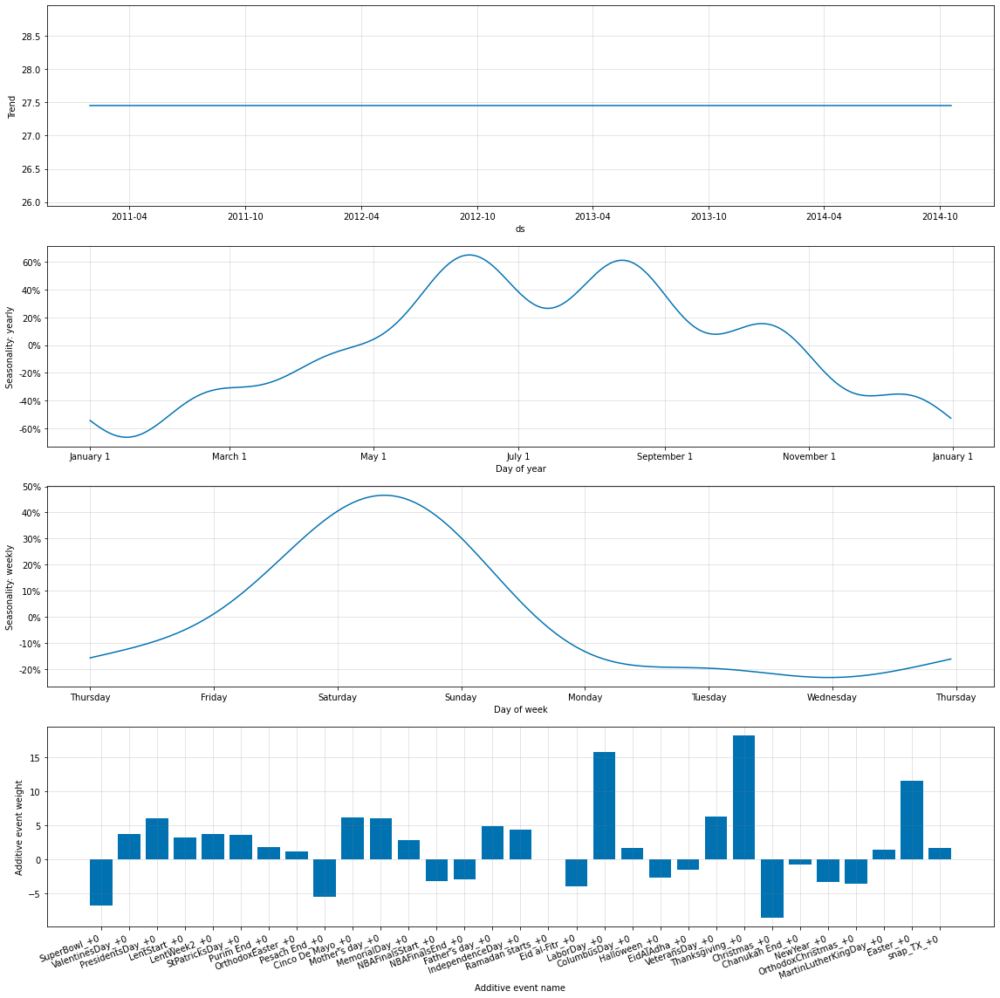

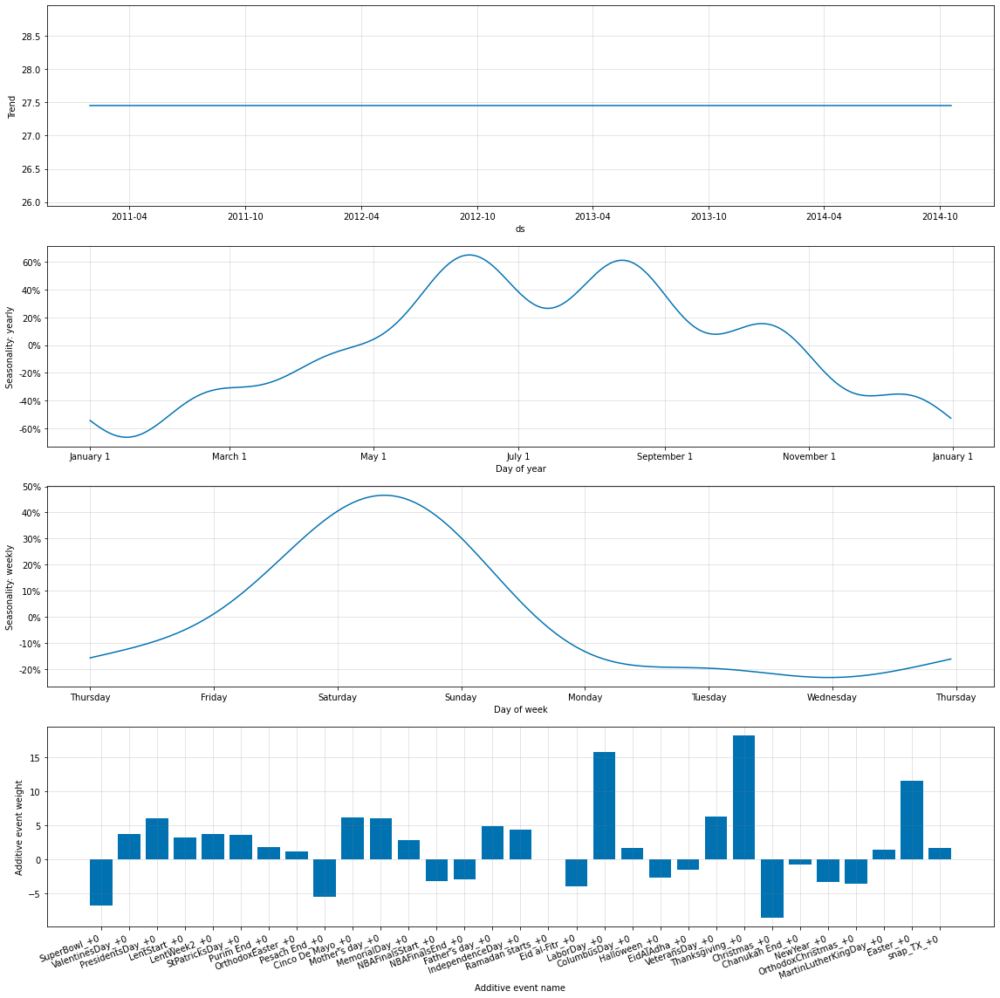

In [141]:
RMSE_Model = dic_models[int_RMSE_ModelNo]
RMSE_Model.plot_parameters(figsize=(16, 16),weekly_start=4)

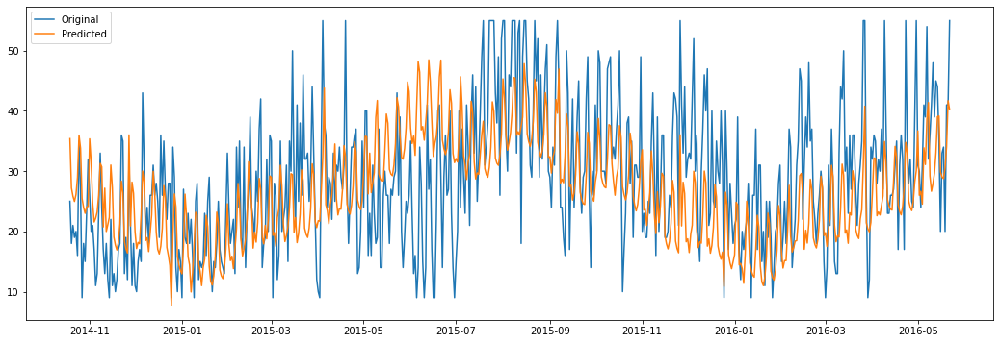

In [142]:
plot_forecast(df_forecasted_data_5.loc[(df_forecasted_data_5.model_No==int_RMSE_ModelNo)])

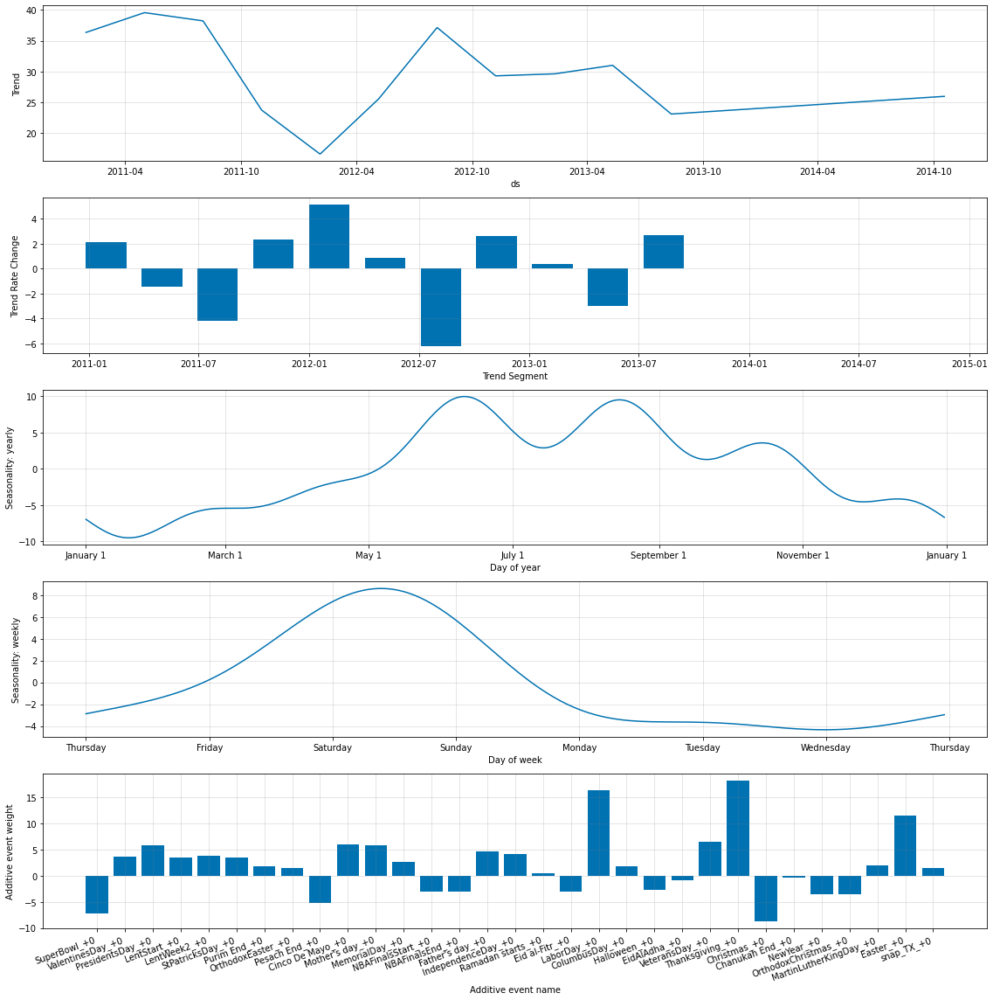

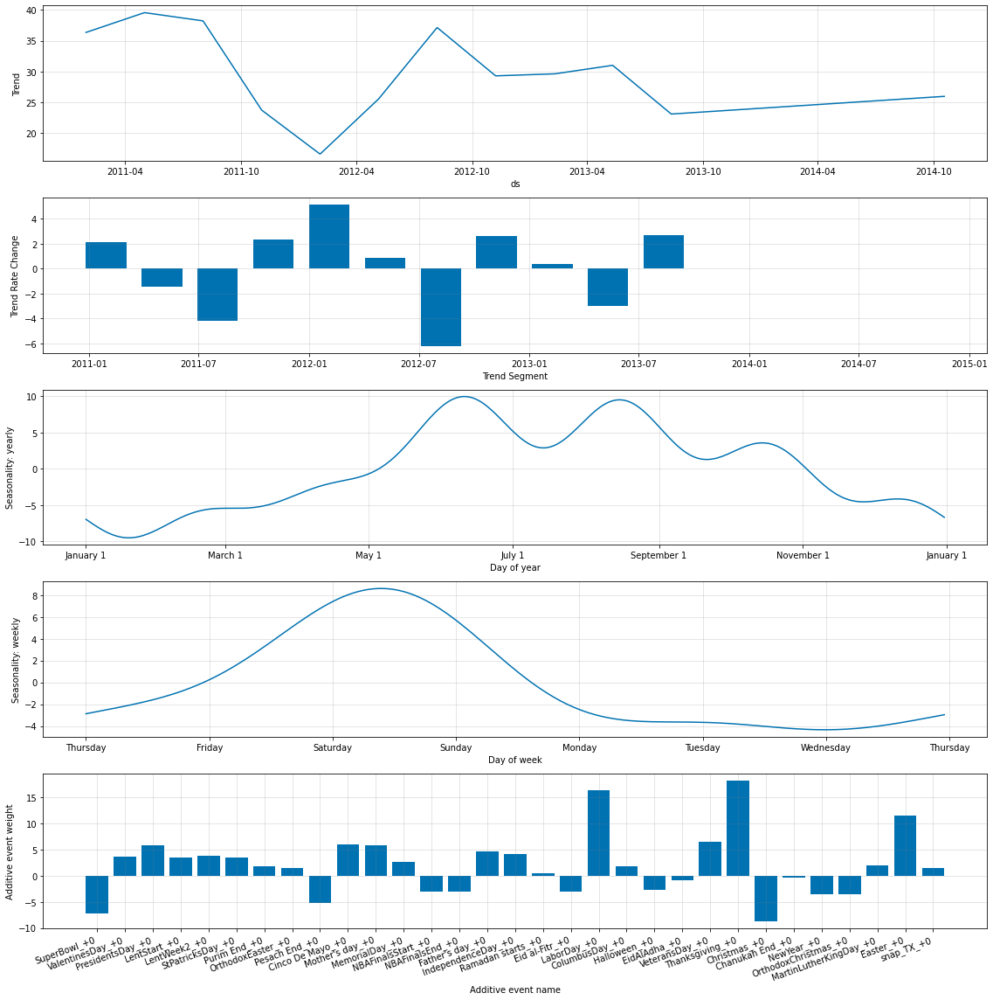

In [143]:
MAPE_Model = dic_models[int_MAPE_ModelNo]
MAPE_Model.plot_parameters(figsize=(16, 16),weekly_start=4)

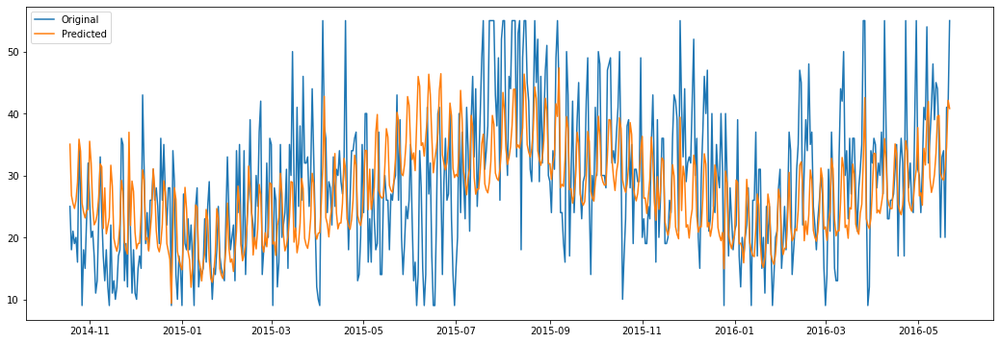

In [144]:
plot_forecast(df_forecasted_data_5.loc[(df_forecasted_data_5.model_No==int_MAPE_ModelNo)])

### FOODS_3_714_TX_2_evaluation

In [145]:
df_item6, df_TX_events, lst_TX_events = get_Product_data('FOODS_3_714_TX_2_evaluation','TX')

fig = go.Figure()
fig.add_trace(go.Scatter(x=df_item6.ds, y=df_item6.y, name = 'FOODS_3_714_TX_2_evaluation'))
fig.update_layout(xaxis_title="Time", yaxis_title="Sales",title="",title_x=0.5)
fig.show()

In [146]:
m = NeuralProphet(yearly_seasonality=False,
    weekly_seasonality= False,
    daily_seasonality=False,)
df = df_item6
df_train, df_test = m.split_df(df=df, freq="D", valid_p=0.3 )
metrics = m.fit(df=df_train, freq="D" , validation_df=df_test)
metrics.tail(1)

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 7.50E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.98E+01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.20E-01
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 12.82it/s, SmoothL1Loss=0.0291, MAE=7.94, RMSE=9.82, Loss=0.0217, RegLoss


,SmoothL1Loss,MAE,RMSE,Loss,RegLoss,SmoothL1Loss_val,MAE_val,RMSE_val
175,0.029112,7.944216,9.824631,0.021689,0.0,0.103202,16.513596,18.627043


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


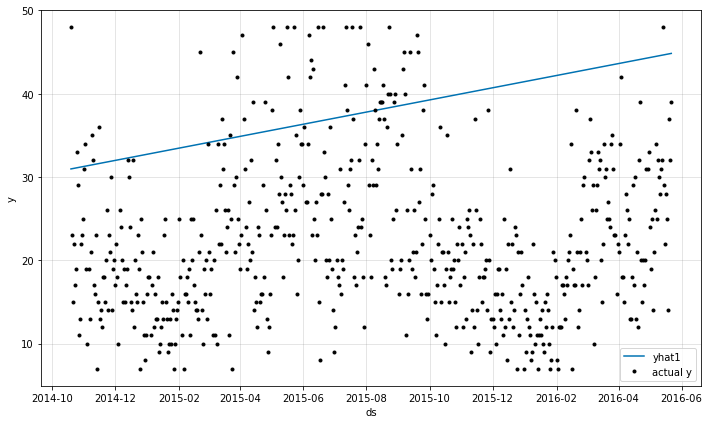

In [147]:
forecast = m.predict(df_test)
# m = m.highlight_nth_step_ahead_of_each_forecast(1)
fig = m.plot(forecast)

In [148]:
mape = mean_absolute_percentage_error(forecast.y,forecast.yhat1).round(2)
mape

1.06

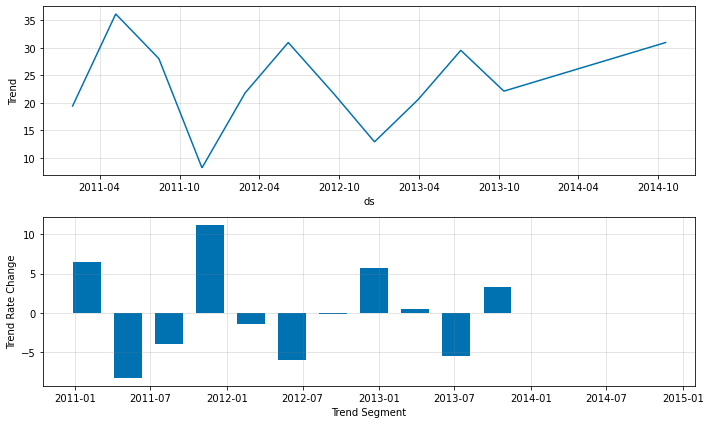

In [149]:
fig_param = m.plot_parameters(weekly_start=4)

In [150]:
m = NeuralProphet()
m.add_events(lst_TX_events)
df = m.create_df_with_events(df_item6, df_TX_events)
df_train, df_test = m.split_df(df=df, freq="D", valid_p=0.3 )
metrics = m.fit(df=df_train, freq="D" , validation_df=df_test)
metrics.tail(1)

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176

  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.54E-01, min: 3.46E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.54E-01, min: 4.07E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.33E-01
Epoch[176/176]: 100%|█| 176/176 [00:21<00:00,  8.29it/s, SmoothL1Loss=0.0164, MAE=5.8, RMSE=7.35, Loss=0.0123, RegLoss=


,SmoothL1Loss,MAE,RMSE,Loss,RegLoss,SmoothL1Loss_val,MAE_val,RMSE_val
175,0.016439,5.79588,7.349935,0.012314,0.0,0.044856,9.736558,12.28062


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


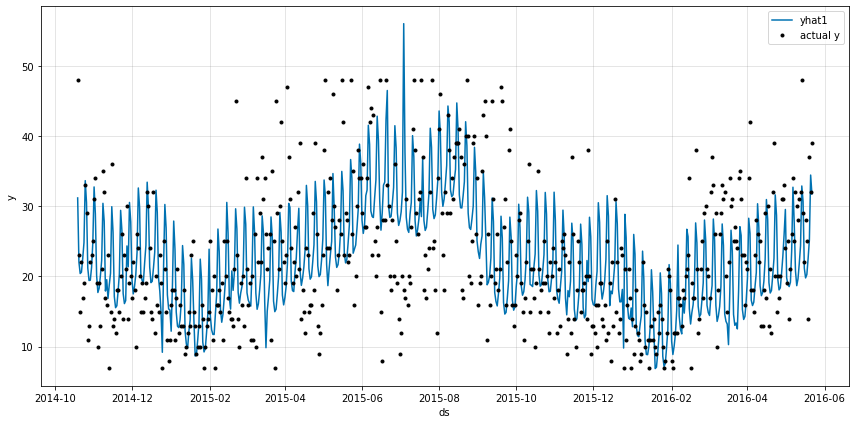

In [151]:
forecast = m.predict(df_test)
# m = m.highlight_nth_step_ahead_of_each_forecast(1)
fig = m.plot(forecast,figsize=(12, 6))

In [152]:
mape = mean_absolute_percentage_error(forecast.y,forecast.yhat1).round(2)
mape

0.32

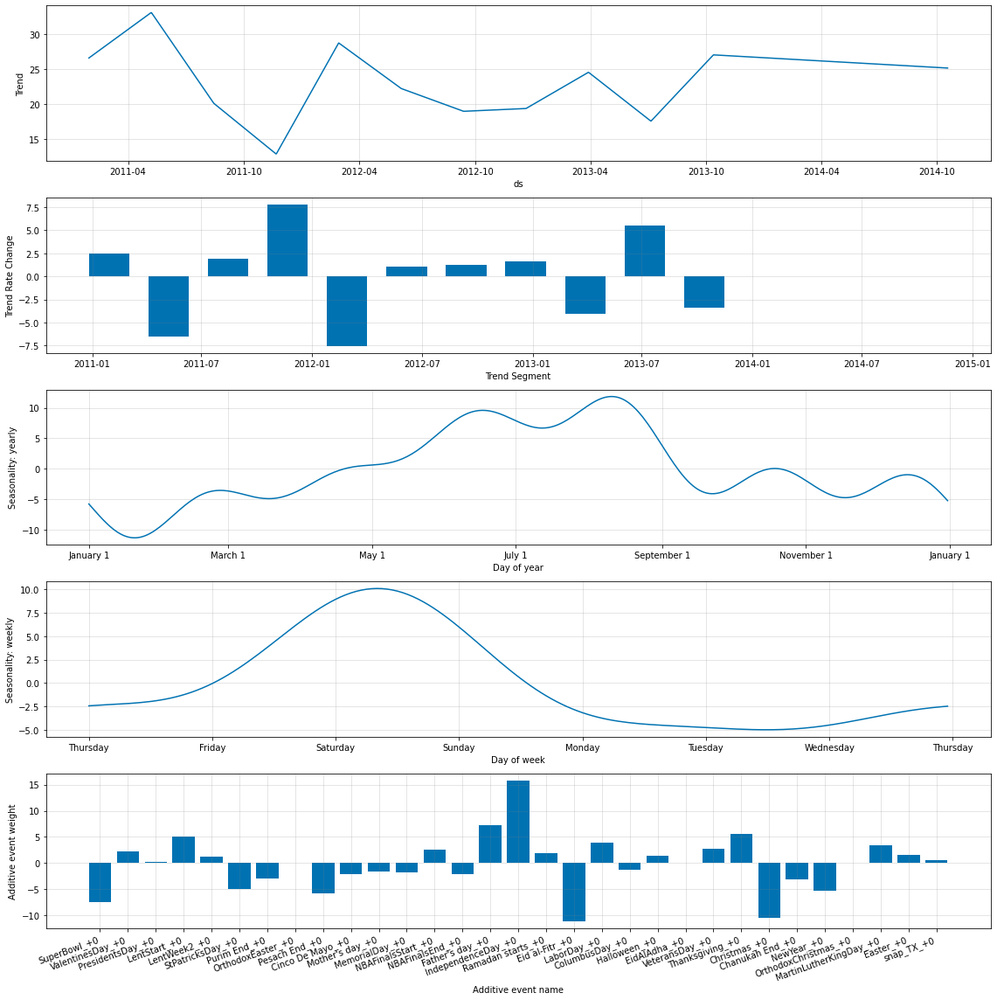

In [153]:
fig_param = m.plot_parameters(figsize=(16, 16),weekly_start=4)

In [154]:
param_grid_1 = {  
#     'ar_reg' : [1],
    'changepoints_range':[0.6,0.65,0.7,0.75,0.9,0.95,0.99],
#     'trend_reg' : [1],
    'growth' : ['off', 'linear'],
    'seasonality_mode' :['additive','multiplicative'],
    'num_hidden_layers': [0,1,2]
}

# Generate all combinations of parameters
all_params_1 = [dict(zip(param_grid_1.keys(), v)) for v in itertools.product(*param_grid_1.values())]
len(all_params_1)

84

In [155]:
results_6, df_forecasted_data_6, dic_models = run_NeuralProphet_with_hyperparams(all_params_1,
                                                                               df_item6,
                                                                               df_TX_events,
                                                                               lst_TX_events)

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.


Running Model No :  1  Out of  84 {'changepoints_range': 0.6, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.13E-01, min: 2.84E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.50E-01, min: 2.05E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.75E-01
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.97it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.32, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  2  Out of  84 {'changepoints_range': 0.6, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.54E-01, min: 1.49E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.54E-01, min: 2.05E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.33E-01
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 12.96it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.31, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  3  Out of  84 {'changepoints_range': 0.6, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 2.05E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.65E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.77it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.31, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  4  Out of  84 {'changepoints_range': 0.6, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 5.62E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 5.62E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.77E-02
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 13.10it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.3, Loss=0.0153, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  5  Out of  84 {'changepoints_range': 0.6, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.96E-02, min: 6.61E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.96E-02, min: 2.13E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.26E-02
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 13.24it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.3, Loss=0.0153, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  6  Out of  84 {'changepoints_range': 0.6, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 6.61E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 5.62E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 14.05it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.26, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  7  Out of  84 {'changepoints_range': 0.6, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.26E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 2.50E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.20E-02
Epoch[176/176]: 100%|█| 176/176 [00:15<00:00, 11.04it/s, SmoothL1Loss=0.0161, MAE=5.71, RMSE=7.28, Loss=0.0122, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  8  Out of  84 {'changepoints_range': 0.6, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 2.94E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 2.94E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.37E-02
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.40it/s, SmoothL1Loss=0.0161, MAE=5.71, RMSE=7.29, Loss=0.0122, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  9  Out of  84 {'changepoints_range': 0.6, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.49E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.54E-01, min: 1.49E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.26E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.27it/s, SmoothL1Loss=0.016, MAE=5.71, RMSE=7.27, Loss=0.0122, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  10  Out of  84 {'changepoints_range': 0.6, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 2.41E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 6.61E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.63it/s, SmoothL1Loss=0.0162, MAE=5.75, RMSE=7.31, Loss=0.0123, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  11  Out of  84 {'changepoints_range': 0.6, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 9.14E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.96E-02, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.61E-02
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.70it/s, SmoothL1Loss=0.0162, MAE=5.75, RMSE=7.3, Loss=0.0123, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  12  Out of  84 {'changepoints_range': 0.6, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 4.78E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 3.05E-02, min: 2.94E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.37E-02
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.41it/s, SmoothL1Loss=0.0162, MAE=5.75, RMSE=7.3, Loss=0.0123, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  13  Out of  84 {'changepoints_range': 0.65, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.02E-01
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 13.35it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.3, Loss=0.0153, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  14  Out of  84 {'changepoints_range': 0.65, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 7.77E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 9.14E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 14.27it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.31, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  15  Out of  84 {'changepoints_range': 0.65, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 9.14E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 2.41E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.65E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.82it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.31, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  16  Out of  84 {'changepoints_range': 0.65, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 4.78E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 4.07E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.98E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.95it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.31, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  17  Out of  84 {'changepoints_range': 0.65, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.26E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.49E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 14.36it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.32, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  18  Out of  84 {'changepoints_range': 0.65, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.96E-02, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 2.41E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.61E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.92it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.28, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  19  Out of  84 {'changepoints_range': 0.65, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 7.77E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.98E-02
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.76it/s, SmoothL1Loss=0.0161, MAE=5.74, RMSE=7.29, Loss=0.0122, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  20  Out of  84 {'changepoints_range': 0.65, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 9.14E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.54E-01, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.13E-01
Epoch[176/176]: 100%|█| 176/176 [00:18<00:00,  9.44it/s, SmoothL1Loss=0.016, MAE=5.71, RMSE=7.28, Loss=0.0121, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  21  Out of  84 {'changepoints_range': 0.65, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 2.84E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.13E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.24it/s, SmoothL1Loss=0.0161, MAE=5.73, RMSE=7.26, Loss=0.0122, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  22  Out of  84 {'changepoints_range': 0.65, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 2.41E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 2.41E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.20E-01
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.67it/s, SmoothL1Loss=0.0159, MAE=5.69, RMSE=7.25, Loss=0.0121, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  23  Out of  84 {'changepoints_range': 0.65, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.54E-01, min: 5.62E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.54E-01, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.33E-01
Epoch[176/176]: 100%|█| 176/176 [00:15<00:00, 11.15it/s, SmoothL1Loss=0.0159, MAE=5.68, RMSE=7.25, Loss=0.0121, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  24  Out of  84 {'changepoints_range': 0.65, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 3.59E-02, min: 9.14E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 3.59E-02, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 5.05E-02
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.41it/s, SmoothL1Loss=0.0161, MAE=5.74, RMSE=7.29, Loss=0.0122, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  25  Out of  84 {'changepoints_range': 0.7, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 6.61E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.02E-01
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 14.48it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.32, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  26  Out of  84 {'changepoints_range': 0.7, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.81E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.81E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.77E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 14.19it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.32, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  27  Out of  84 {'changepoints_range': 0.7, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 7.77E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.65E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 14.02it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.3, Loss=0.0153, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  28  Out of  84 {'changepoints_range': 0.7, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.54E-01, min: 5.42E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 2.84E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.26E-01
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 14.30it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.28, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  29  Out of  84 {'changepoints_range': 0.7, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 4.61E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 7.77E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.65E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.77it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.33, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  30  Out of  84 {'changepoints_range': 0.7, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.13E-01, min: 4.78E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.13E-01, min: 4.78E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.65E-01
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 14.47it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.32, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  31  Out of  84 {'changepoints_range': 0.7, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.65E-02
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.85it/s, SmoothL1Loss=0.0162, MAE=5.74, RMSE=7.31, Loss=0.0123, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  32  Out of  84 {'changepoints_range': 0.7, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.13E-01, min: 3.46E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.07E+00, min: 3.05E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 2.84E-01
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.76it/s, SmoothL1Loss=0.0162, MAE=5.74, RMSE=7.29, Loss=0.0123, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  33  Out of  84 {'changepoints_range': 0.7, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 2.05E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 2.41E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.07E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.02it/s, SmoothL1Loss=0.0162, MAE=5.75, RMSE=7.32, Loss=0.0123, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  34  Out of  84 {'changepoints_range': 0.7, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.54E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.54E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.77E-02
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.14it/s, SmoothL1Loss=0.0162, MAE=5.75, RMSE=7.31, Loss=0.0123, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  35  Out of  84 {'changepoints_range': 0.7, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.49E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 3.34E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.77E-02
Epoch[176/176]: 100%|█| 176/176 [00:20<00:00,  8.70it/s, SmoothL1Loss=0.0162, MAE=5.75, RMSE=7.33, Loss=0.0123, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  36  Out of  84 {'changepoints_range': 0.7, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.96E-02, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 9.14E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.61E-02
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.03it/s, SmoothL1Loss=0.0162, MAE=5.75, RMSE=7.27, Loss=0.0123, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  37  Out of  84 {'changepoints_range': 0.75, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.54E-01, min: 6.61E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.54E-01, min: 7.77E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.33E-01
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.83it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.29, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  38  Out of  84 {'changepoints_range': 0.75, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 2.94E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 6.61E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.83it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.31, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  39  Out of  84 {'changepoints_range': 0.75, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 2.13E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 2.13E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.20E-02
Epoch[176/176]: 100%|█| 176/176 [00:15<00:00, 11.32it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.34, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  40  Out of  84 {'changepoints_range': 0.75, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.54E-01, min: 4.07E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.54E-01, min: 4.07E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.33E-01
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 13.44it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.29, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  41  Out of  84 {'changepoints_range': 0.75, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 6.61E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 7.77E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.14E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.79it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.3, Loss=0.0153, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  42  Out of  84 {'changepoints_range': 0.75, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.49E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 14.51it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.32, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  43  Out of  84 {'changepoints_range': 0.75, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 9.47E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.96E-02, min: 1.11E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 5.94E-02
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.54it/s, SmoothL1Loss=0.0167, MAE=5.85, RMSE=7.44, Loss=0.0126, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  44  Out of  84 {'changepoints_range': 0.75, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 4.78E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 7.77E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.13E-01
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.58it/s, SmoothL1Loss=0.0165, MAE=5.81, RMSE=7.41, Loss=0.0124, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  45  Out of  84 {'changepoints_range': 0.75, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 2.13E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.65E-02
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.74it/s, SmoothL1Loss=0.0166, MAE=5.82, RMSE=7.41, Loss=0.0125, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  46  Out of  84 {'changepoints_range': 0.75, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 9.14E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.54E-01, min: 9.14E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.26E-01
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.81it/s, SmoothL1Loss=0.0165, MAE=5.79, RMSE=7.35, Loss=0.0124, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  47  Out of  84 {'changepoints_range': 0.75, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 1.11E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 5.62E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 5.62E-02
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.74it/s, SmoothL1Loss=0.0166, MAE=5.82, RMSE=7.39, Loss=0.0125, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  48  Out of  84 {'changepoints_range': 0.75, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 9.14E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.77E-02
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.31it/s, SmoothL1Loss=0.0165, MAE=5.79, RMSE=7.38, Loss=0.0124, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  49  Out of  84 {'changepoints_range': 0.9, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 4.78E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.13E-01
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 14.01it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.32, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  50  Out of  84 {'changepoints_range': 0.9, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.26E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 9.14E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.02E-01
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 13.20it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.31, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  51  Out of  84 {'changepoints_range': 0.9, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.26E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.20E-01
Epoch[176/176]: 100%|█| 176/176 [00:14<00:00, 12.51it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.31, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  52  Out of  84 {'changepoints_range': 0.9, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.96E-02, min: 1.31E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 2.94E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.98E-02
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 12.59it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.31, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  53  Out of  84 {'changepoints_range': 0.9, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 4.61E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.73it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.32, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  54  Out of  84 {'changepoints_range': 0.9, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 2.05E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 7.77E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.65E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.70it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.32, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  55  Out of  84 {'changepoints_range': 0.9, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 5.62E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 5.62E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.07E-01
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.36it/s, SmoothL1Loss=0.0162, MAE=5.75, RMSE=7.32, Loss=0.0122, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  56  Out of  84 {'changepoints_range': 0.9, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.54E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.54E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.77E-02
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.58it/s, SmoothL1Loss=0.0164, MAE=5.78, RMSE=7.35, Loss=0.0123, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  57  Out of  84 {'changepoints_range': 0.9, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.54E-01, min: 1.75E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.81E-01, min: 2.84E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.41E-01
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.57it/s, SmoothL1Loss=0.0163, MAE=5.76, RMSE=7.34, Loss=0.0123, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  58  Out of  84 {'changepoints_range': 0.9, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 1.11E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 1.11E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 5.62E-02
Epoch[176/176]: 100%|█| 176/176 [00:20<00:00,  8.46it/s, SmoothL1Loss=0.017, MAE=5.92, RMSE=7.5, Loss=0.0127, RegLoss=0
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  59  Out of  84 {'changepoints_range': 0.9, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.49E+00, min: 5.05E-07


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.26E+00, min: 1.20E-03
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 5.73E-01
Epoch[176/176]: 100%|█| 176/176 [00:19<00:00,  9.09it/s, SmoothL1Loss=0.0168, MAE=5.87, RMSE=7.44, Loss=0.0126, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  60  Out of  84 {'changepoints_range': 0.9, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 2.84E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 3.92E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.77E-02
Epoch[176/176]: 100%|█| 176/176 [00:18<00:00,  9.35it/s, SmoothL1Loss=0.0168, MAE=5.88, RMSE=7.46, Loss=0.0126, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  61  Out of  84 {'changepoints_range': 0.95, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.07E-01
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.66it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.33, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  62  Out of  84 {'changepoints_range': 0.95, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.13E-01
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 13.76it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.33, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  63  Out of  84 {'changepoints_range': 0.95, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.13E-01
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 14.52it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.31, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  64  Out of  84 {'changepoints_range': 0.95, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 6.61E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 6.61E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 14.46it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.33, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  65  Out of  84 {'changepoints_range': 0.95, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.31E-01, min: 1.04E+01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.20E-01
Epoch[176/176]: 100%|█| 176/176 [00:14<00:00, 12.39it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.33, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  66  Out of  84 {'changepoints_range': 0.95, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.13E-01, min: 4.07E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.13E-01, min: 4.78E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.65E-01
Epoch[176/176]: 100%|█| 176/176 [00:14<00:00, 12.05it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.31, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  67  Out of  84 {'changepoints_range': 0.95, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.77E-02
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.25it/s, SmoothL1Loss=0.0164, MAE=5.79, RMSE=7.37, Loss=0.0124, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  68  Out of  84 {'changepoints_range': 0.95, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.77E-02
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.95it/s, SmoothL1Loss=0.0164, MAE=5.79, RMSE=7.37, Loss=0.0124, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  69  Out of  84 {'changepoints_range': 0.95, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.11E-01, min: 9.14E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.54E-01, min: 7.77E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.20E-01
Epoch[176/176]: 100%|█| 176/176 [00:18<00:00,  9.30it/s, SmoothL1Loss=0.0163, MAE=5.76, RMSE=7.32, Loss=0.0123, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  70  Out of  84 {'changepoints_range': 0.95, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 1.49E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 2.84E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.37E-02
Epoch[176/176]: 100%|█| 176/176 [00:20<00:00,  8.74it/s, SmoothL1Loss=0.0168, MAE=5.88, RMSE=7.45, Loss=0.0127, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  71  Out of  84 {'changepoints_range': 0.95, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.26E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.49E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.20E-02
Epoch[176/176]: 100%|█| 176/176 [00:18<00:00,  9.58it/s, SmoothL1Loss=0.0168, MAE=5.88, RMSE=7.45, Loss=0.0127, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  72  Out of  84 {'changepoints_range': 0.95, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 2.05E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 5.62E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.98E-02
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.22it/s, SmoothL1Loss=0.0169, MAE=5.9, RMSE=7.47, Loss=0.0127, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  73  Out of  84 {'changepoints_range': 0.99, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 9.14E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 7.77E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.65E-02
Epoch[176/176]: 100%|█| 176/176 [00:15<00:00, 11.50it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.32, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  74  Out of  84 {'changepoints_range': 0.99, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.07E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:15<00:00, 11.46it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.32, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  75  Out of  84 {'changepoints_range': 0.99, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 2.94E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 9.47E-02, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 9.14E-02
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 12.93it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.3, Loss=0.0153, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  76  Out of  84 {'changepoints_range': 0.99, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.83E-02, min: 3.46E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.96E-02, min: 3.46E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.61E-02
Epoch[176/176]: 100%|█| 176/176 [00:12<00:00, 14.36it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.31, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  77  Out of  84 {'changepoints_range': 0.99, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.50E-01, min: 6.61E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.50E-01, min: 5.62E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.84E-01
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 13.34it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.33, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  78  Out of  84 {'changepoints_range': 0.99, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 2.05E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.75E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:13<00:00, 13.49it/s, SmoothL1Loss=0.0209, MAE=6.64, RMSE=8.34, Loss=0.0153, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  79  Out of  84 {'changepoints_range': 0.99, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 9.14E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.66E-02
Epoch[176/176]: 100%|█| 176/176 [00:25<00:00,  6.82it/s, SmoothL1Loss=0.0163, MAE=5.77, RMSE=7.34, Loss=0.0123, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  80  Out of  84 {'changepoints_range': 0.99, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 1}


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.926% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.26E+00


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 1.07E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 7.77E-02
Epoch[176/176]: 100%|█| 176/176 [00:19<00:00,  9.20it/s, SmoothL1Loss=0.0163, MAE=5.77, RMSE=7.32, Loss=0.0123, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  81  Out of  84 {'changepoints_range': 0.99, 'growth': 'linear', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 6.85E-02, min: 4.78E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 8.06E-02, min: 1.75E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.20E-02
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.35it/s, SmoothL1Loss=0.0163, MAE=5.77, RMSE=7.32, Loss=0.0123, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  82  Out of  84 {'changepoints_range': 0.99, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 0}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.96E-02, min: 5.62E-01


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.96E-02, min: 1.26E+00
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 6.26E-02
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.48it/s, SmoothL1Loss=0.0169, MAE=5.9, RMSE=7.47, Loss=0.0127, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  83  Out of  84 {'changepoints_range': 0.99, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.13E-01, min: 5.14E-03


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.50E-01, min: 4.37E-03
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.75E-01
Epoch[176/176]: 100%|█| 176/176 [00:16<00:00, 10.79it/s, SmoothL1Loss=0.0165, MAE=5.81, RMSE=7.37, Loss=0.0124, RegLoss
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.948% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal 

Running Model No :  84  Out of  84 {'changepoints_range': 0.99, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 2}


INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 176


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 7.50E+00, min: 8.06E-02


  0%|          | 0/129 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 7.77E-01, min: 8.06E-02
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 8.35E-01
Epoch[176/176]: 100%|█| 176/176 [00:17<00:00, 10.26it/s, SmoothL1Loss=0.0165, MAE=5.8, RMSE=7.37, Loss=0.0124, RegLoss=
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.828% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


In [156]:
results_6

,model_No,params,RMSE,MAPE
0,1,"{'changepoints_range': 0.6, 'growth': 'off', '...",12.047883,0.306394
0,2,"{'changepoints_range': 0.6, 'growth': 'off', '...",11.864038,0.307116
0,3,"{'changepoints_range': 0.6, 'growth': 'off', '...",11.611329,0.306300
0,4,"{'changepoints_range': 0.6, 'growth': 'off', '...",11.634609,0.306924
0,5,"{'changepoints_range': 0.6, 'growth': 'off', '...",11.369956,0.306918
...,...,...,...,...
0,80,"{'changepoints_range': 0.99, 'growth': 'linear...",15.800152,1.949873
0,81,"{'changepoints_range': 0.99, 'growth': 'linear...",12.370706,1.880406
0,82,"{'changepoints_range': 0.99, 'growth': 'linear...",24.986467,1.083113
0,83,"{'changepoints_range': 0.99, 'growth': 'linear...",11.502580,0.407994


In [157]:
int_RMSE_ModelNo = results_6.loc[(results_6.RMSE <= results_6.RMSE.min())].model_No.min()
int_MAPE_ModelNo = results_6.loc[(results_6.MAPE <= results_6.MAPE.min())].model_No.min()
results_6.loc[results_6.model_No.isin([int_RMSE_ModelNo,int_MAPE_ModelNo])]

,model_No,params,RMSE,MAPE
0,63,"{'changepoints_range': 0.95, 'growth': 'off', ...",11.731727,0.306290
0,77,"{'changepoints_range': 0.99, 'growth': 'off', ...",10.626826,0.306754


In [158]:
print( 'RMSE Best Params : ', results_6.loc[results_6.model_No == int_RMSE_ModelNo].params.to_list())
print( 'MAPE Best Params : ', results_6.loc[results_6.model_No == int_MAPE_ModelNo].params.to_list())

RMSE Best Params :  [{'changepoints_range': 0.99, 'growth': 'off', 'seasonality_mode': 'multiplicative', 'num_hidden_layers': 1}]
MAPE Best Params :  [{'changepoints_range': 0.95, 'growth': 'off', 'seasonality_mode': 'additive', 'num_hidden_layers': 2}]


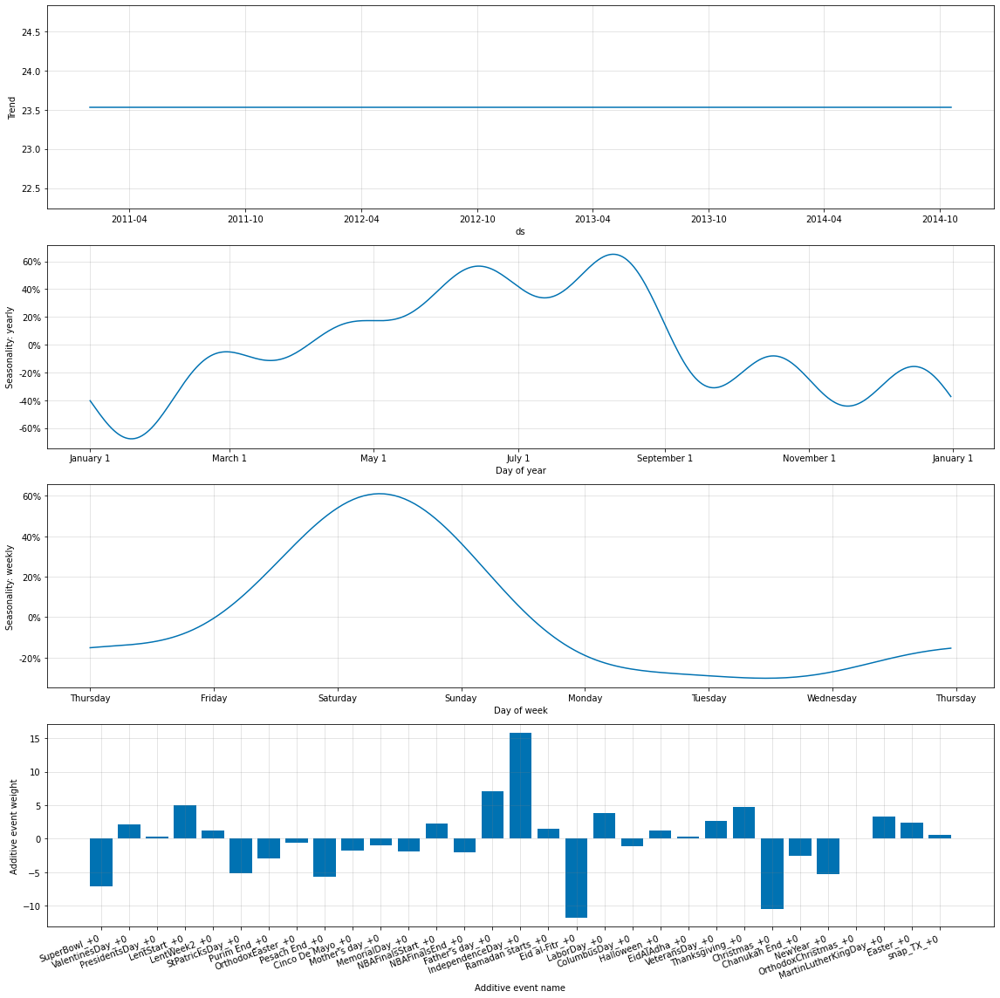

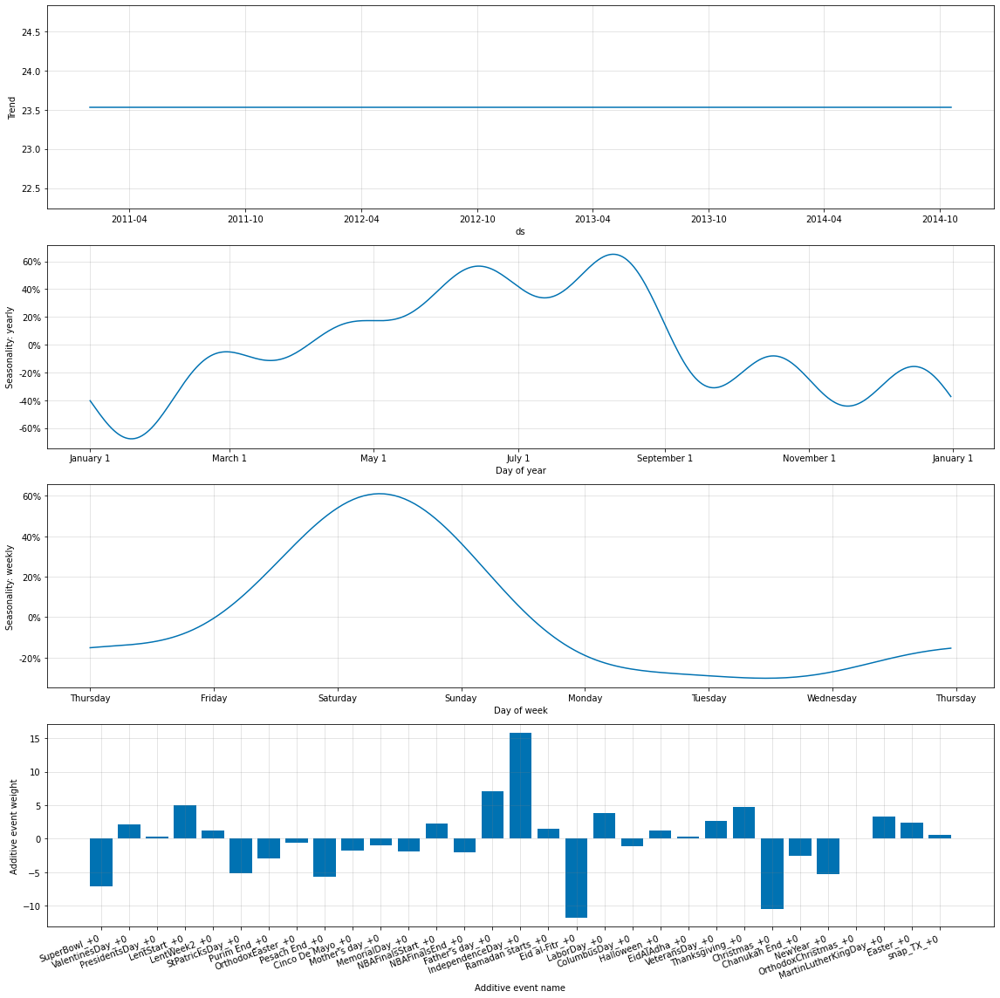

In [159]:
RMSE_Model = dic_models[int_RMSE_ModelNo]
RMSE_Model.plot_parameters(figsize=(16, 16),weekly_start=4)

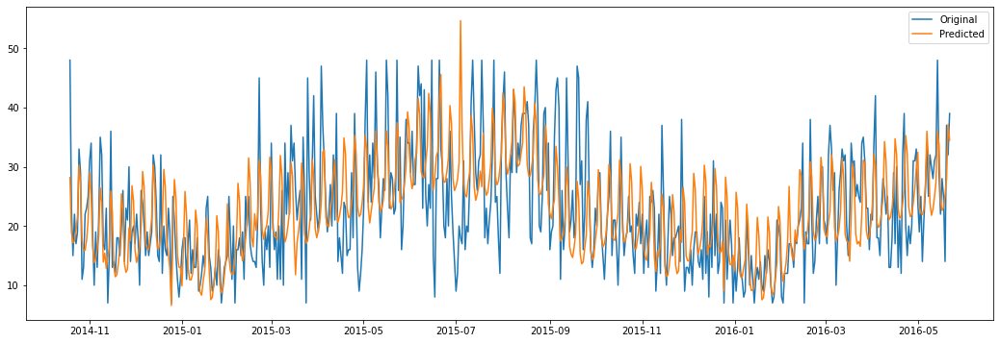

In [160]:
plot_forecast(df_forecasted_data_6.loc[(df_forecasted_data_6.model_No==int_RMSE_ModelNo)])

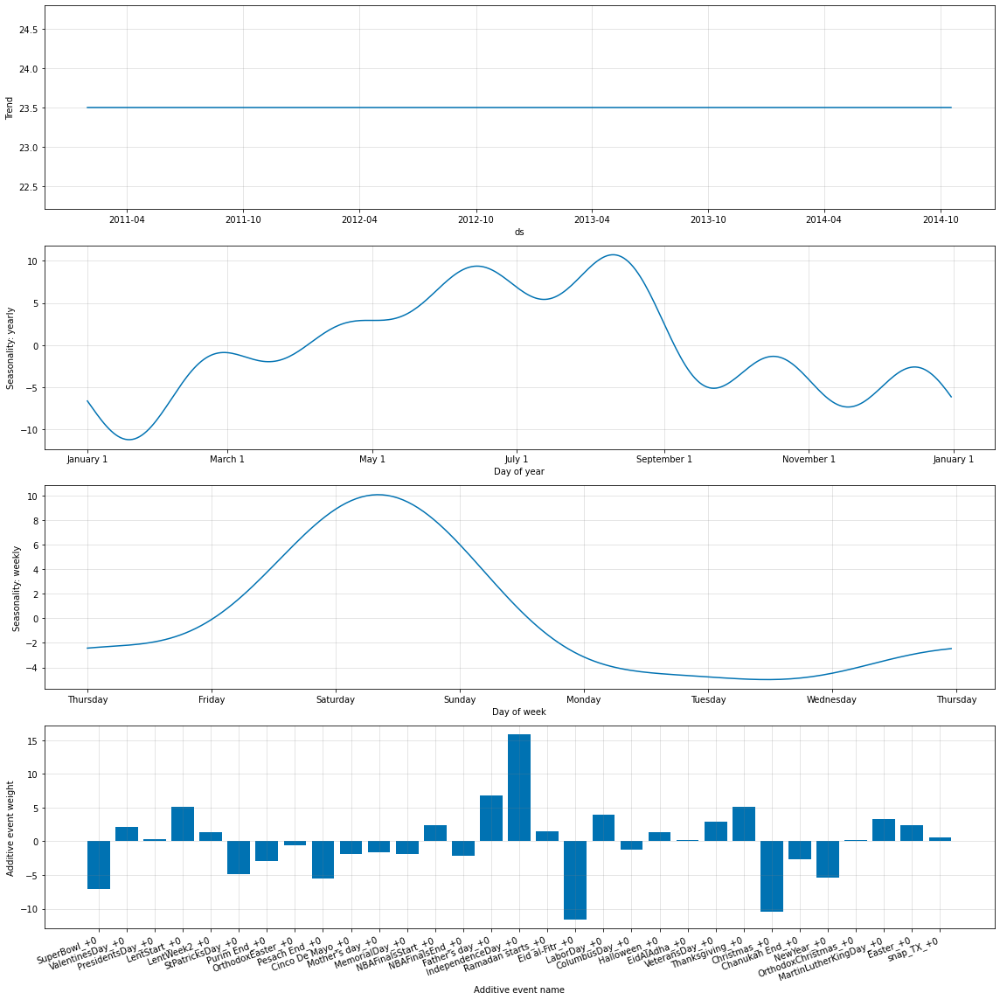

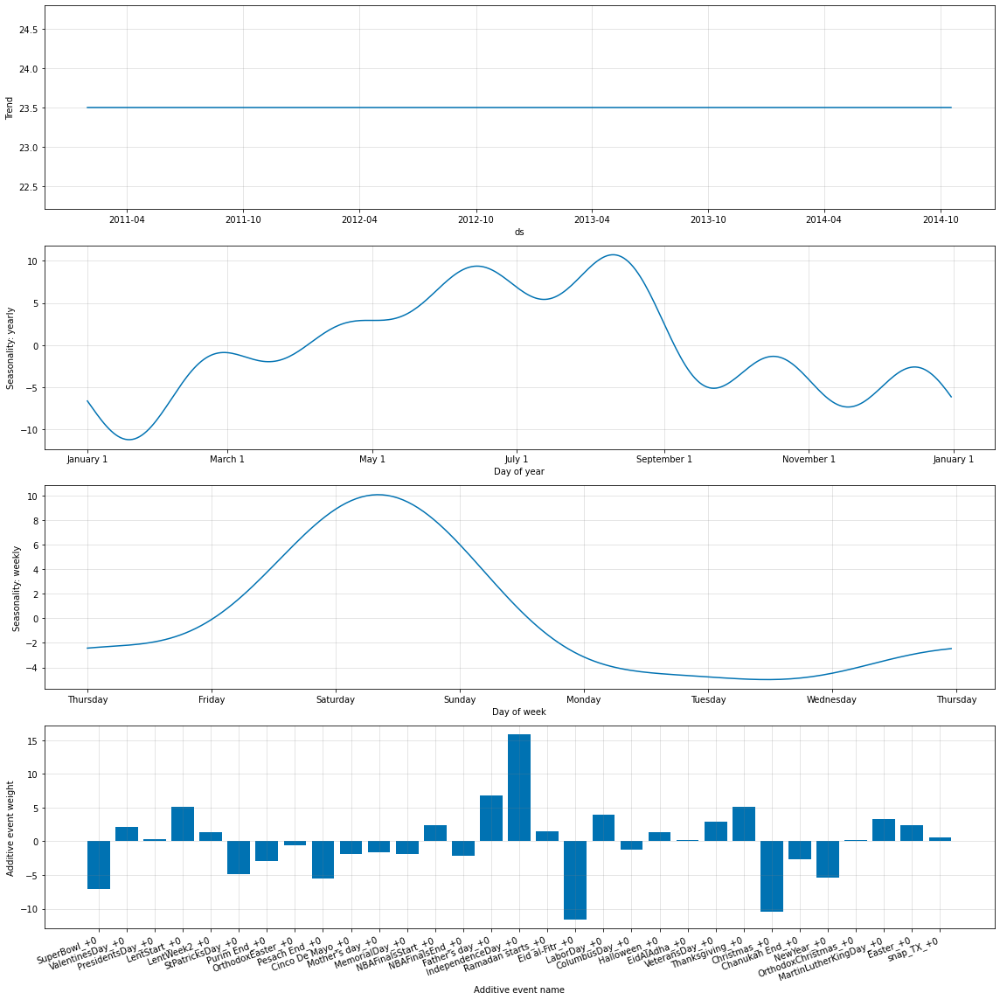

In [161]:
MAPE_Model = dic_models[int_MAPE_ModelNo]
MAPE_Model.plot_parameters(figsize=(16, 16),weekly_start=4)

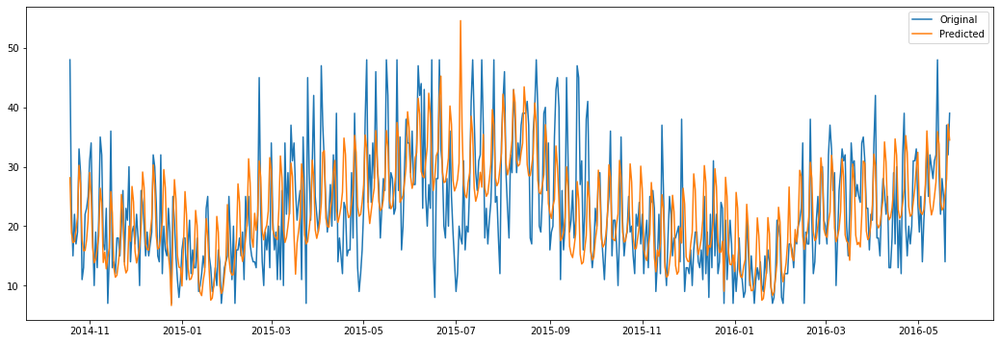

In [162]:
plot_forecast(df_forecasted_data_6.loc[(df_forecasted_data_5.model_No==int_MAPE_ModelNo)])